In [1]:
#we load the necessary libraries

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import quantstats as qs

quarters = ['2023_Q1', '2023_Q3', '2023_Q4',
            '2024_Q2', '2024_Q4',
            '2025_Q1', '2025_Q2']
from statsmodels.tsa.stattools import coint
from statsmodels.tsa.stattools import adfuller


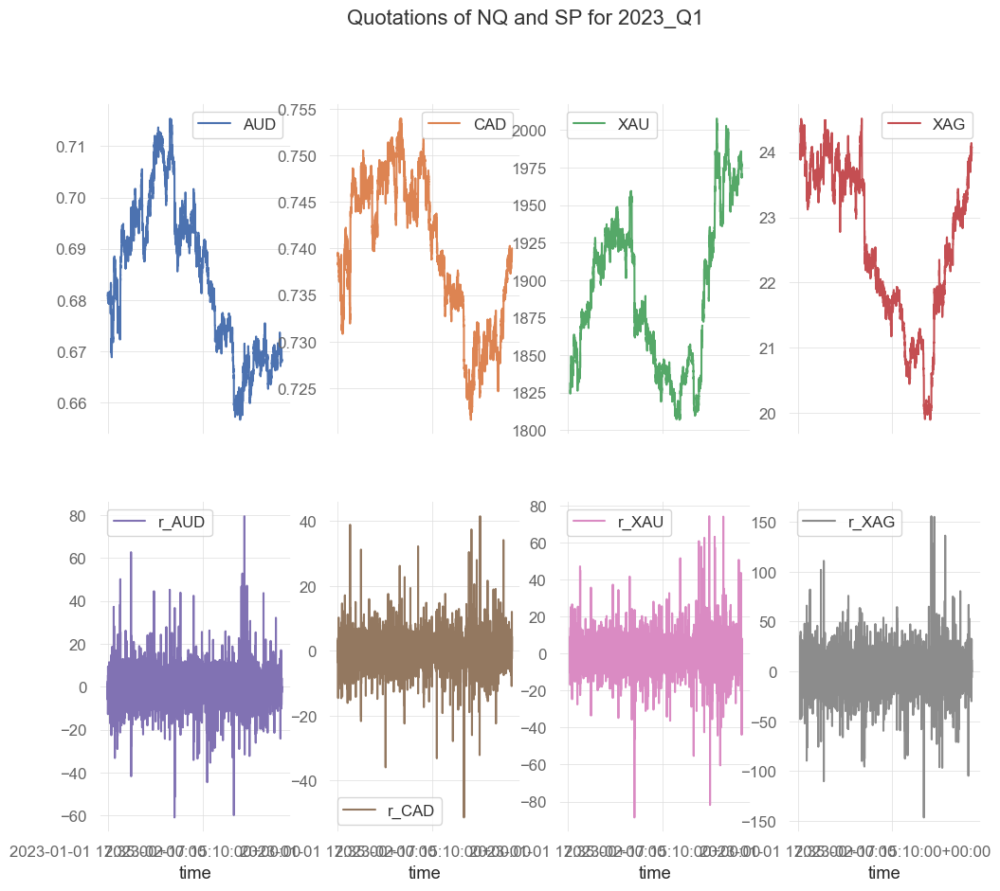

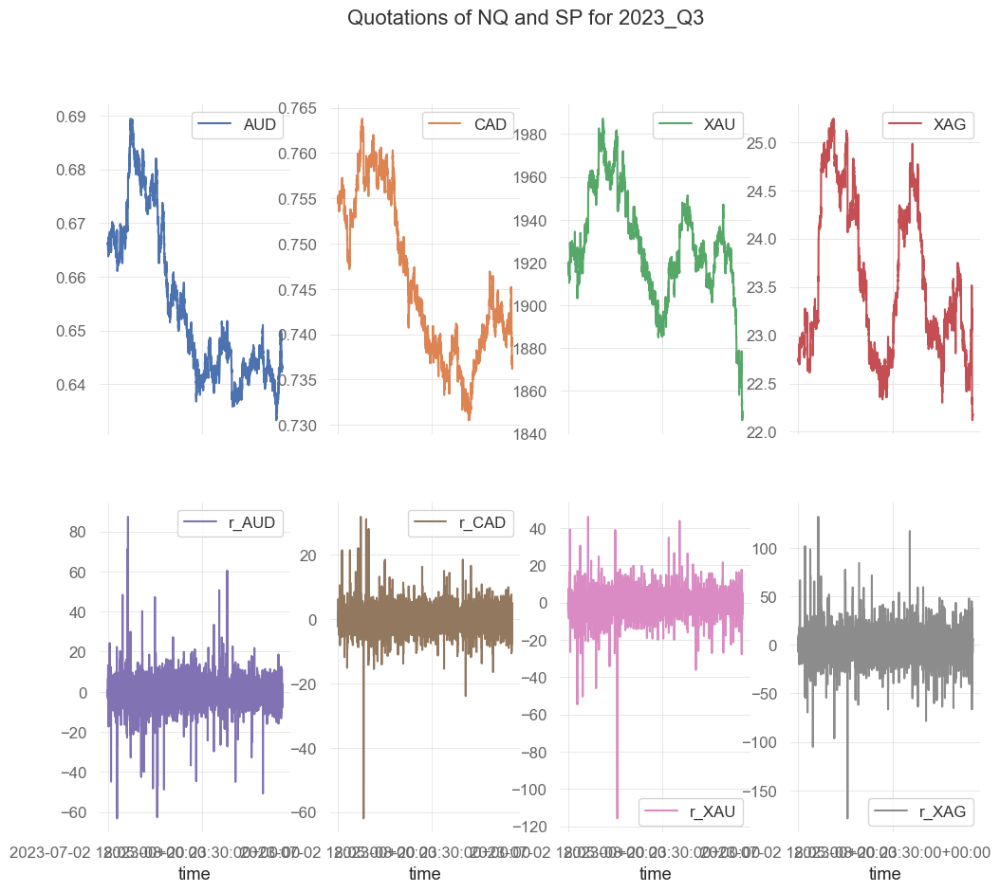

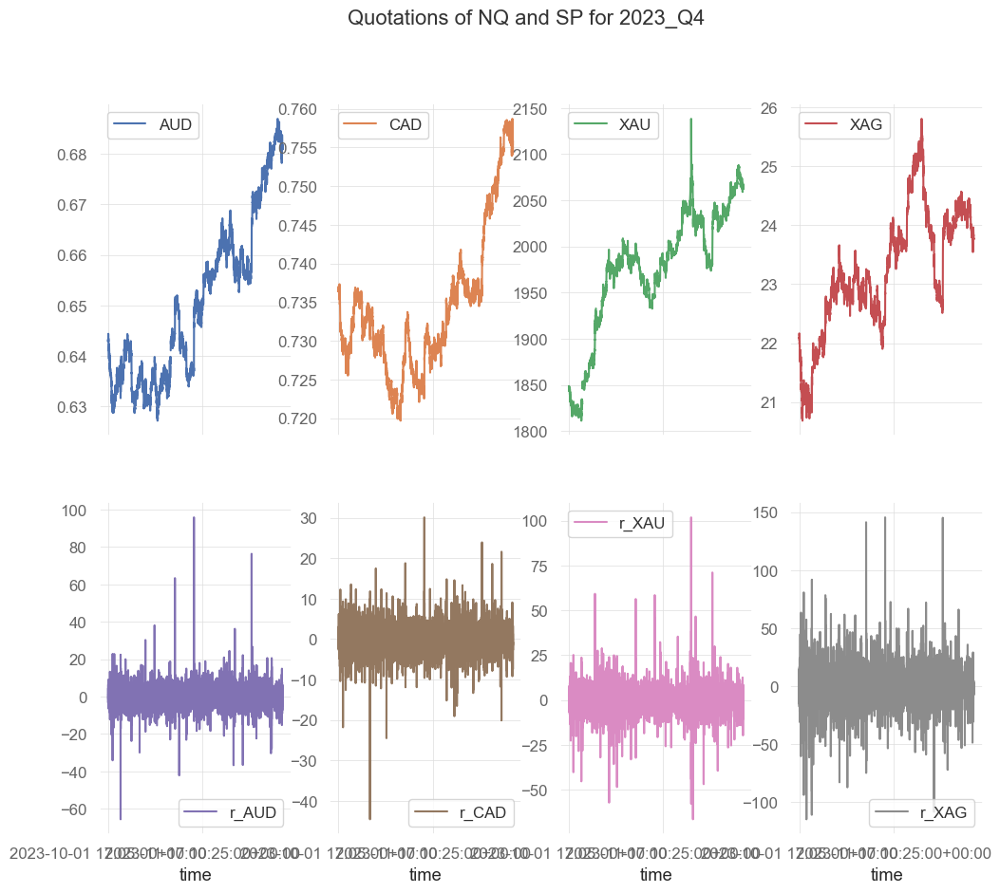

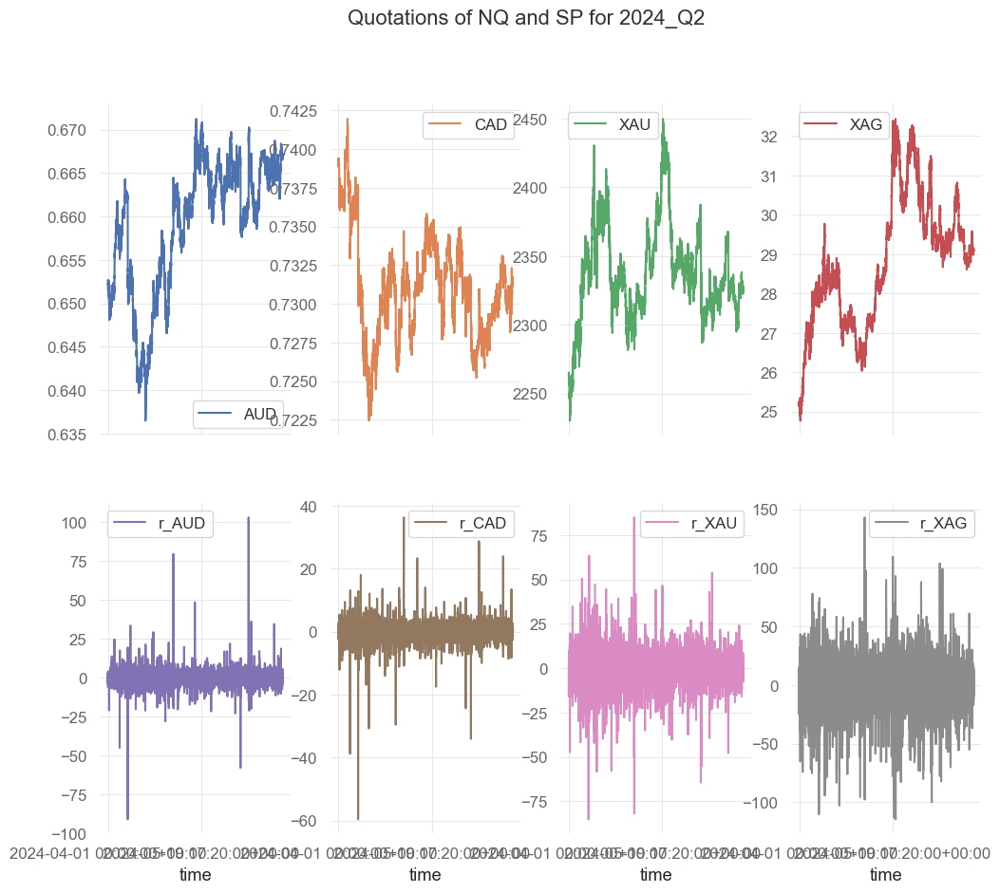

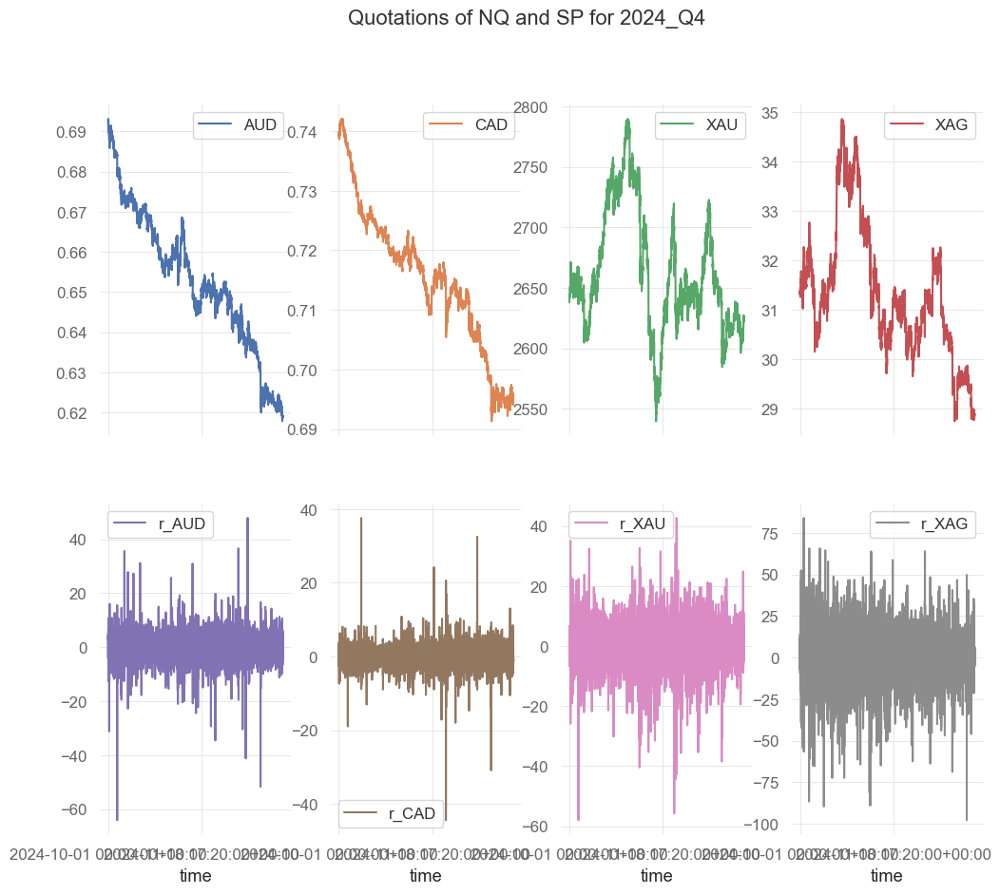

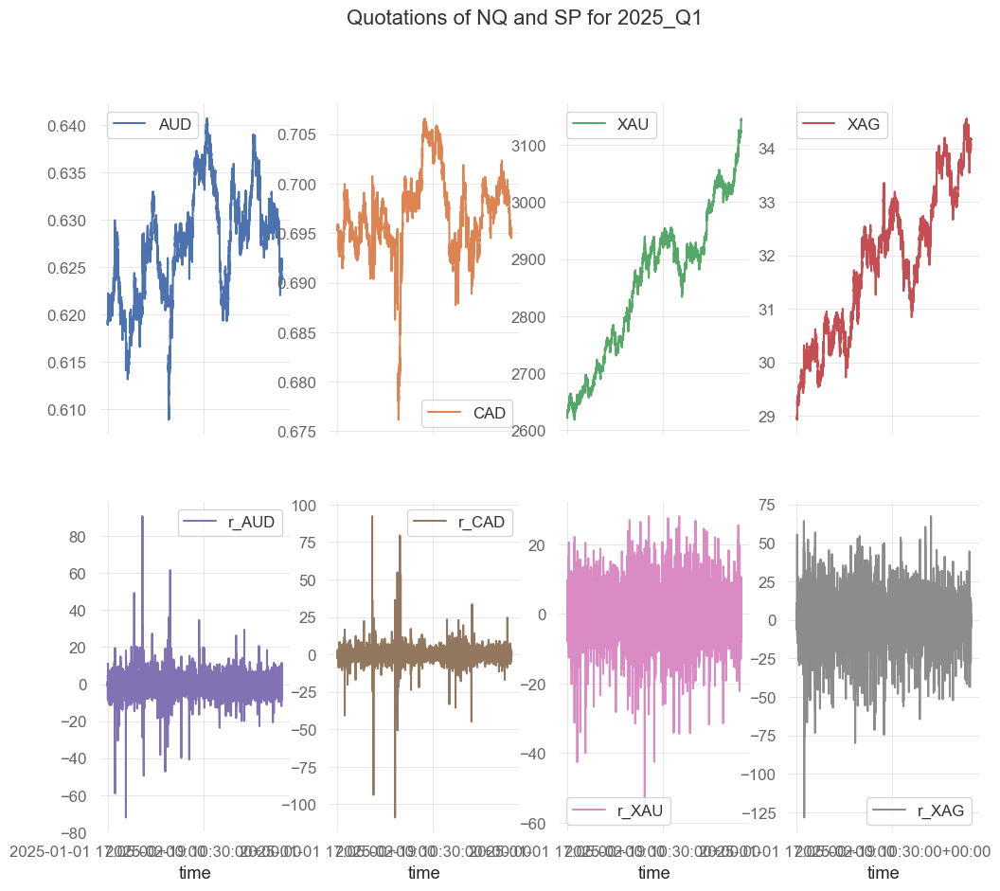

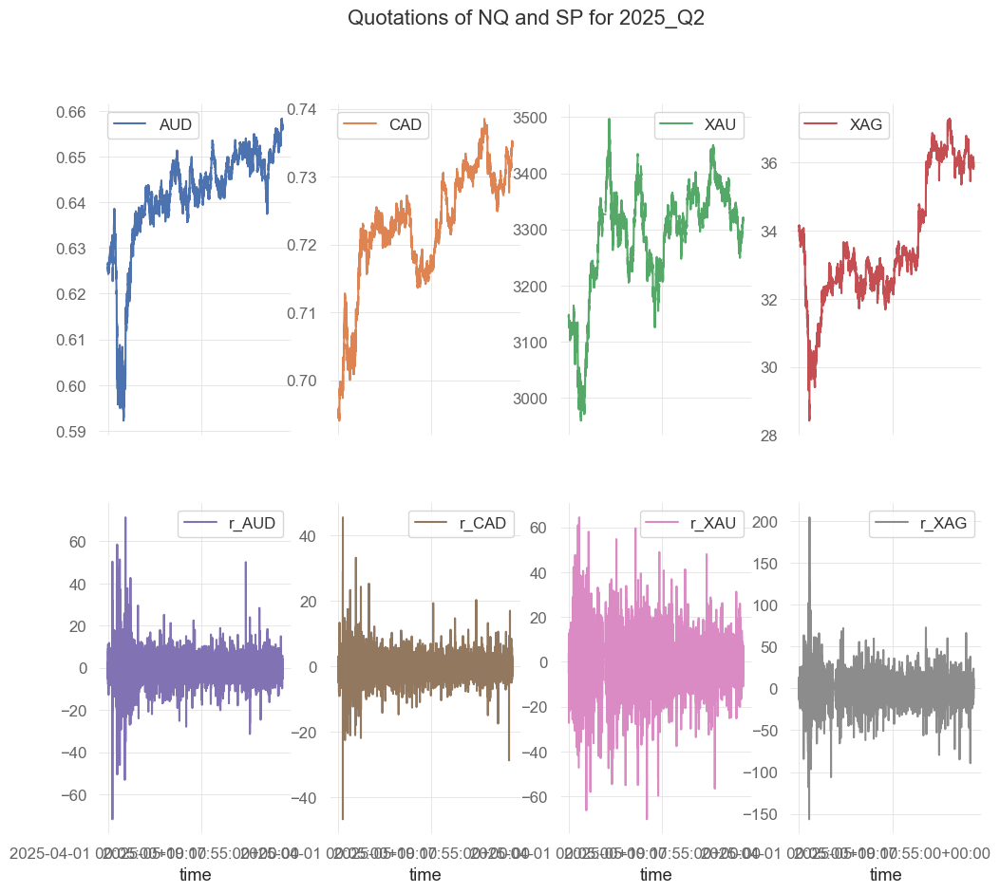

Combined data saved to 'data/all_quarters_data.parquet'
Total rows: 129770

Data summary:
quarter
2023_Q1    18398
2023_Q3    18539
2023_Q4    18517
2024_Q2    18716
2024_Q4    18682
2025_Q1    18208
2025_Q2    18710
dtype: int64

First few rows:
                               AUD       CAD  XAU  XAG     r_AUD     r_CAD  \
datetime                                                                     
2023-01-01 17:35:00+00:00      NaN       NaN  NaN  NaN       NaN       NaN   
2023-01-01 18:00:00+00:00      NaN       NaN  NaN  NaN       NaN       NaN   
2023-01-01 18:05:00+00:00  0.68142       NaN  NaN  NaN       NaN       NaN   
2023-01-01 18:15:00+00:00  0.68123  0.739557  NaN  NaN -2.788684       NaN   
2023-01-01 18:20:00+00:00  0.68083  0.739552  NaN  NaN -5.873457 -0.073955   

                           r_XAU  r_XAG  quarter  
datetime                                          
2023-01-01 17:35:00+00:00    NaN    NaN  2023_Q1  
2023-01-01 18:00:00+00:00    NaN    NaN  2023_Q1  
20

In [2]:
# Combine all quarterly data into one file with quarter identification
all_data_list = []

for quarter in quarters:
    data2 = pd.read_parquet(f'data/data2_{quarter}.parquet')
    data2['datetime'] = pd.to_datetime(data2['datetime'])
    data2.set_index('datetime', inplace=True)
    
    data_r = np.log(data2 / data2.shift(1)) * 10000
    data_r.columns = ['r_' + col for col in data_r.columns]
    
    data_2_temp = pd.concat(
        [data2[['AUD', 'CAD', 'XAU', 'XAG']],
        data_r[['r_AUD', 'r_CAD', 'r_XAU', 'r_XAG']]],
        axis=1
    )
    
    data_2_plot = data_2_temp.copy()
    data_2_plot['time'] = data_2_plot.index.astype(str)

    # We reset the index to make 'time' a column
    data_2_plot = data_2_plot.reset_index(drop = True)

    # Let's set time as the X-axis and draw the graphs
    data_2_plot.plot(
        x = 'time',
        subplots = True,
        layout = (2, 4),
        title = "Quotations of NQ and SP for" + f" {quarter}",
        figsize = (12, 10)
    )
    plt.show()
    
    # Add quarter column
    data_2_temp['quarter'] = quarter
    
    all_data_list.append(data_2_temp)

# Combine all data
all_data = pd.concat(all_data_list, axis=0)

# Save to parquet file
all_data.to_parquet('data/all_quarters_data.parquet')

print(f"Combined data saved to 'data/all_quarters_data.parquet'")
print(f"Total rows: {len(all_data)}")
print(f"\nData summary:")
print(all_data.groupby('quarter').size())
print(f"\nFirst few rows:")
print(all_data.head())
print(f"\nLast few rows:")
print(all_data.tail())
    

XAU i XAG

### Spread based on Prices



All Average Ratios by Quarter:
                            av_ratio  quarter
2023-01-03 00:00:00+00:00  75.949170  2023_Q1
2023-01-04 00:00:00+00:00  76.085025  2023_Q1
2023-01-05 00:00:00+00:00  77.290013  2023_Q1
2023-01-06 00:00:00+00:00  78.737054  2023_Q1
2023-01-09 00:00:00+00:00  78.403192  2023_Q1
...                              ...      ...
2025-06-26 00:00:00+00:00  92.336639  2025_Q2
2025-06-27 00:00:00+00:00  91.080982  2025_Q2
2025-06-30 00:00:00+00:00  90.832889  2025_Q2
2025-06-30 00:00:00+00:00  91.074474  2025_Q2
2025-07-01 00:00:00+00:00  91.449808  2025_Q2

[545 rows x 2 columns]

Summary of XAU/XAG Ratio by Quarter:
   Quarter  Mean_Ratio  Std_Ratio  Min_Ratio   Max_Ratio
0  2023_Q1   83.983394   3.698613  75.949170   91.139779
1  2023_Q3   81.884491   1.958840  78.649183   84.551539
2  2023_Q4   85.087269   1.593960  81.040295   87.573128
3  2024_Q2   81.283105   3.902434  73.265106   89.649342
4  2024_Q4   85.151006   2.389404  79.450270   90.576662
5  2025_Q1  

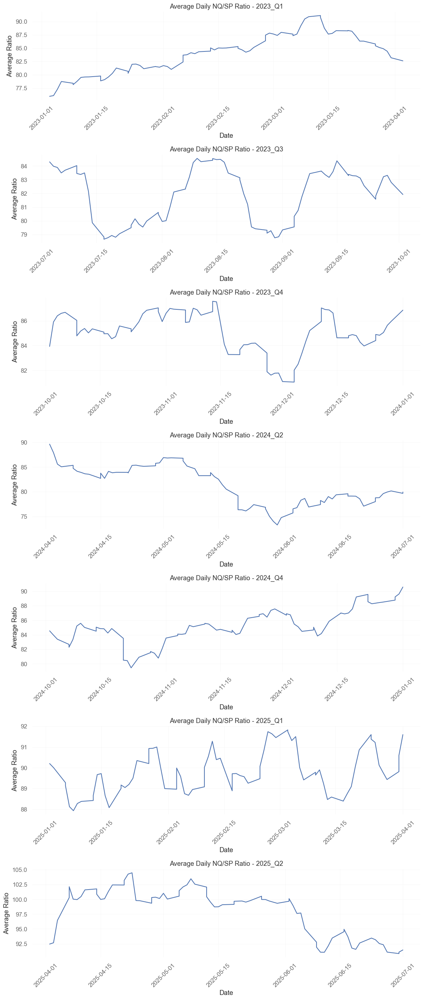

In [3]:
# Calculate the ratio for each quarter
ratio_results = []

# Initialize list to store all av_ratio data with quarter identification
all_av_ratios = []

for quarter in quarters:
    data2 = pd.read_parquet(f'data/data2_{quarter}.parquet')
    data2['datetime'] = pd.to_datetime(data2['datetime'])
    data2.set_index('datetime', inplace=True)
    
    data_r = np.log(data2 / data2.shift(1)) * 10000
    data_r.columns = ['r_' + col for col in data_r.columns]
    
    data_2_temp = pd.concat(
        [data2[['XAG', 'XAU']],
        data_r[['r_XAG', 'r_XAU']]],
        axis=1
    )
    
    # Compute the ratio SP / NQ
    ratio_temp = data_2_temp["XAU"] / data_2_temp["XAG"]
    
    # Compute daily averages
    av_ratio_temp = ratio_temp.resample("D").mean().dropna()
    
    # Store results
    ratio_results.append({
        'Quarter': quarter,
        'Mean_Ratio': av_ratio_temp.mean(),
        'Std_Ratio': av_ratio_temp.std(),
        'Min_Ratio': av_ratio_temp.min(),
        'Max_Ratio': av_ratio_temp.max()
    })
    
    # Store av_ratio with quarter identification
    av_ratio_quarter = av_ratio_temp.to_frame(name='av_ratio')
    av_ratio_quarter['quarter'] = quarter
    av_ratio_quarter.index = av_ratio_quarter.index + pd.to_timedelta(np.where(av_ratio_quarter.index.day_name() == "Friday", "3D", "1D")) + pd.Timedelta("0m")
    all_av_ratios.append(av_ratio_quarter)

# Combine all av_ratios into one DataFrame
all_av_ratios_df = pd.concat(all_av_ratios, axis=0)
print("\nAll Average Ratios by Quarter:")
print(all_av_ratios_df)

# Create summary dataframe
ratio_summary = pd.DataFrame(ratio_results)
print("\nSummary of XAU/XAG Ratio by Quarter:")
print(ratio_summary)

# Create charts for each quarter
fig, axes = plt.subplots(len(quarters), 1, figsize=(12, 4*len(quarters)))

for idx, quarter in enumerate(quarters):
    quarter_data = all_av_ratios_df[all_av_ratios_df['quarter'] == quarter]
    
    axes[idx].plot(quarter_data.index, quarter_data['av_ratio'].values)
    axes[idx].set_title(f"Average Daily NQ/SP Ratio - {quarter}")
    axes[idx].set_xlabel("Date")
    axes[idx].set_ylabel("Average Ratio")
    axes[idx].grid(True, alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


### Spread based on returns

/var/folders/pk/1f2_609s7cl4sjxfyj9b_s6m0000gn/T/ipykernel_71623/2683921340.py:22: RuntimeWarning: invalid value encountered in scalar divide
  ratio_temp = data_2_temp.resample("D").apply(lambda x: x['r_XAU'].std() / x['r_XAG'].std())



All Ratios by Quarter:
                           sds_ratio  quarter
2023-01-03 00:00:00+00:00   0.405556  2023_Q1
2023-01-04 00:00:00+00:00   0.523371  2023_Q1
2023-01-05 00:00:00+00:00   0.431342  2023_Q1
2023-01-06 00:00:00+00:00   0.368204  2023_Q1
2023-01-09 00:00:00+00:00   0.557397  2023_Q1
...                              ...      ...
2025-06-26 00:00:00+00:00   0.615496  2025_Q2
2025-06-27 00:00:00+00:00   0.616129  2025_Q2
2025-06-30 00:00:00+00:00   0.633881  2025_Q2
2025-06-30 00:00:00+00:00   0.496739  2025_Q2
2025-07-01 00:00:00+00:00   0.753192  2025_Q2

[544 rows x 2 columns]

Summary of XAU/XAG Ratio by Quarter:
    Quarter  Mean_Ratio  Std_Ratio  Min_Ratio   Max_Ratio
0   2023_Q1   83.983394   3.698613  75.949170   91.139779
1   2023_Q3   81.884491   1.958840  78.649183   84.551539
2   2023_Q4   85.087269   1.593960  81.040295   87.573128
3   2024_Q2   81.283105   3.902434  73.265106   89.649342
4   2024_Q4   85.151006   2.389404  79.450270   90.576662
5   2025_Q1   

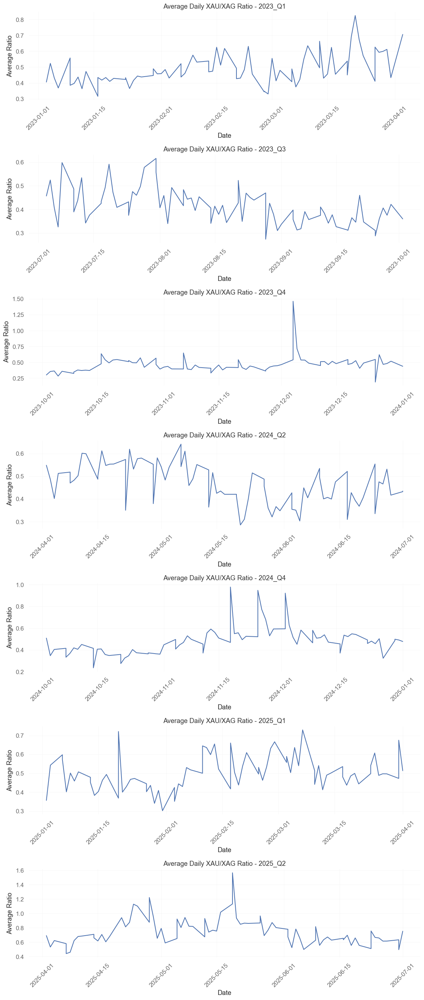

In [4]:
# Calculate the ratio for each quarter
ratio_sds_results = []

# Initialize list to store all av_ratio data with quarter identification
all_sds_ratios = []

for quarter in quarters:
    data2 = pd.read_parquet(f'data/data2_{quarter}.parquet')
    data2['datetime'] = pd.to_datetime(data2['datetime'])
    data2.set_index('datetime', inplace=True)
    
    data_r = np.log(data2 / data2.shift(1)) * 10000
    data_r.columns = ['r_' + col for col in data_r.columns]
    
    data_2_temp = pd.concat(
        [data2[['XAG', 'XAU']],
        data_r[['r_XAU', 'r_XAG']]],
        axis=1
    )
    
    # Compute the ratio SP / NQ
    ratio_temp = data_2_temp.resample("D").apply(lambda x: x['r_XAU'].std() / x['r_XAG'].std())
    
    # Compute daily averages
    sds_ratio_temp = ratio_temp.dropna()
    
    # Store results
    ratio_results.append({
        'Quarter': quarter,
        'Mean_Ratio': sds_ratio_temp.mean(),
        'Std_Ratio': sds_ratio_temp.std(),
        'Min_Ratio': sds_ratio_temp.min(),
        'Max_Ratio': sds_ratio_temp.max()
    })
    
    # Store av_ratio with quarter identification
    sds_ratio_quarter = sds_ratio_temp.to_frame(name='sds_ratio')
    sds_ratio_quarter['quarter'] = quarter
    sds_ratio_quarter.index = sds_ratio_quarter.index + pd.to_timedelta(np.where(sds_ratio_quarter.index.day_name() == "Friday", "3D", "1D")) + pd.Timedelta("0m")
    all_sds_ratios.append(sds_ratio_quarter)

# Combine all av_ratios into one DataFrame
all_sds_ratios_df = pd.concat(all_sds_ratios, axis=0)
print("\nAll Ratios by Quarter:")
print(all_sds_ratios_df)

# Create summary dataframe
ratio_summary = pd.DataFrame(ratio_results)
print("\nSummary of XAU/XAG Ratio by Quarter:")
print(ratio_summary)

# Create charts for each quarter
fig, axes = plt.subplots(len(quarters), 1, figsize=(12, 4*len(quarters)))

for idx, quarter in enumerate(quarters):
    quarter_data = all_sds_ratios_df[all_sds_ratios_df['quarter'] == quarter]
    
    axes[idx].plot(quarter_data.index, quarter_data['sds_ratio'].values)
    axes[idx].set_title(f"Average Daily XAU/XAG Ratio - {quarter}")
    axes[idx].set_xlabel("Date")
    axes[idx].set_ylabel("Average Ratio")
    axes[idx].grid(True, alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



In [5]:
all_sds_ratios_df

,sds_ratio,quarter
2023-01-03 00:00:00+00:00,0.405556,2023_Q1
2023-01-04 00:00:00+00:00,0.523371,2023_Q1
2023-01-05 00:00:00+00:00,0.431342,2023_Q1
2023-01-06 00:00:00+00:00,0.368204,2023_Q1
2023-01-09 00:00:00+00:00,0.557397,2023_Q1
...,...,...
2025-06-26 00:00:00+00:00,0.615496,2025_Q2
2025-06-27 00:00:00+00:00,0.616129,2025_Q2
2025-06-30 00:00:00+00:00,0.633881,2025_Q2
2025-06-30 00:00:00+00:00,0.496739,2025_Q2


In [6]:
all_data_2 = all_data.copy()
all_data_2 = all_data_2.merge(all_sds_ratios_df[['sds_ratio']], left_index=True, right_index=True, how='left')
all_data_2 = all_data_2.merge(all_av_ratios_df[['av_ratio']], left_index=True, right_index=True, how='left')

In [7]:
all_data_2[['av_ratio', 'sds_ratio']] = all_data_2[['av_ratio', 'sds_ratio']].ffill()
all_data_2.between_time("9:31", "9:45").head(40)

,AUD,CAD,XAU,XAG,r_AUD,r_CAD,r_XAU,r_XAG,quarter,sds_ratio,av_ratio
2023-01-02 09:35:00+00:00,0.68121,0.736708,NaN,NaN,-0.146797,-0.294688,NaN,NaN,2023_Q1,NaN,NaN
2023-01-02 09:40:00+00:00,0.68118,0.736708,NaN,NaN,-0.440403,0.000000,NaN,NaN,2023_Q1,NaN,NaN
2023-01-02 09:45:00+00:00,0.68122,0.736686,NaN,NaN,0.587199,-0.294679,NaN,NaN,2023_Q1,NaN,NaN
2023-01-03 09:35:00+00:00,0.67442,0.732526,1844.555,24.450,13.502187,14.639791,18.992791,24.160041,2023_Q1,0.405556,75.949170
2023-01-03 09:40:00+00:00,0.67511,0.733568,1846.755,24.436,10.225783,14.221104,11.919889,-5.727611,2023_Q1,0.405556,75.949170
2023-01-03 09:45:00+00:00,0.67618,0.734614,1847.578,24.437,15.836722,14.241357,4.455473,0.409224,2023_Q1,0.405556,75.949170
2023-01-04 09:35:00+00:00,0.68733,0.738411,1857.435,24.191,-6.690325,-10.195262,-2.368578,-7.851078,2023_Q1,0.523371,76.085025
2023-01-04 09:40:00+00:00,0.68766,0.739115,1858.655,24.282,4.800035,9.530037,6.566041,37.546720,2023_Q1,0.523371,76.085025
2023-01-04 09:45:00+00:00,0.68715,0.739158,1858.525,24.272,-7.419207,0.591309,-0.699455,-4.119125,2023_Q1,0.523371,76.085025
2023-01-05 09:35:00+00:00,0.67722,0.738853,1837.348,23.335,0.442997,-1.551711,7.568115,-2.999336,2023_Q1,0.431342,77.290013


In [8]:
all_data_2.index.day_name().value_counts()

Thursday     26128
Monday       26122
Tuesday      25974
Wednesday    25746
Friday       18550
Sunday        7512
Name: count, dtype: int64

In [9]:
all_data_2['spread_avratio'] = all_data_2['XAU'] - all_data_2['XAG'] * all_data_2['av_ratio']
all_data_2['spread_sdsratio'] = all_data_2['r_XAU'] - all_data_2['r_XAG'] * all_data_2['sds_ratio']

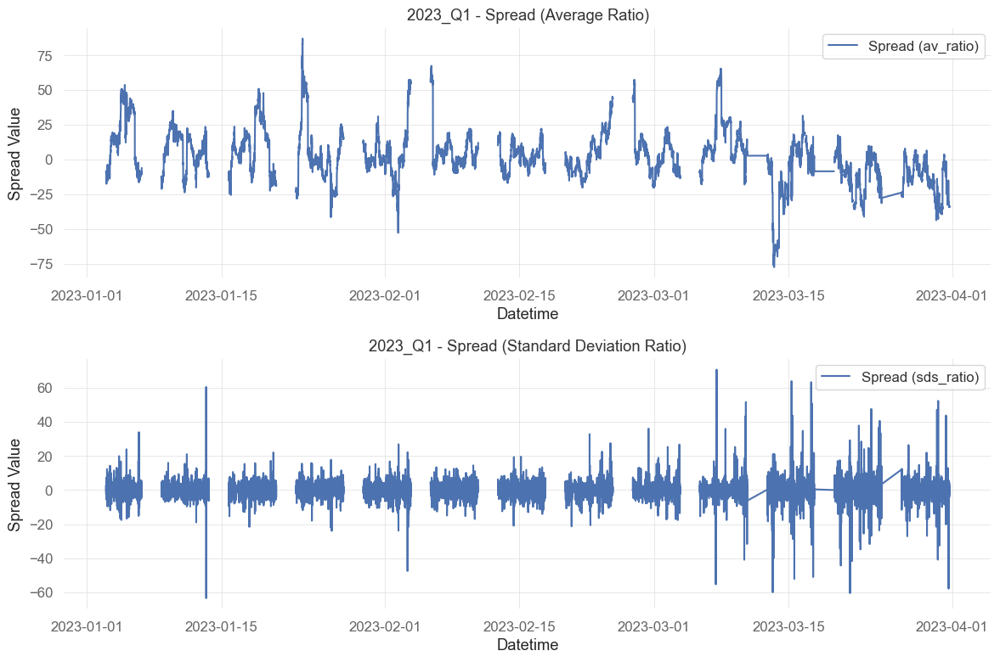

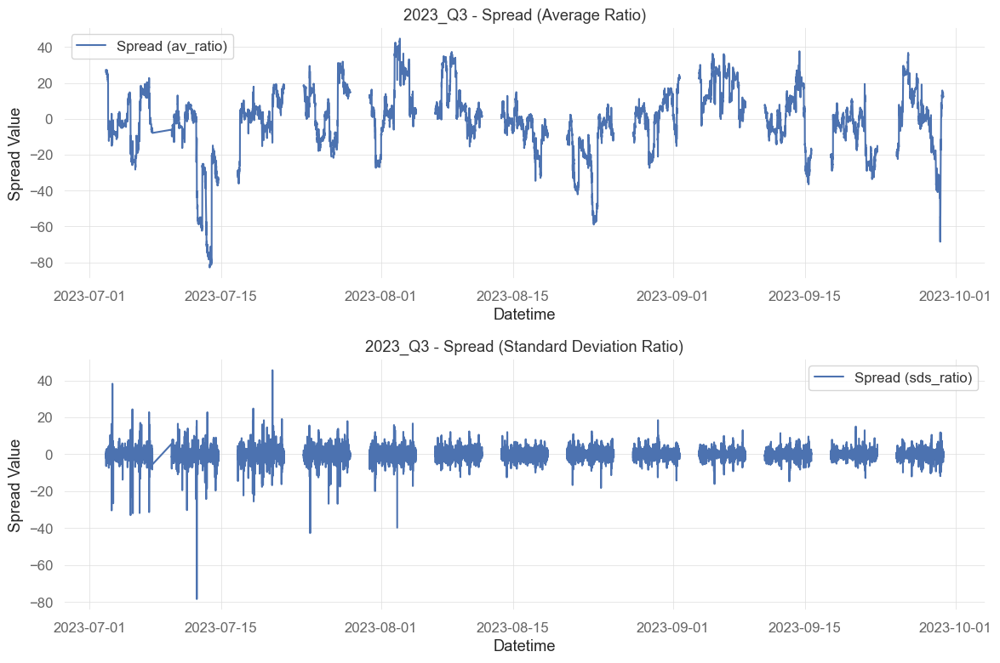

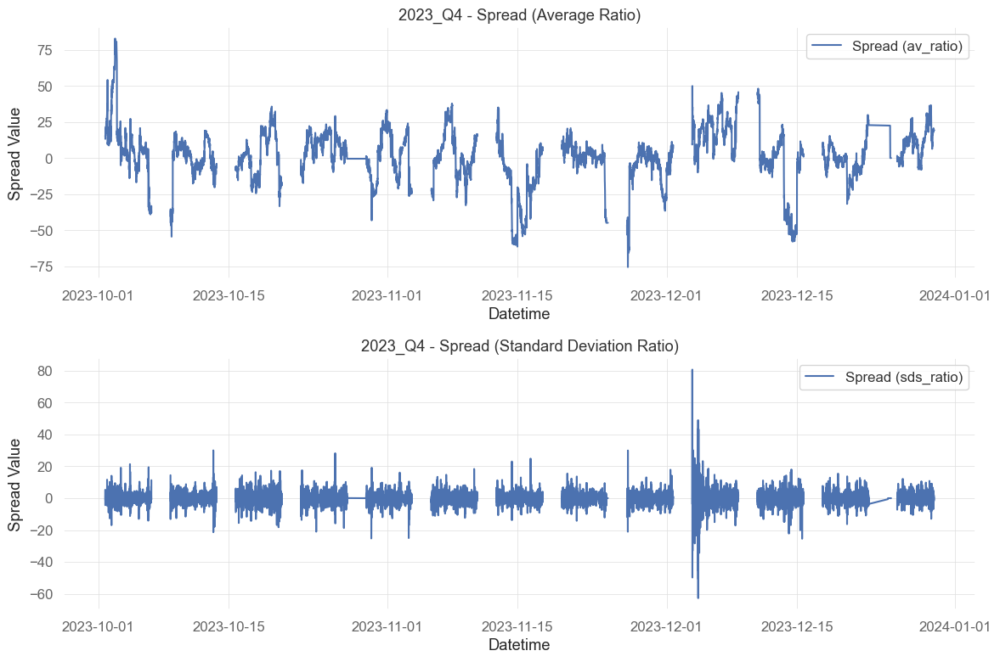

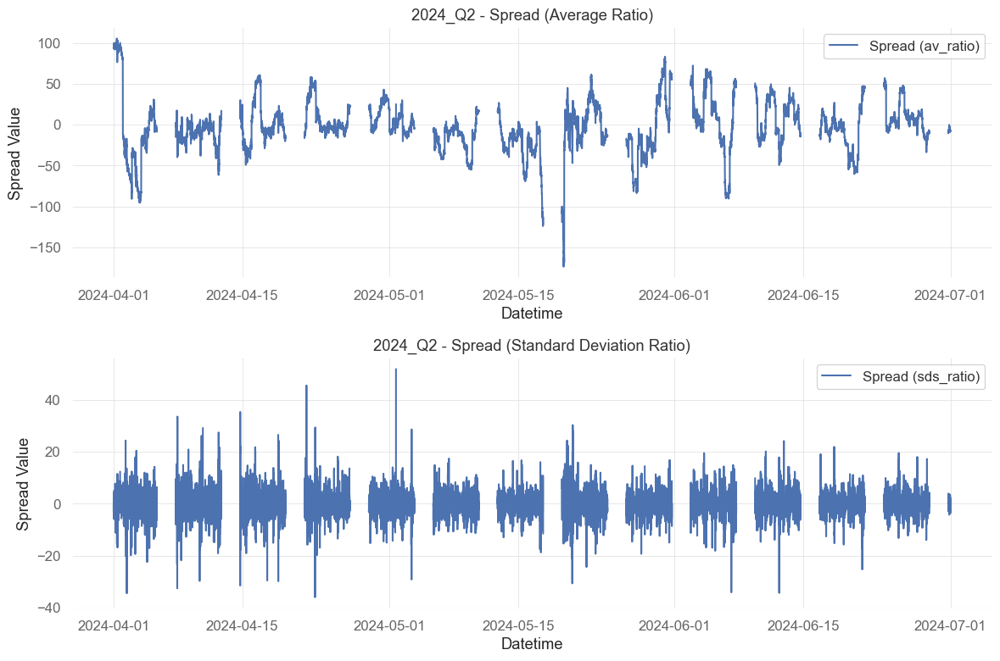

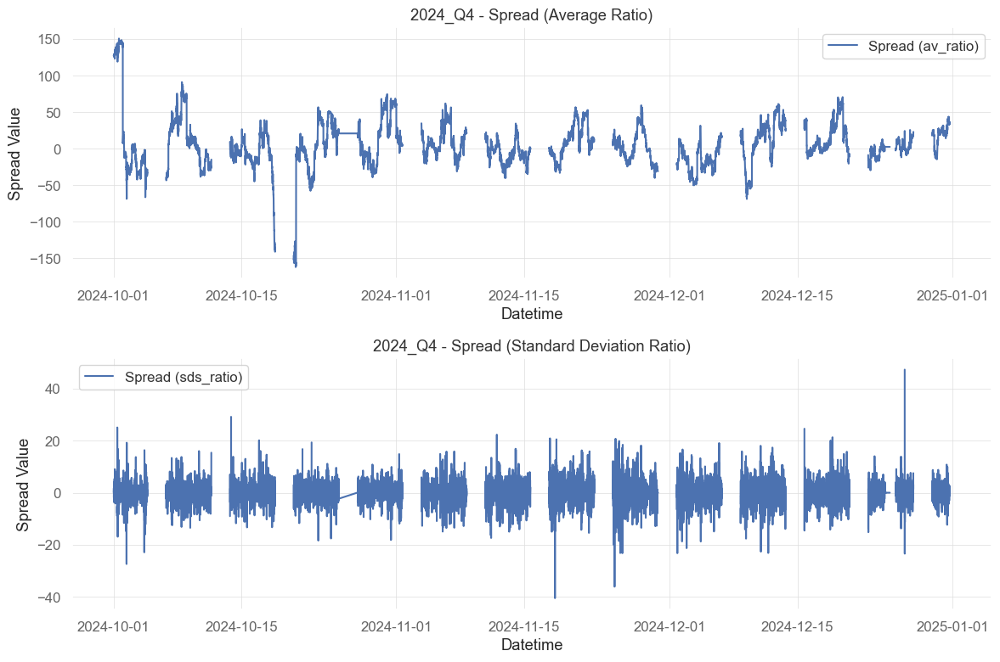

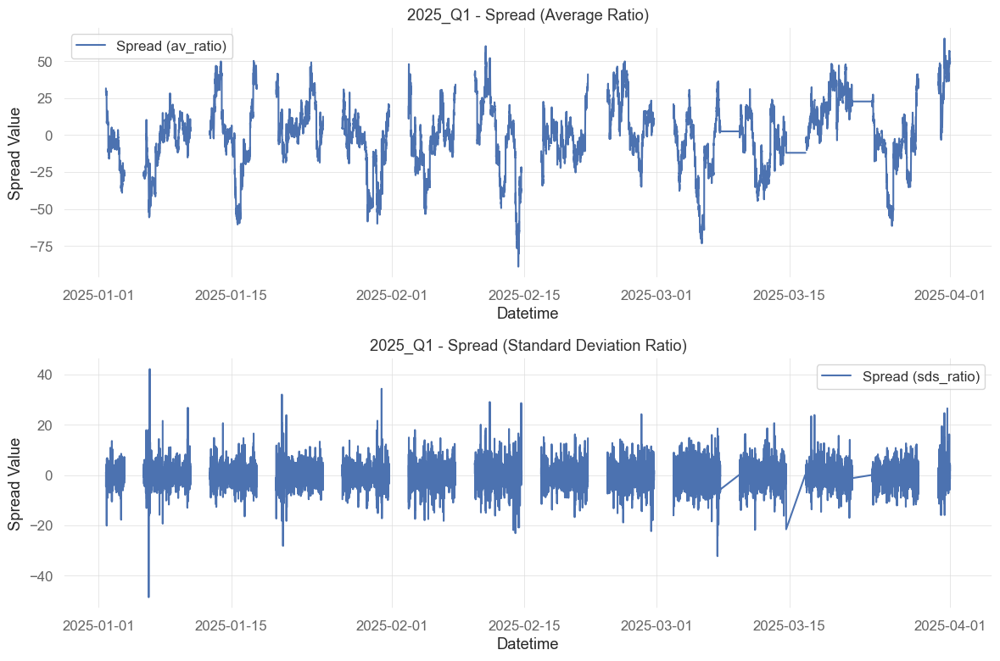

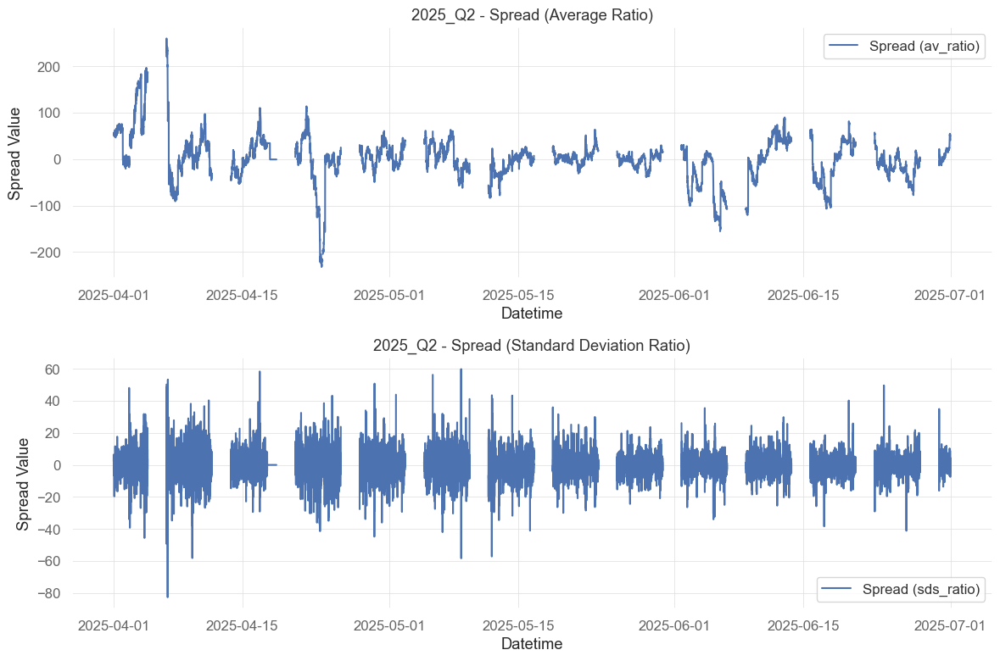

In [10]:
# Create separate charts for each quarter showing both spreads
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Create subplots for this quarter
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    
    # Plot spread based on average ratio
    axes[0].plot(quarter_data.index,
                 quarter_data["spread_avratio"],
                 label="Spread (av_ratio)")
    axes[0].set_title(f"{quarter} - Spread (Average Ratio)")
    axes[0].set_xlabel("Datetime")
    axes[0].set_ylabel("Spread Value")
    axes[0].legend()
    
    # Plot spread based on standard deviation ratio
    axes[1].plot(quarter_data.index,
                 quarter_data["spread_sdsratio"],
                 label="Spread (sds_ratio)")
    axes[1].set_title(f"{quarter} - Spread (Standard Deviation Ratio)")
    axes[1].set_xlabel("Datetime")
    axes[1].set_ylabel("Spread Value")
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

In [11]:
# we assume that spread mean reverts to 0

# lets apply the volatility breakout model

# first we need to calculate the standard deviation of the spreads
# let's use rolling window of 120 minutes (2 hours)

all_data_2["std_spread_avratio"] = all_data_2["spread_avratio"].rolling(window=120).std()
all_data_2["std_spread_sdsratio"] = all_data_2["spread_sdsratio"].rolling(window=120).std()

# lets put missings whenever KO price is missing
# (PEP price should be missing in the same moments)

all_data_2.loc[all_data_2["XAU"].isna(), ["std_spread_avratio", "std_spread_sdsratio"]] = np.nan

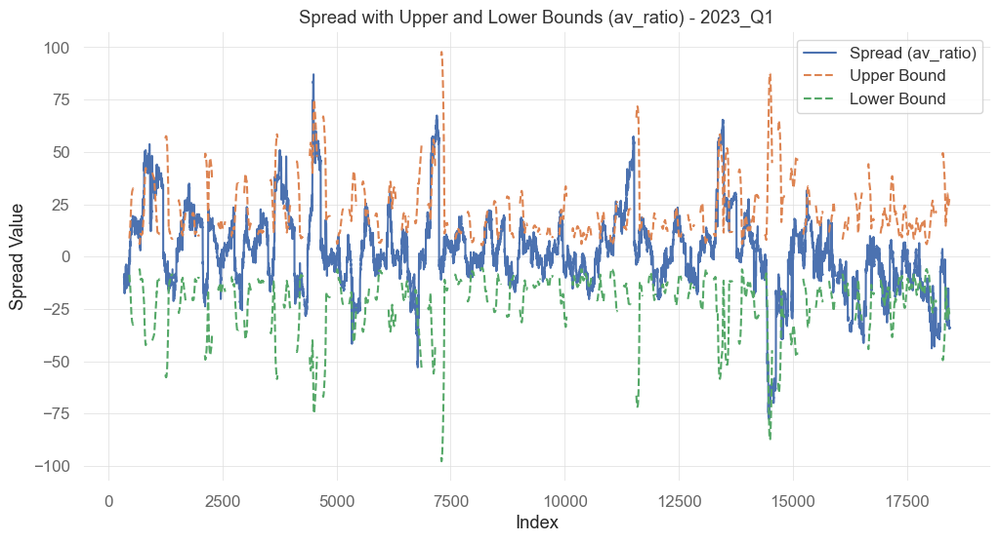

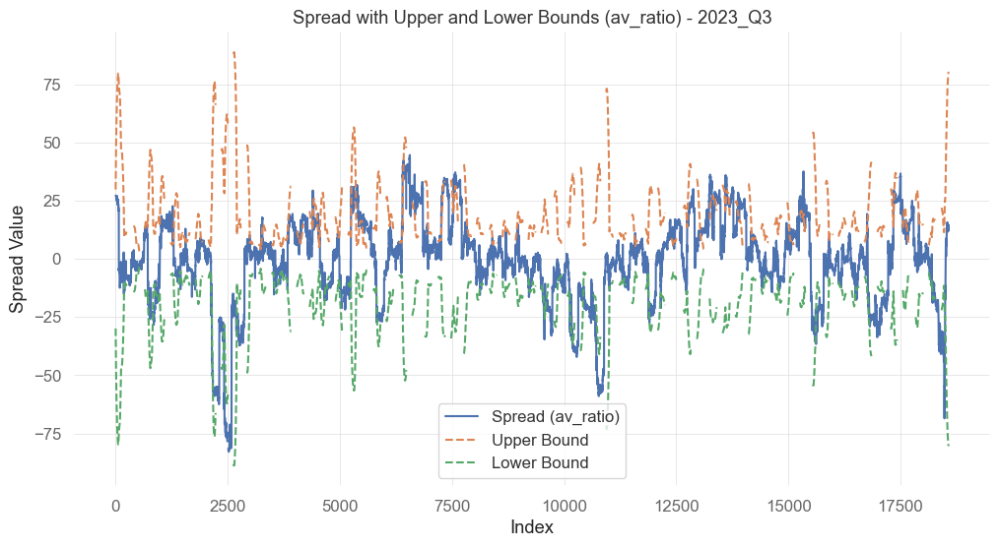

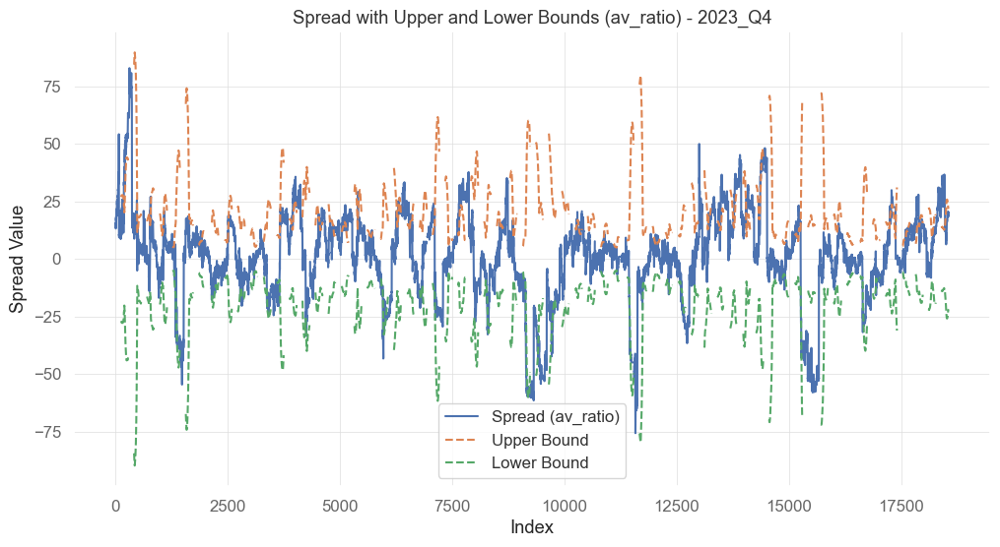

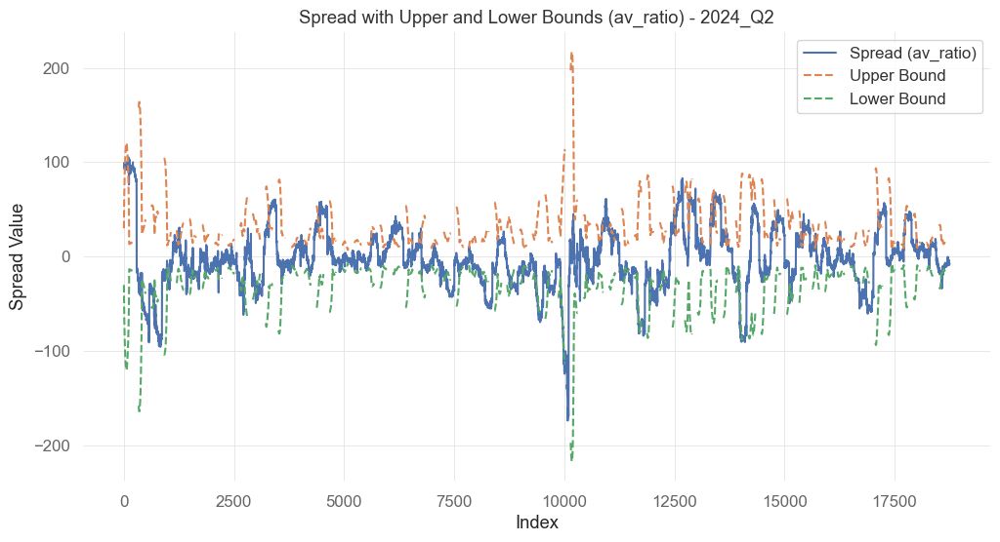

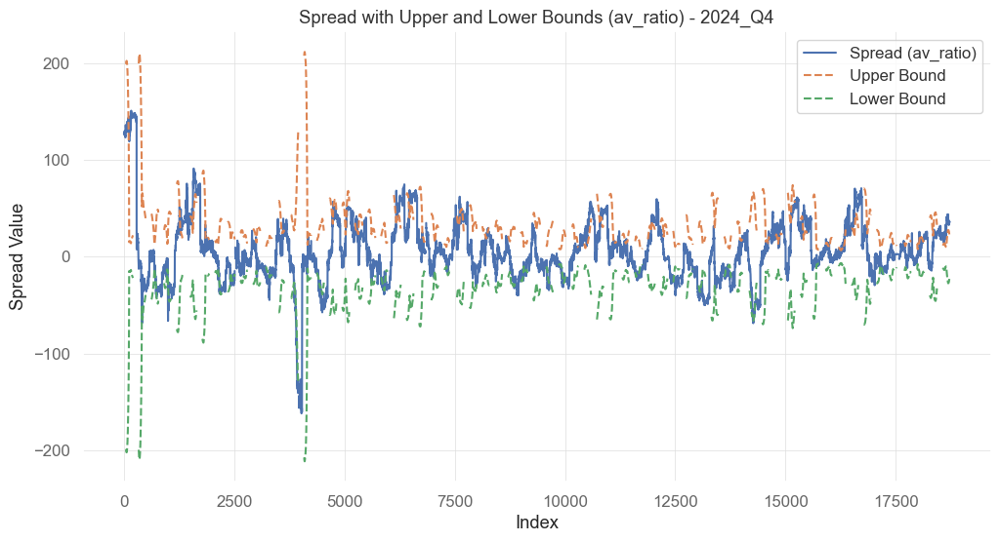

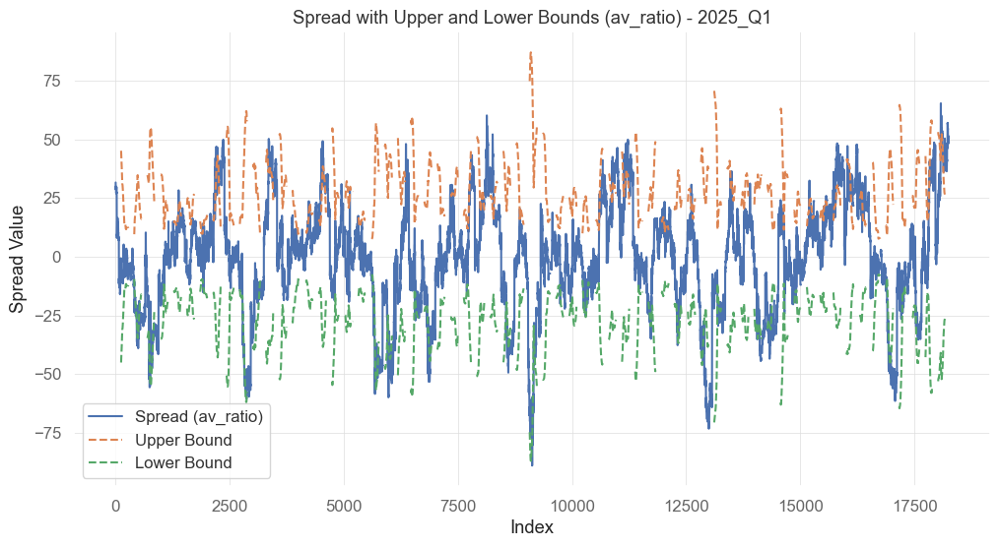

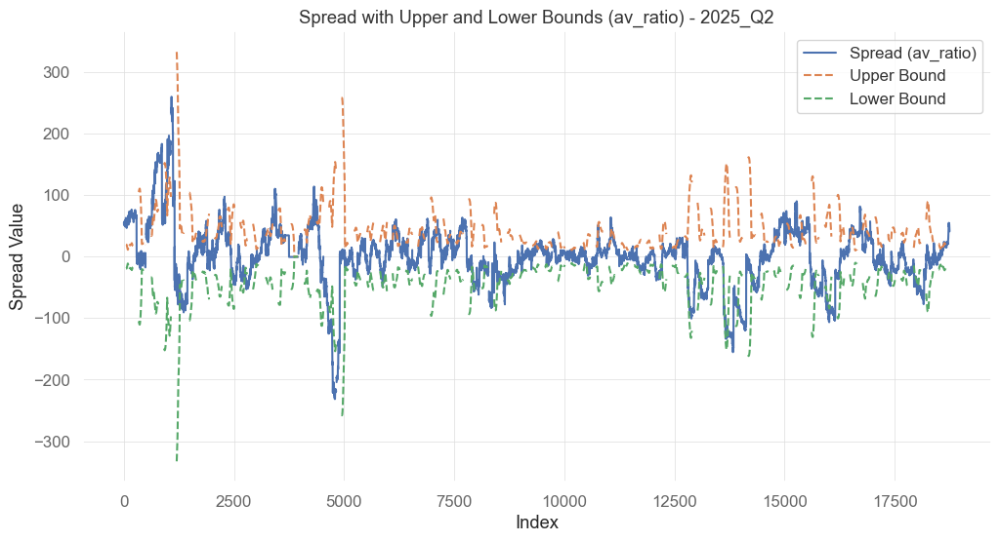

In [12]:
# applying a volatility breakout model
# sample upper and lower bounds for spreads
# for a volatility multiplier of 3
# (here we put the upper and lower band along zero)

all_data_2["upper_bound_avratio"] = 3 * all_data_2["std_spread_avratio"]
all_data_2["lower_bound_avratio"] = -3 * all_data_2["std_spread_avratio"]

# lets see how it looks like for each quarter separately
# Create separate charts for each quarter
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Reset index for plotting
    quarter_data_plot = quarter_data.reset_index()
    
    plt.figure(figsize=(12, 6))
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["spread_avratio"],
             label="Spread (av_ratio)")
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["upper_bound_avratio"],
             label="Upper Bound", linestyle='--')
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["lower_bound_avratio"],
             label="Lower Bound", linestyle='--')
    plt.title(f"Spread with Upper and Lower Bounds (av_ratio) - {quarter}")
    plt.xlabel("Index")
    plt.ylabel("Spread Value")
    plt.legend()
    plt.show()

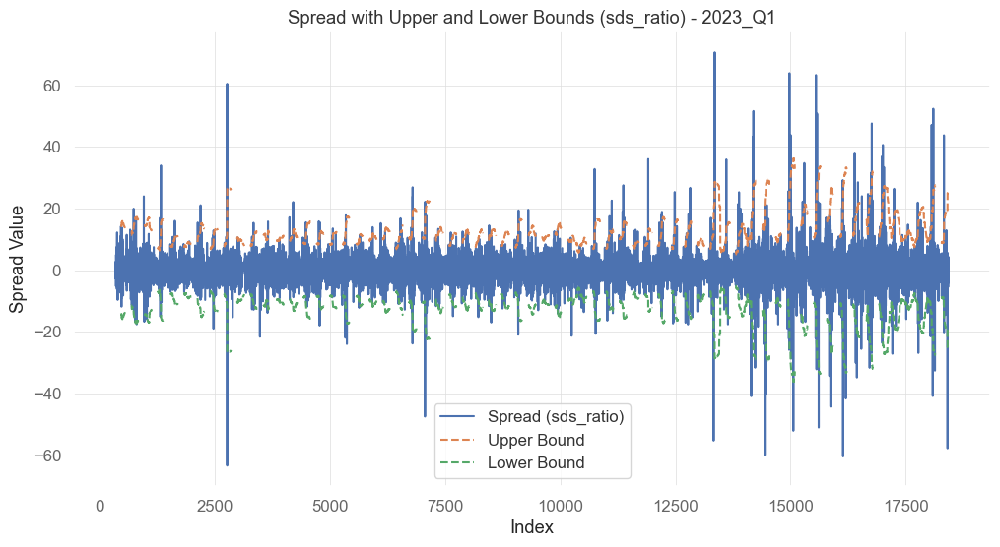

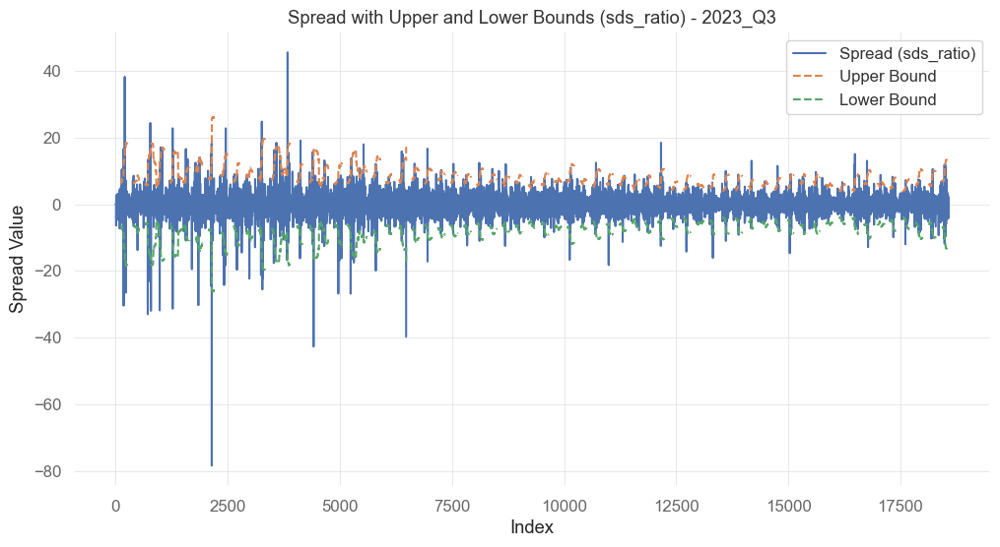

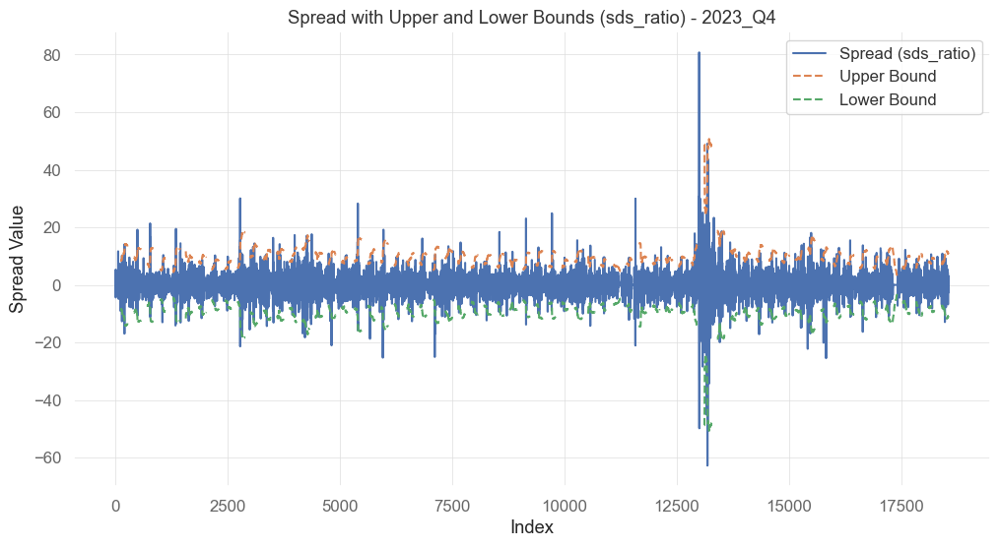

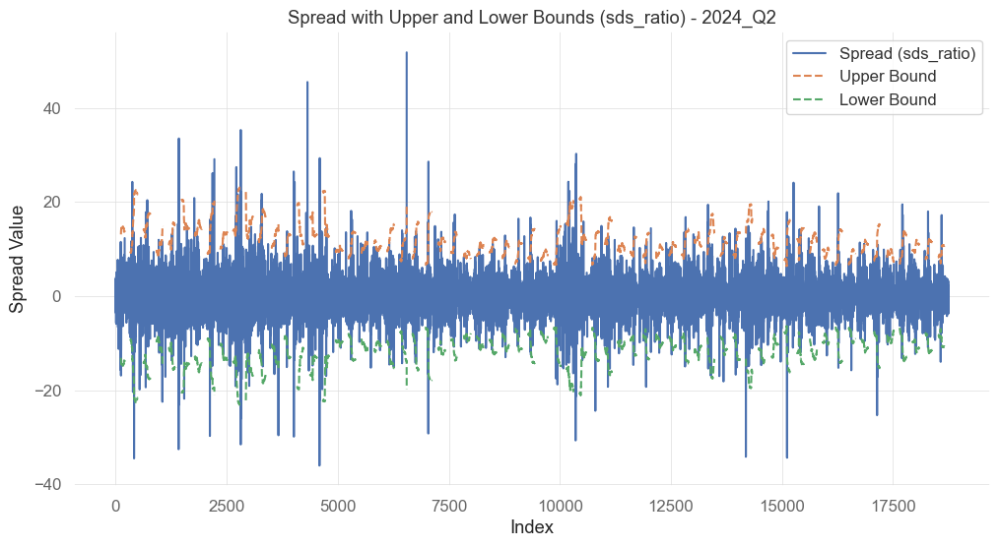

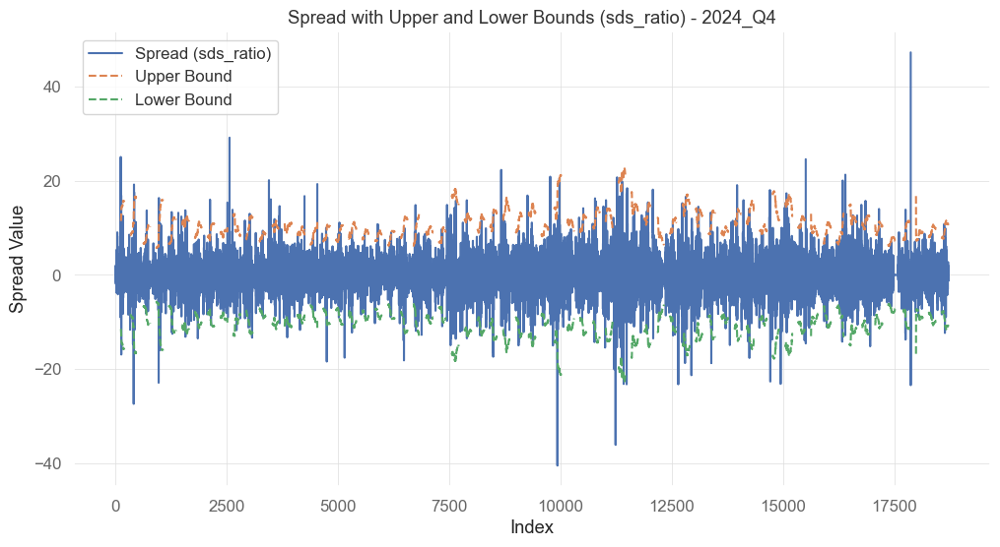

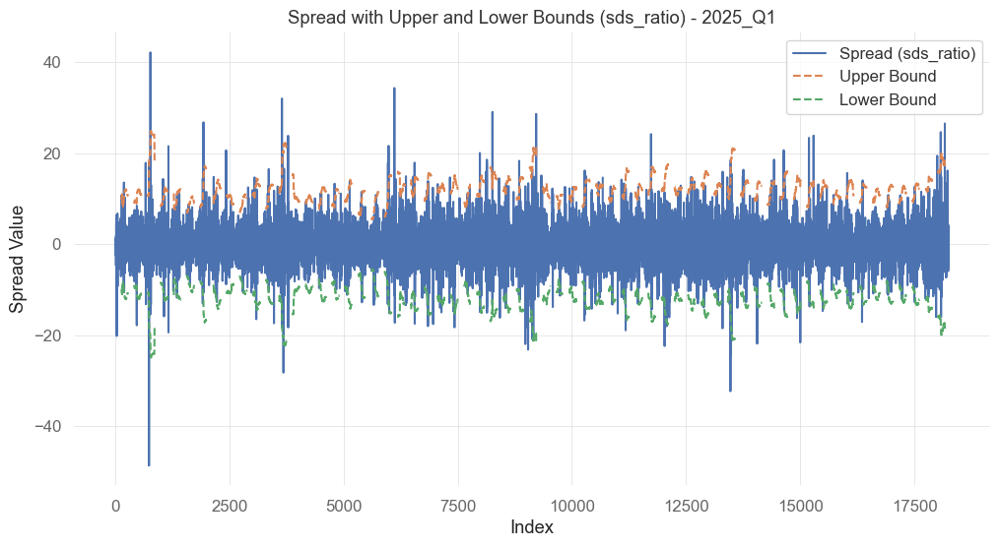

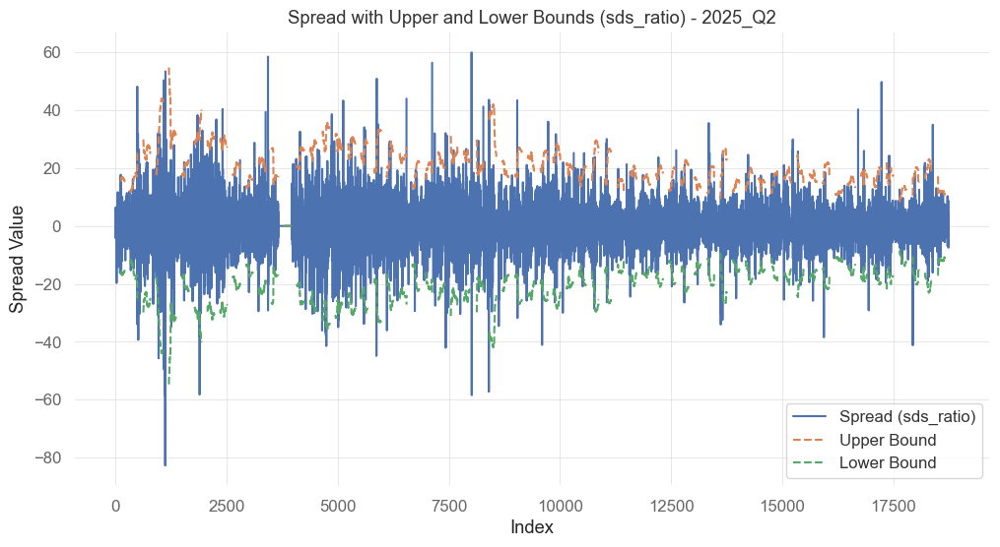

In [13]:
# applying a volatility breakout model
# sample upper and lower bounds for spreads
# for a volatility multiplier of 3
# (here we put the upper and lower band along zero)

all_data_2["upper_bound_sdsratio"] = 3 * all_data_2["std_spread_sdsratio"]
all_data_2["lower_bound_sdsratio"] = -3 * all_data_2["std_spread_sdsratio"]

# lets see how it looks like for each quarter separately
# Create separate charts for each quarter
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Reset index for plotting
    quarter_data_plot = quarter_data.reset_index()
    
    plt.figure(figsize=(12, 6))
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["spread_sdsratio"],
             label="Spread (sds_ratio)")
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["upper_bound_sdsratio"],
             label="Upper Bound", linestyle='--')
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["lower_bound_sdsratio"],
             label="Lower Bound", linestyle='--')
    plt.title(f"Spread with Upper and Lower Bounds (sds_ratio) - {quarter}")
    plt.xlabel("Index")
    plt.ylabel("Spread Value")
    plt.legend()
    plt.show()

In [14]:
### position will be based on relation of the spread to volatility bands

# lets assume we do not trade within the first 15-mins of the day
# and exit all positions 15 minutes before the end of quotations

# lets create a pos_flat vector and fill it with 0s

pos_flat = np.zeros(len(all_data_2))

In [15]:
breaks = (all_data_2.index.time >= pd.to_datetime("16:51").time()) & \
          (all_data_2.index.time <= pd.to_datetime("18:10").time())

pos_flat[breaks] = 1

### Two Intersecting Moving Averages

av_ratio

In [16]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over each quarter
for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2['quarter'] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    # Loop over different parameter combinations
    for fastEMA in fastEMA_parameters:
        for slowEMA in slowEMA_parameters:
                    
                    # ensure that fastEMA is less than slowEMA
                    if fastEMA >= slowEMA:
                        continue

                    print(f"  fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                    # We calculate the appropriate EMA
                    fastEMA_values = quarter_data['spread_avratio'].ewm(span = fastEMA).mean()
                    slowEMA_values = quarter_data['spread_avratio'].ewm(span = slowEMA).mean()

                    # Insert NaNs wherever the original price is missing
                    fastEMA_values[quarter_data['spread_avratio'].isna()] = np.nan
                    slowEMA_values[quarter_data['spread_avratio'].isna()] = np.nan 

                    # Calculate position for momentum strategy
                    cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                    
                    # let's add filters that check for the presence of NaN values
                    fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                    slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                    # Now we can add these conditions to our strategies
                    # if any of the values is missing,
                    # we cannot make a position decision

                    pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                       np.where(cond2b_mom_long, 1, -1),
                                       np.nan)
                    pos_mr = -pos_mom 

                    # Set position to 0 where pos_flat is 1
                    pos_flat_quarter = pos_flat[quarter_mask]
                    pos_mr[pos_flat_quarter == 1] = 0
                    
                    # Calculate gross pnl
                    pnl_gross_mr = pos_mr * (quarter_data['XAU'].diff() - quarter_data['XAG'].diff() * quarter_data['av_ratio'])
                    # point value for E6

                    # Calculate number of transactions
                    ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                    # Calculate net pnl
                    pnl_net_mr = pnl_gross_mr - ntrans * (15 + quarter_data['av_ratio']*10)   # cost $10 per transaction on E6
                      
                    # Aggregate to daily data
                    pnl_gross_mr = pd.Series(pnl_gross_mr)
                    pnl_gross_mr.index = quarter_data['spread_avratio'].index.time
                    pnl_gross_mr_d = pnl_gross_mr.groupby(quarter_data['spread_avratio'].index.date).sum()

                    pnl_net_mr = pd.Series(pnl_net_mr)
                    pnl_net_mr.index = quarter_data['spread_avratio'].index.time
                    pnl_net_mr_d = pnl_net_mr.groupby(quarter_data['spread_avratio'].index.date).sum()

                    ntrans = pd.Series(ntrans)
                    ntrans.index = quarter_data['spread_avratio'].index.time
                    ntrans_d = ntrans.groupby(quarter_data['spread_avratio'].index.date).sum()

                    # Calculate Sharpe Ratio and PnL
                    gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                    net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                    gross_PnL_mr = pnl_gross_mr_d.sum()
                    net_PnL_mr = pnl_net_mr_d.sum()

                    av_daily_ntrans = ntrans_d.mean()

                    # Collect necessary results into one object
                    summary = pd.DataFrame({
                        'fastEMA': fastEMA,
                        'slowEMA': slowEMA,
                        'quarter': quarter,
                        'gross_SR_mr': gross_SR_mr,
                        'net_SR_mr': net_SR_mr,
                        'gross_PnL_mr': gross_PnL_mr,
                        'net_PnL_mr': net_PnL_mr,
                        'av_daily_ntrans': av_daily_ntrans
                    }, index=[0])

                    # Append results to the summary
                    summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)


Processing quarter: 2023_Q1
  fastEMA = 15, slowEMA = 90
  fastEMA = 15, slowEMA = 120
  fastEMA = 15, slowEMA = 150
  fastEMA = 15, slowEMA = 180
  fastEMA = 15, slowEMA = 240
  fastEMA = 15, slowEMA = 300
  fastEMA = 15, slowEMA = 360
  fastEMA = 15, slowEMA = 420
  fastEMA = 20, slowEMA = 90
  fastEMA = 20, slowEMA = 120
  fastEMA = 20, slowEMA = 150
  fastEMA = 20, slowEMA = 180
  fastEMA = 20, slowEMA = 240
  fastEMA = 20, slowEMA = 300
  fastEMA = 20, slowEMA = 360
  fastEMA = 20, slowEMA = 420
  fastEMA = 30, slowEMA = 90
  fastEMA = 30, slowEMA = 120
  fastEMA = 30, slowEMA = 150
  fastEMA = 30, slowEMA = 180
  fastEMA = 30, slowEMA = 240
  fastEMA = 30, slowEMA = 300
  fastEMA = 30, slowEMA = 360
  fastEMA = 30, slowEMA = 420
  fastEMA = 45, slowEMA = 90
  fastEMA = 45, slowEMA = 120
  fastEMA = 45, slowEMA = 150
  fastEMA = 45, slowEMA = 180
  fastEMA = 45, slowEMA = 240
  fastEMA = 45, slowEMA = 300
  fastEMA = 45, slowEMA = 360
  fastEMA = 45, slowEMA = 420
  fastEMA = 60,

In [17]:
# lets see top 5 stategies with respect to net_SR_mr
summary_all_2MAs.sort_values(by = 'net_SR_mr',
                            ascending = False).head(5)

,fastEMA,slowEMA,quarter,gross_SR_mr,net_SR_mr,gross_PnL_mr,net_PnL_mr,av_daily_ntrans
320,75,300,2025_Q1,1.240834,-12.739962,152.227421,-166042.565762,2.389610
211,75,360,2024_Q2,1.241367,-13.001014,211.000677,-163172.644243,2.538462
256,60,240,2024_Q4,-0.763985,-13.034298,-122.697130,-180880.108883,2.658228
210,75,300,2024_Q2,0.906954,-13.085614,143.711450,-144335.805588,2.256410
172,15,420,2024_Q2,0.741340,-13.134343,130.616359,-256140.129858,3.948718


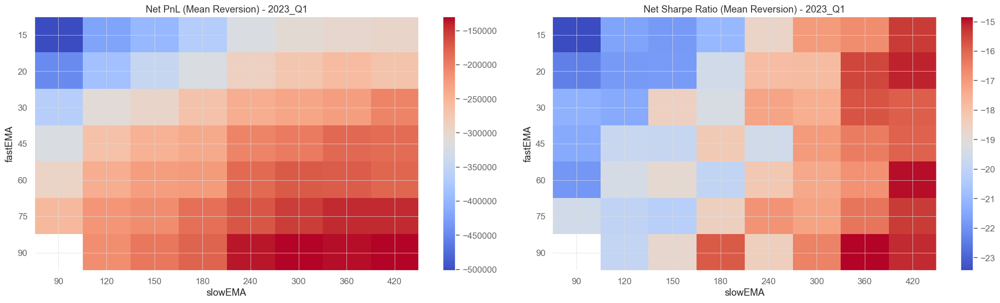

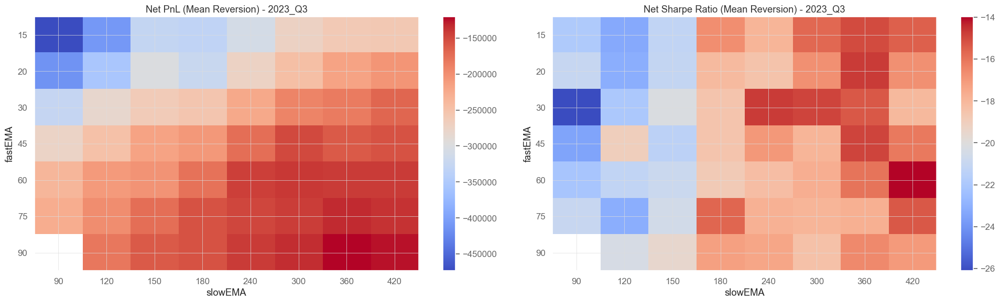

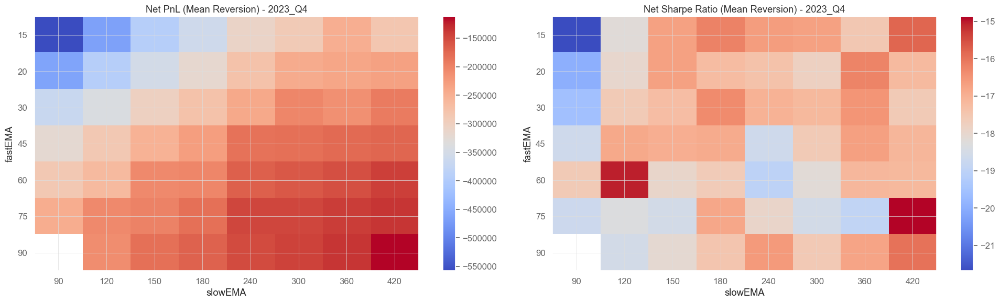

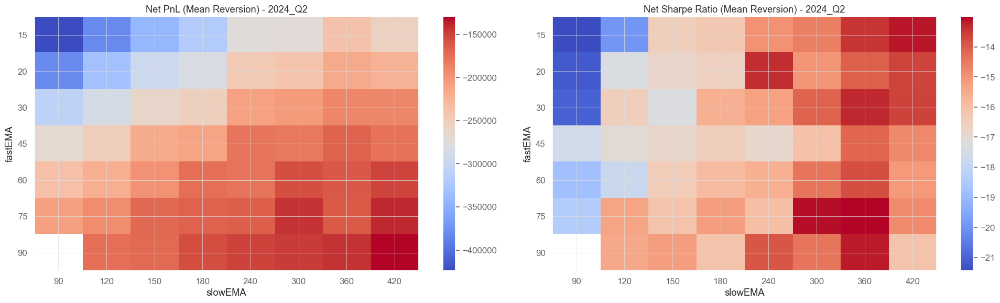

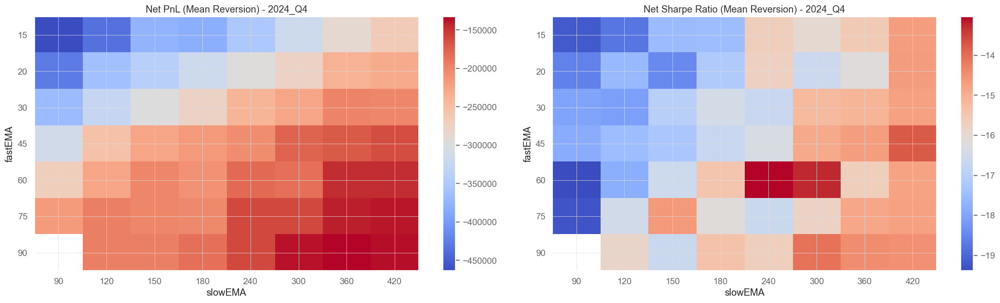

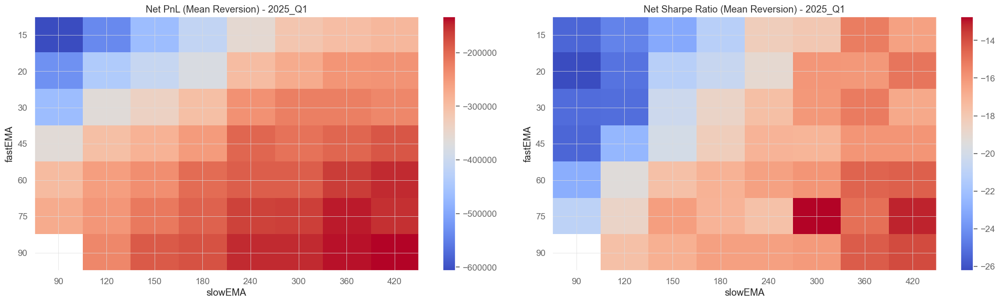

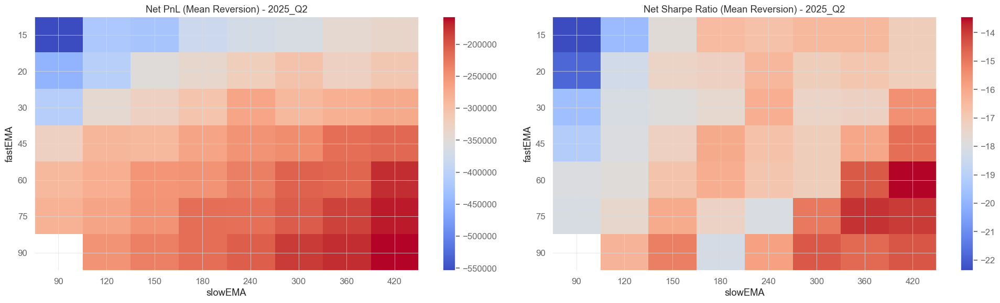

In [18]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_2MAs[summary_all_2MAs['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_PnL_mr')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('slowEMA')
    axes[0].set_ylabel('fastEMA')
    axes[0].set_title(f'Net PnL (Mean Reversion) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_SR_mr')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[1].set_xlabel('slowEMA')
    axes[1].set_ylabel('fastEMA')
    axes[1].set_title(f'Net Sharpe Ratio (Mean Reversion) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

sds_ratio

In [19]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over each quarter
for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2['quarter'] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    # Loop over different parameter combinations
    for fastEMA in fastEMA_parameters:
        for slowEMA in slowEMA_parameters:
                    
                    # ensure that fastEMA is less than slowEMA
                    if fastEMA >= slowEMA:
                        continue

                    print(f"  fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                    # We calculate the appropriate EMA
                    fastEMA_values = quarter_data['spread_sdsratio'].ewm(span = fastEMA).mean()
                    slowEMA_values = quarter_data['spread_sdsratio'].ewm(span = slowEMA).mean()

                    # Insert NaNs wherever the original price is missing
                    fastEMA_values[quarter_data['spread_sdsratio'].isna()] = np.nan
                    slowEMA_values[quarter_data['spread_sdsratio'].isna()] = np.nan 

                    # Calculate position for momentum strategy
                    cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                    
                    # let's add filters that check for the presence of NaN values
                    fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                    slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                    # Now we can add these conditions to our strategies
                    # if any of the values is missing,
                    # we cannot make a position decision

                    pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                       np.where(cond2b_mom_long, 1, -1),
                                       np.nan)
                    pos_mr = -pos_mom 

                    # Set position to 0 where pos_flat is 1
                    pos_flat_quarter = pos_flat[quarter_mask]
                    pos_mr[pos_flat_quarter == 1] = 0
                    
                    # Calculate gross pnl
                    pnl_gross_mr = pos_mr * (quarter_data['XAU'].diff() - quarter_data['XAG'].diff() * quarter_data['sds_ratio'])
                    # point value for E6

                    # Calculate number of transactions
                    ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                    # Calculate net pnl
                    pnl_net_mr = pnl_gross_mr - ntrans * (15 + quarter_data['sds_ratio']*10)   # cost $10 per transaction on E6
                      
                    # Aggregate to daily data
                    pnl_gross_mr = pd.Series(pnl_gross_mr)
                    pnl_gross_mr.index = quarter_data['spread_sdsratio'].index.time
                    pnl_gross_mr_d = pnl_gross_mr.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    pnl_net_mr = pd.Series(pnl_net_mr)
                    pnl_net_mr.index = quarter_data['spread_sdsratio'].index.time
                    pnl_net_mr_d = pnl_net_mr.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    ntrans = pd.Series(ntrans)
                    ntrans.index = quarter_data['spread_sdsratio'].index.time
                    ntrans_d = ntrans.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    # Calculate Sharpe Ratio and PnL
                    gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                    net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                    gross_PnL_mr = pnl_gross_mr_d.sum()
                    net_PnL_mr = pnl_net_mr_d.sum()

                    av_daily_ntrans = ntrans_d.mean()

                    # Collect necessary results into one object
                    summary = pd.DataFrame({
                        'fastEMA': fastEMA,
                        'slowEMA': slowEMA,
                        'quarter': quarter,
                        'gross_SR_mr': gross_SR_mr,
                        'net_SR_mr': net_SR_mr,
                        'gross_PnL_mr': gross_PnL_mr,
                        'net_PnL_mr': net_PnL_mr,
                        'av_daily_ntrans': av_daily_ntrans
                    }, index=[0])

                    # Append results to the summary
                    summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)


Processing quarter: 2023_Q1
  fastEMA = 15, slowEMA = 90
  fastEMA = 15, slowEMA = 120
  fastEMA = 15, slowEMA = 150
  fastEMA = 15, slowEMA = 180
  fastEMA = 15, slowEMA = 240
  fastEMA = 15, slowEMA = 300
  fastEMA = 15, slowEMA = 360
  fastEMA = 15, slowEMA = 420
  fastEMA = 20, slowEMA = 90
  fastEMA = 20, slowEMA = 120
  fastEMA = 20, slowEMA = 150
  fastEMA = 20, slowEMA = 180
  fastEMA = 20, slowEMA = 240
  fastEMA = 20, slowEMA = 300
  fastEMA = 20, slowEMA = 360
  fastEMA = 20, slowEMA = 420
  fastEMA = 30, slowEMA = 90
  fastEMA = 30, slowEMA = 120
  fastEMA = 30, slowEMA = 150
  fastEMA = 30, slowEMA = 180
  fastEMA = 30, slowEMA = 240
  fastEMA = 30, slowEMA = 300
  fastEMA = 30, slowEMA = 360
  fastEMA = 30, slowEMA = 420
  fastEMA = 45, slowEMA = 90
  fastEMA = 45, slowEMA = 120
  fastEMA = 45, slowEMA = 150
  fastEMA = 45, slowEMA = 180
  fastEMA = 45, slowEMA = 240
  fastEMA = 45, slowEMA = 300
  fastEMA = 45, slowEMA = 360
  fastEMA = 45, slowEMA = 420
  fastEMA = 60,

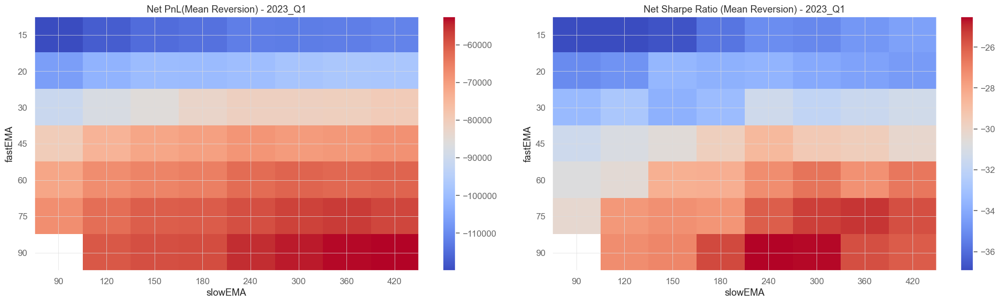

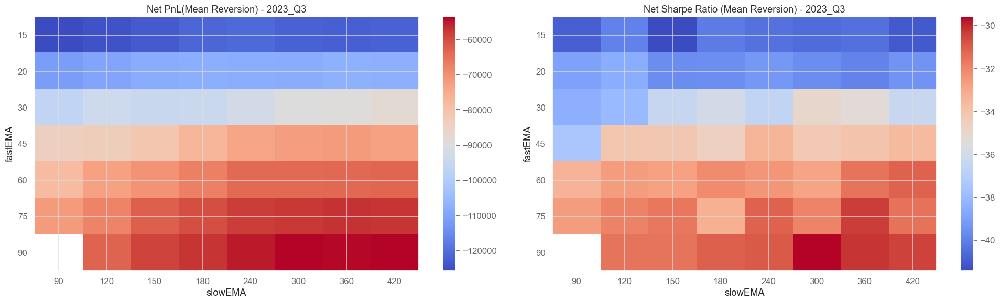

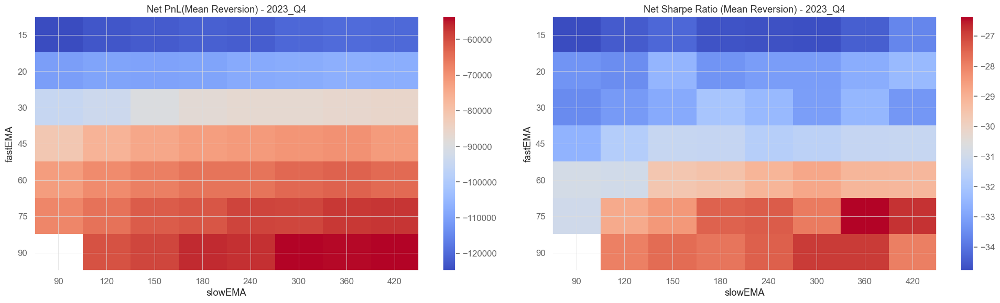

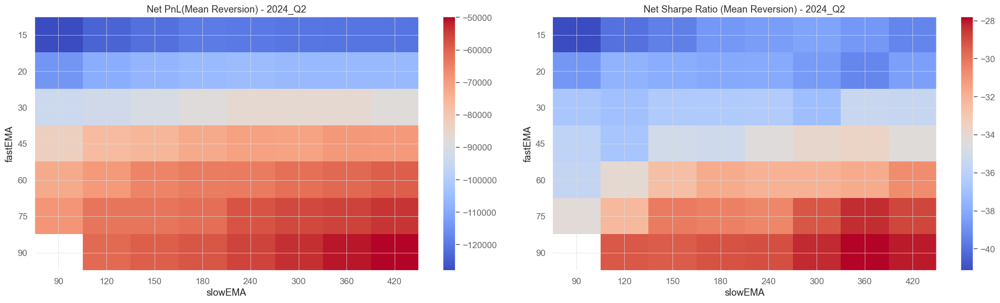

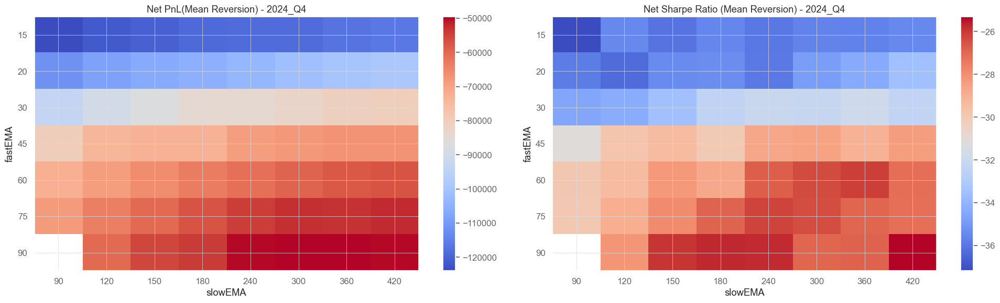

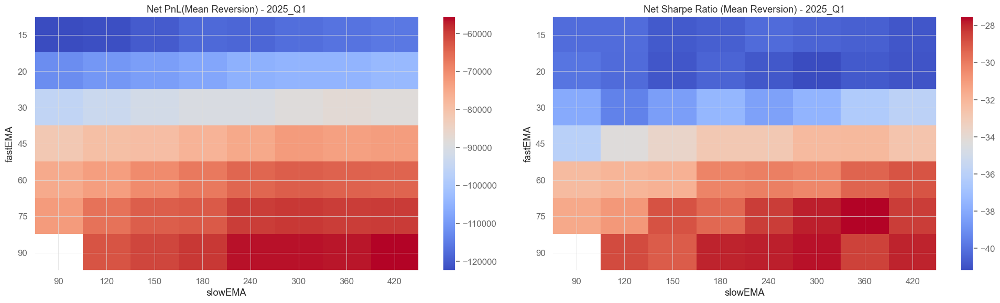

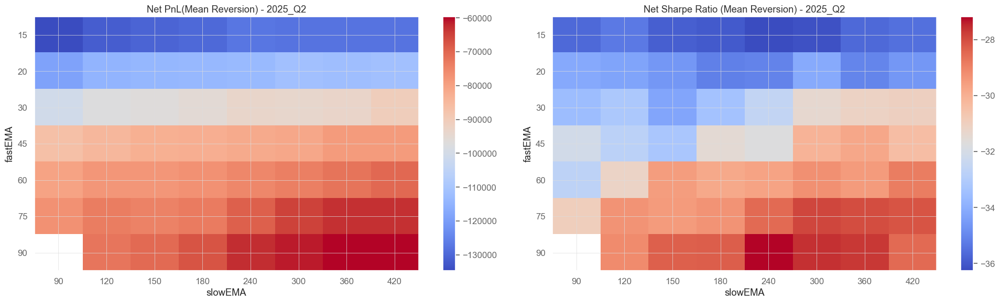

In [20]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_2MAs[summary_all_2MAs['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_PnL_mr')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('slowEMA')
    axes[0].set_ylabel('fastEMA')
    axes[0].set_title(f'Net PnL(Mean Reversion) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_SR_mr')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[1].set_xlabel('slowEMA')
    axes[1].set_ylabel('fastEMA')
    axes[1].set_title(f'Net Sharpe Ratio (Mean Reversion) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

### Volatility Breakout Strategy

In [21]:
from functions.position_VB import positionVB

In [22]:
# lets do a comparison within a loop for spread_avratio and spread_sdsratio

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

volat_sd_parameters = [60, 90, 120, 150, 180]
m_parameters = [0.5, 1, 1.5, 2, 2.5, 3, 3.5]

# create a dataframe to store results
summary_all_volatility = pd.DataFrame()

# Loop through each quarter
for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2["quarter"] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    for volat_sd in volat_sd_parameters:
        for m in m_parameters:
            print(f"  volat_sd: {volat_sd}, m: {m}")

            # calculate the elements of the strategy
            XAU = quarter_data["XAU"]
            XAG = quarter_data["XAG"]

            # spread based on average ratio
            signal_avratio = XAU - (quarter_data["av_ratio"] * XAG)
            std_spread_avratio = signal_avratio.rolling(window=volat_sd).std()
            upper_bound_avratio = m * std_spread_avratio
            lower_bound_avratio = -m * std_spread_avratio
            # position
            pos_avratio = positionVB(signal = signal_avratio,
                                    lower = lower_bound_avratio,
                                    upper = upper_bound_avratio,
                                    pos_flat = pos_flat[quarter_mask],
                                    strategy = "mr")
            # number of transactions
            n_trans_avratio = np.abs(np.diff(pos_avratio, prepend = 0))
            # convert to pd.Series and set the index
            n_trans_avratio = pd.Series(n_trans_avratio, index=quarter_data.index)

            # gross and net PnL
            pnl_gross_avratio = pos_avratio * (quarter_data["XAU"].diff() - quarter_data["av_ratio"] * quarter_data["XAG"].diff())
            pnl_net_avratio = pnl_gross_avratio - n_trans_avratio * (15 + quarter_data["av_ratio"] * 10)

            # spread based on standard deviation ratio
            signal_sdsratio = quarter_data["spread_sdsratio"]
            std_spread_sdsratio = signal_sdsratio.rolling(window=volat_sd).std()
            upper_bound_sdsratio = m * std_spread_sdsratio
            lower_bound_sdsratio = -m * std_spread_sdsratio
            # position
            pos_sdsratio = positionVB(signal = signal_sdsratio,
                                    lower = lower_bound_sdsratio,
                                    upper = upper_bound_sdsratio,
                                    pos_flat = pos_flat[quarter_mask],
                                    strategy = "mr")

            # number of transactions
            n_trans_sdsratio = np.abs(np.diff(pos_sdsratio, prepend = 0))
            # convert to pd.Series and set the index
            n_trans_sdsratio = pd.Series(n_trans_sdsratio, index=quarter_data.index)

            # !!!!! signal is based on returns, but PnL on prices !!!!
            pnl_gross_sdsratio = pos_sdsratio * (quarter_data["XAU"].diff() - quarter_data["sds_ratio"] * quarter_data["XAG"].diff())
            pnl_net_sdsratio = pnl_gross_sdsratio - n_trans_sdsratio * (15 + quarter_data["sds_ratio"] * 10)

            # aggregate to daily
            pnl_gross_avratio_daily = pnl_gross_avratio.resample("D").sum().dropna()
            pnl_gross_sdsratio_daily = pnl_gross_sdsratio.resample("D").sum().dropna()
            pnl_net_avratio_daily = pnl_net_avratio.resample("D").sum().dropna()
            pnl_net_sdsratio_daily = pnl_net_sdsratio.resample("D").sum().dropna()
            n_trans_avratio_daily = n_trans_avratio.resample("D").sum().dropna()
            n_trans_sdsratio_daily = n_trans_sdsratio.resample("D").sum().dropna()

            # calculate summary measures
            gross_SR_avratio = mySR(pnl_gross_avratio_daily, scale = 252)
            net_SR_avratio = mySR(pnl_net_avratio_daily, scale = 252)
            gross_PnL_avratio = pnl_gross_avratio_daily.sum()
            net_PnL_avratio = pnl_net_avratio_daily.sum()
            av_daily_ntrans_avratio = n_trans_avratio_daily.mean()

            gross_SR_sdsratio = mySR(pnl_gross_sdsratio_daily, scale = 252)
            net_SR_sdsratio = mySR(pnl_net_sdsratio_daily, scale = 252)
            gross_PnL_sdsratio = pnl_gross_sdsratio_daily.sum()
            net_PnL_sdsratio = pnl_net_sdsratio_daily.sum()
            av_daily_ntrans_sdsratio = n_trans_sdsratio_daily.mean()

            # Collect the necessary results into one object
            summary = pd.DataFrame({
                    'volat_sd': [volat_sd],
                    'm': [m],
                    'quarter': [quarter],
                    'gross_SR_avratio': [gross_SR_avratio],
                    'net_SR_avratio': [net_SR_avratio],
                    'gross_PnL_avratio': [gross_PnL_avratio],
                    'net_PnL_avratio': [net_PnL_avratio],
                    'av_daily_ntrans_avratio': [av_daily_ntrans_avratio],
                    'gross_SR_sdsratio': [gross_SR_sdsratio],
                    'net_SR_sdsratio': [net_SR_sdsratio],
                    'gross_PnL_sdsratio': [gross_PnL_sdsratio],
                    'net_PnL_sdsratio': [net_PnL_sdsratio],
                    'av_daily_ntrans_sdsratio': [av_daily_ntrans_sdsratio]
                    }, index=[0])

            # Append the results to the summary
            summary_all_volatility = pd.concat([summary_all_volatility,
                                            summary], ignore_index=True)

Processing quarter: 2023_Q1
  volat_sd: 60, m: 0.5


/Users/joannamisiak/Desktop/STUDIA/HFD/HFD_Trading_Competition/functions/position_VB.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if not np.isnan(signal[i-1]) and not np.isnan(upper[i-1]) and not np.isnan(lower[i-1]):
/Users/joannamisiak/Desktop/STUDIA/HFD/HFD_Trading_Competition/functions/position_VB.py:28: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if signal[i-1] > upper[i-1]:
/Users/joannamisiak/Desktop/STUDIA/HFD/HFD_Trading_Competition/functions/position_VB.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as lab

  volat_sd: 60, m: 1
  volat_sd: 60, m: 1.5
  volat_sd: 60, m: 2
  volat_sd: 60, m: 2.5
  volat_sd: 60, m: 3
  volat_sd: 60, m: 3.5
  volat_sd: 90, m: 0.5
  volat_sd: 90, m: 1
  volat_sd: 90, m: 1.5
  volat_sd: 90, m: 2
  volat_sd: 90, m: 2.5
  volat_sd: 90, m: 3
  volat_sd: 90, m: 3.5
  volat_sd: 120, m: 0.5
  volat_sd: 120, m: 1
  volat_sd: 120, m: 1.5
  volat_sd: 120, m: 2
  volat_sd: 120, m: 2.5
  volat_sd: 120, m: 3
  volat_sd: 120, m: 3.5
  volat_sd: 150, m: 0.5
  volat_sd: 150, m: 1
  volat_sd: 150, m: 1.5
  volat_sd: 150, m: 2
  volat_sd: 150, m: 2.5
  volat_sd: 150, m: 3
  volat_sd: 150, m: 3.5
  volat_sd: 180, m: 0.5
  volat_sd: 180, m: 1
  volat_sd: 180, m: 1.5
  volat_sd: 180, m: 2
  volat_sd: 180, m: 2.5
  volat_sd: 180, m: 3
  volat_sd: 180, m: 3.5
Processing quarter: 2023_Q3
  volat_sd: 60, m: 0.5
  volat_sd: 60, m: 1
  volat_sd: 60, m: 1.5
  volat_sd: 60, m: 2
  volat_sd: 60, m: 2.5
  volat_sd: 60, m: 3
  volat_sd: 60, m: 3.5
  volat_sd: 90, m: 0.5
  volat_sd: 90, m: 1


In [23]:

summary_all_volatility.sort_values(by = 'net_SR_sdsratio', 
                                 ascending = False).head(10)

,volat_sd,m,quarter,gross_SR_avratio,net_SR_avratio,gross_PnL_avratio,net_PnL_avratio,av_daily_ntrans_avratio,gross_SR_sdsratio,net_SR_sdsratio,gross_PnL_sdsratio,net_PnL_sdsratio,av_daily_ntrans_sdsratio
244,180,3.5,2025_Q2,-1.554782,-10.025050,-130.669798,-51525.617329,0.571429,2.114800,-6.121479,117.080261,-925.880240,0.505495
209,180,3.5,2025_Q1,1.518512,-9.440595,58.562269,-41982.977907,0.511111,-0.393926,-8.883163,-11.959652,-1689.959114,0.933333
243,180,3.0,2025_Q2,-2.237252,-11.672542,-212.186887,-63882.303141,0.703297,1.570870,-9.537391,121.290717,-1855.161288,0.967033
237,150,3.5,2025_Q2,-1.272367,-11.955688,-125.909930,-65576.097967,0.725275,-1.360766,-10.014338,-97.046999,-2144.299936,0.989011
174,180,3.5,2024_Q4,-1.547234,-9.691281,-88.548945,-43148.792600,0.543478,-1.124301,-10.290632,-37.694175,-1337.748962,0.717391
181,60,3.5,2025_Q1,0.070015,-21.333001,7.782962,-149621.817066,1.833333,-1.385466,-10.560163,-88.112914,-2304.645916,1.222222
139,180,3.5,2024_Q2,-1.951933,-11.668172,-155.849722,-53180.928808,0.703297,0.412902,-10.753577,27.159056,-1969.138649,1.120879
188,90,3.5,2025_Q1,1.798525,-19.372811,164.178115,-99370.045352,1.222222,-0.613994,-10.834652,-30.722486,-2206.039475,1.200000
167,150,3.5,2024_Q4,-1.240051,-12.718854,-87.510932,-62238.528127,0.782609,-2.637211,-10.885775,-131.933631,-2118.521513,1.108696
146,60,3.5,2024_Q4,0.401510,-20.018064,56.737987,-158183.603491,2.000000,-2.035326,-11.126911,-145.599056,-2032.303621,1.043478


In [24]:
quarter_data_pivot_mom

slowEMA,90,120,150,180,240,300,360,420
fastEMA,,,,,,,,
15,-134720.527354,-131766.546386,-130419.868872,-129666.707523,-127134.224302,-127784.236144,-127913.044750,-127943.359040
20,-118651.861789,-114694.399671,-113940.081004,-113776.935239,-113063.452462,-111543.297331,-112115.435855,-111533.313172
30,-100408.889862,-97324.234038,-96773.330363,-95470.631453,-93615.421864,-93662.450542,-93151.275416,-90626.404762
45,-86782.747921,-84706.799714,-83051.227755,-82736.791749,-81800.987187,-81055.602271,-78750.524899,-78881.456410
60,-80458.128303,-78069.499716,-77835.981499,-76952.511912,-75237.290085,-73883.147071,-72009.465170,-70388.862005
75,-77166.354512,-73507.343473,-74406.069111,-73330.340975,-69228.231748,-65107.869139,-63111.965555,-62937.972798
90,NaN,-72451.636466,-70775.136187,-67464.767856,-62814.055874,-61156.023426,-59635.219994,-59789.177791


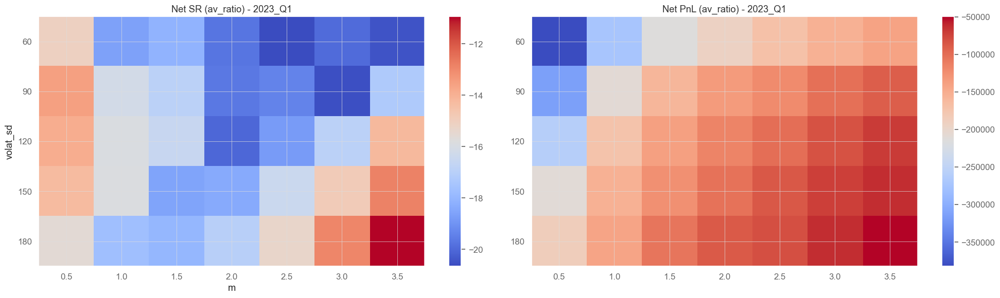

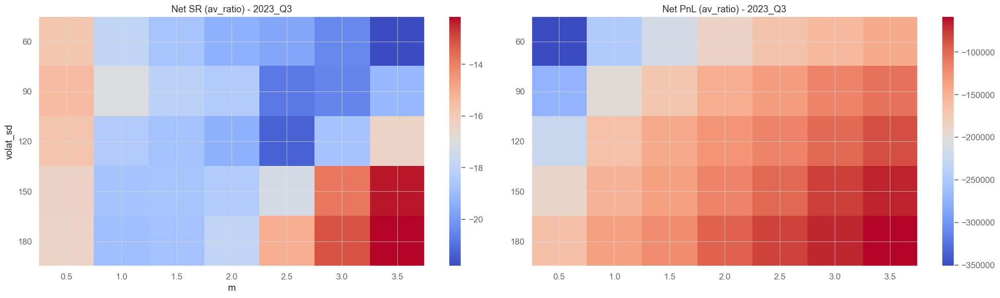

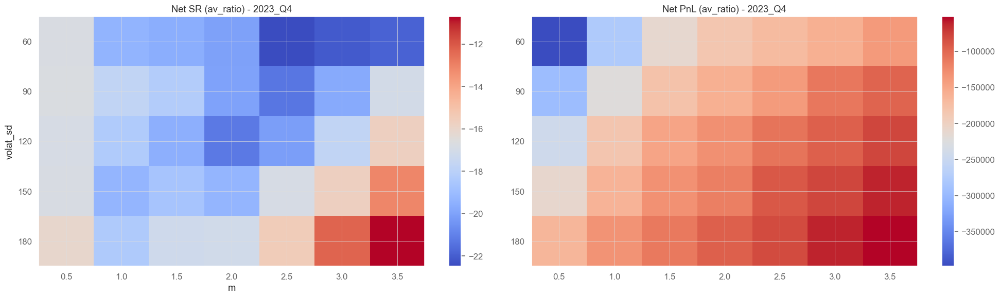

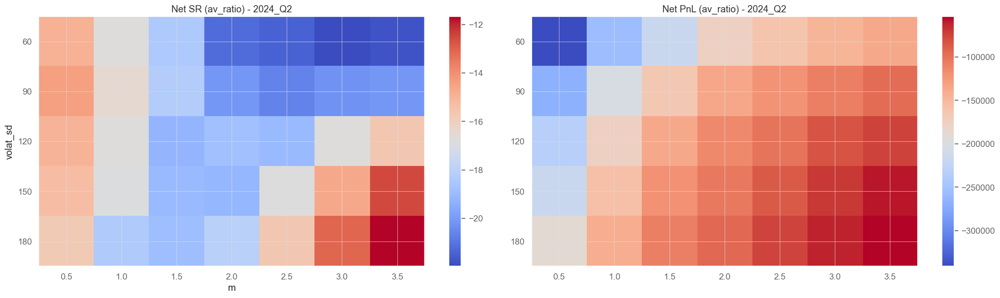

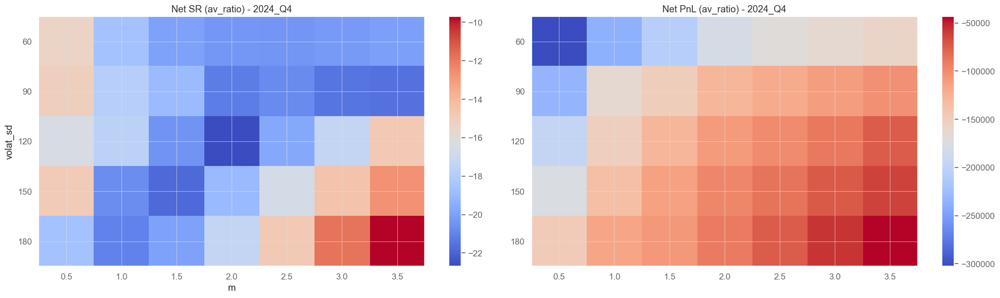

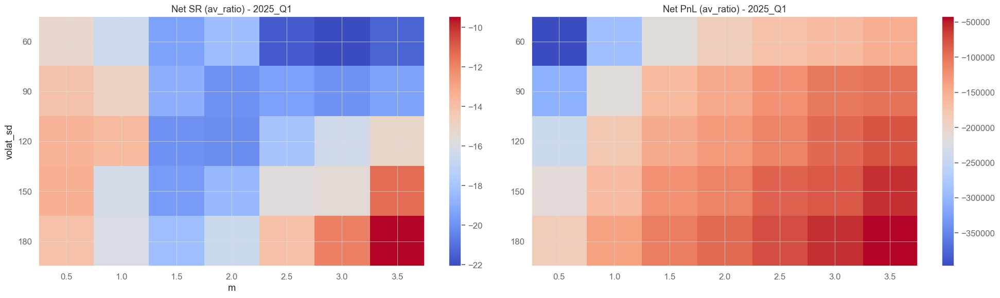

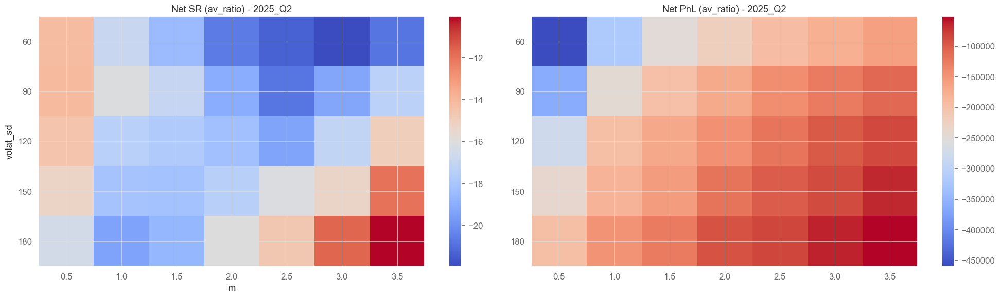

In [25]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_volatility[summary_all_volatility['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='volat_sd', columns='m', values='net_SR_avratio')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[0].set_title(f'Net SR (av_ratio) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='volat_sd', columns='m', values='net_PnL_avratio')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[1].set_title(f'Net PnL (av_ratio) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

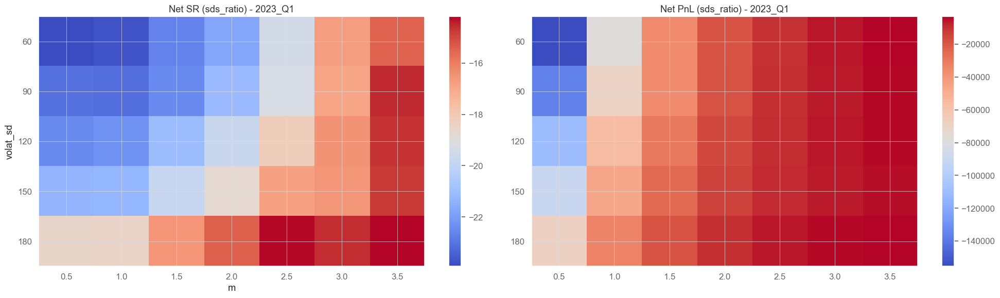

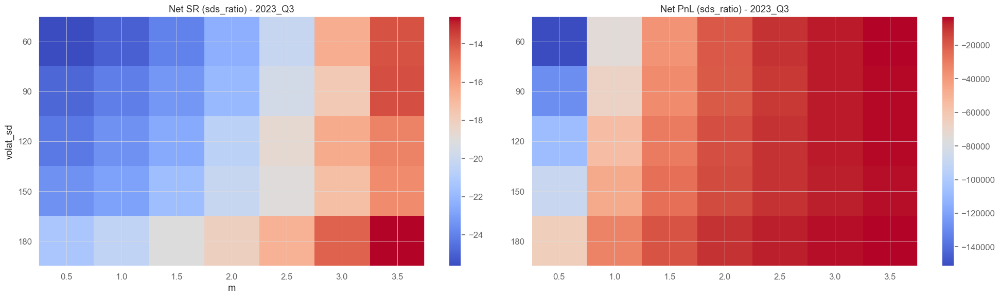

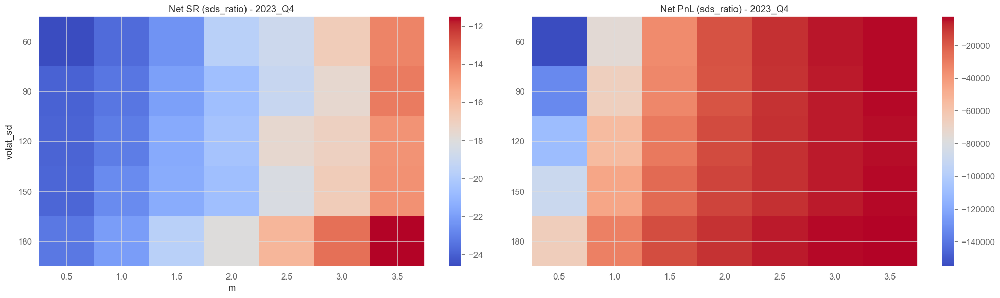

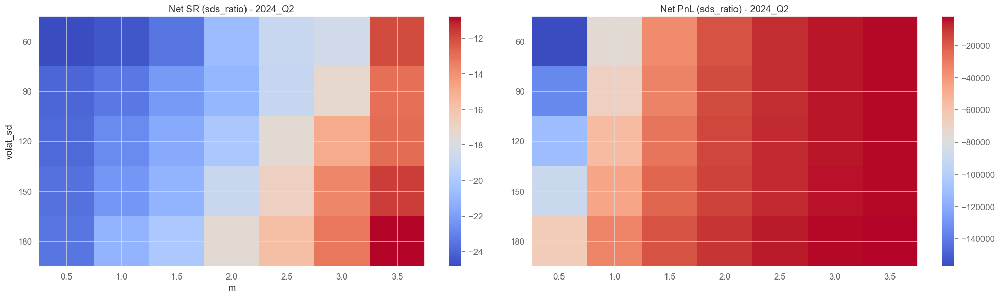

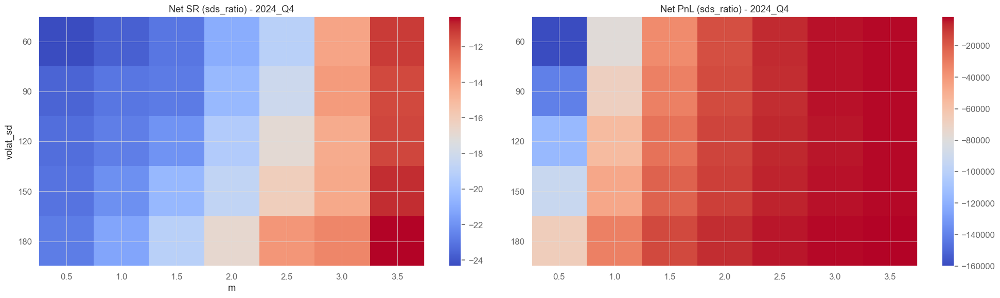

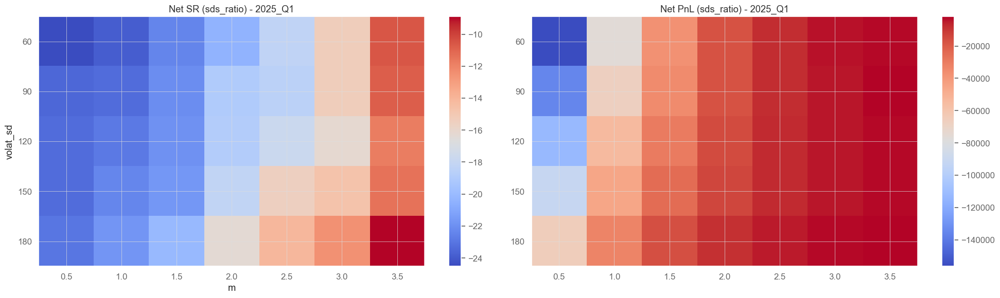

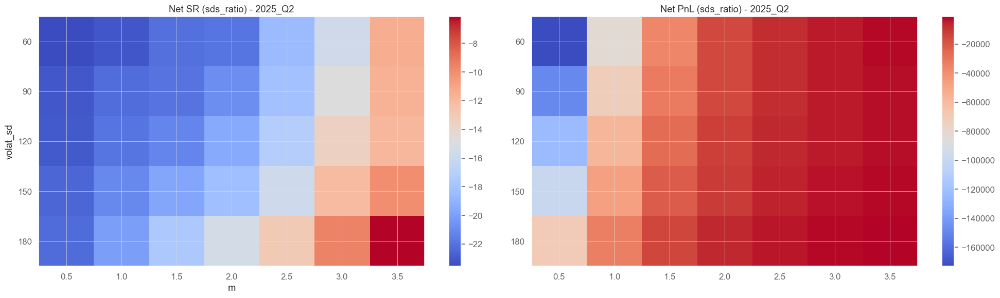

In [26]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_volatility[summary_all_volatility['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='volat_sd', columns='m', values='net_SR_sdsratio')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[0].set_title(f'Net SR (sds_ratio) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='volat_sd', columns='m', values='net_PnL_sdsratio')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[1].set_title(f'Net PnL (sds_ratio) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

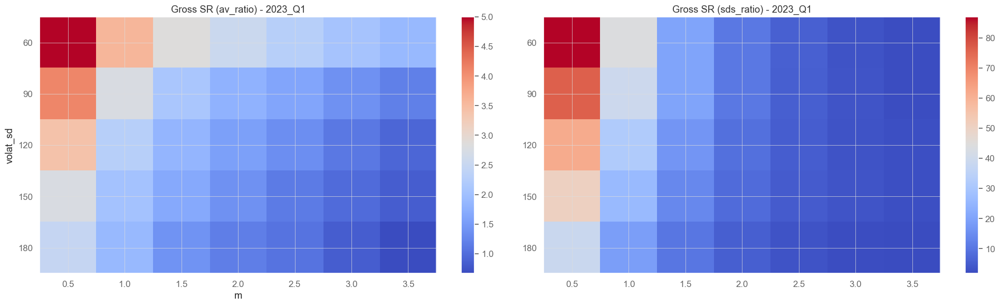

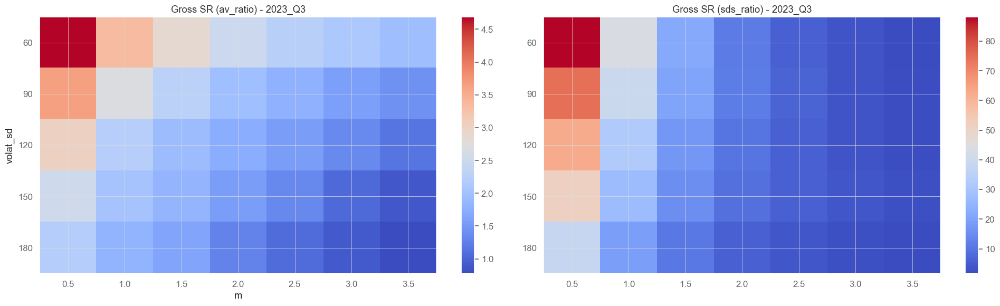

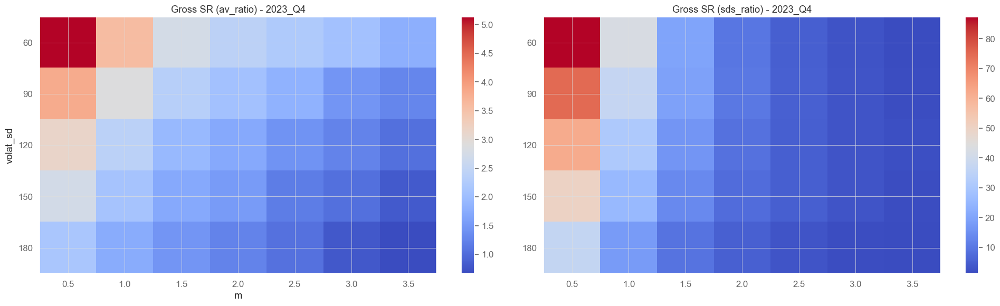

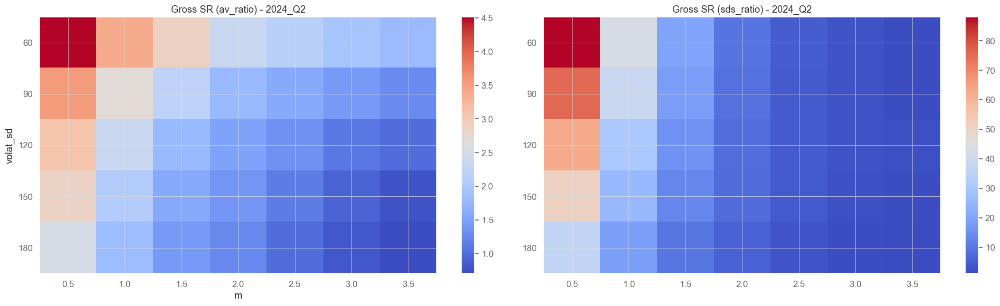

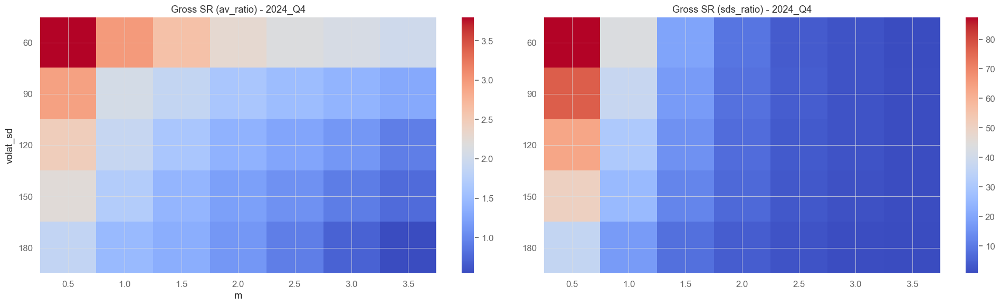

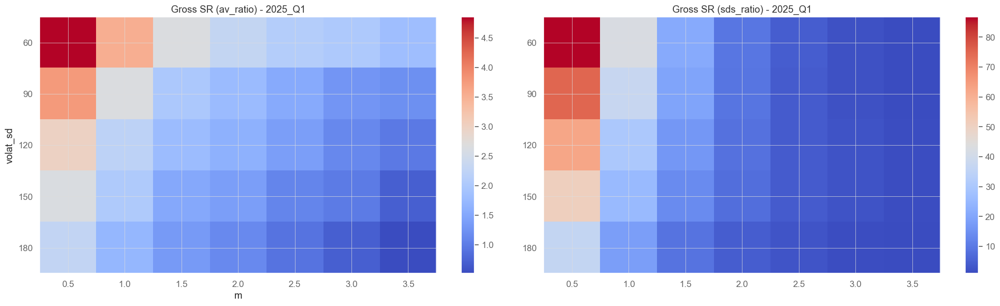

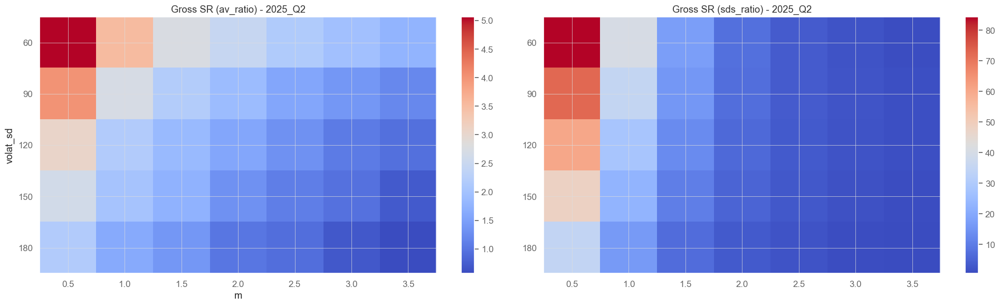

In [27]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_volatility[summary_all_volatility['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='volat_sd', columns='m', values='av_daily_ntrans_avratio')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[0].set_title(f'Gross SR (av_ratio) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='volat_sd', columns='m', values='av_daily_ntrans_sdsratio')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[1].set_title(f'Gross SR (sds_ratio) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

### Filtering
Correlation

In [28]:
# Calculate correlations for each quarter
correlation_results_by_quarter = []

for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Calculate correlations for this quarter
    corr_p = quarter_data['XAU'].corr(quarter_data['XAG'])
    corr_r = quarter_data['r_XAU'].corr(quarter_data['r_XAG'])
    
    correlation_results_by_quarter.append({
        'Quarter': quarter,
        'Price_Correlation': corr_p,
        'Returns_Correlation': corr_r
    })
    
    print(f"\n{quarter}:")
    print(f"XAU and XAG closing price correlation: {corr_p:.4f}")
    print(f"XAU and XAG returns correlation: {corr_r:.4f}")

# Create a summary dataframe
correlation_summary_by_quarter = pd.DataFrame(correlation_results_by_quarter)
print("\n" + "="*50)
print("Summary of Correlations by Quarter:")
print(correlation_summary_by_quarter)


2023_Q1:
XAU and XAG closing price correlation: 0.6057
XAU and XAG returns correlation: 0.6479

2023_Q3:
XAU and XAG closing price correlation: 0.8176
XAU and XAG returns correlation: 0.6736

2023_Q4:
XAU and XAG closing price correlation: 0.9105
XAU and XAG returns correlation: 0.7294

2024_Q2:
XAU and XAG closing price correlation: 0.6061
XAU and XAG returns correlation: 0.7718

2024_Q4:
XAU and XAG closing price correlation: 0.8604
XAU and XAG returns correlation: 0.7351

2025_Q1:
XAU and XAG closing price correlation: 0.9624
XAU and XAG returns correlation: 0.6641

2025_Q2:
XAU and XAG closing price correlation: 0.6522
XAU and XAG returns correlation: 0.5901

Summary of Correlations by Quarter:
   Quarter  Price_Correlation  Returns_Correlation
0  2023_Q1           0.605661             0.647909
1  2023_Q3           0.817584             0.673612
2  2023_Q4           0.910452             0.729426
3  2024_Q2           0.606120             0.771780
4  2024_Q4           0.860360       

In [29]:
import warnings

warnings.filterwarnings('ignore')


2023_Q1:
Daily Price Correlation - Mean: 0.6927, Std: 0.3345
Daily Returns Correlation - Mean: 0.6554, Std: 0.1764


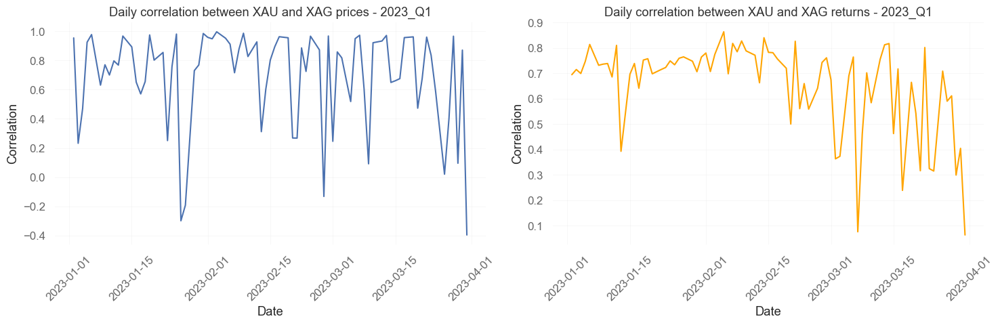


2023_Q3:
Daily Price Correlation - Mean: 0.6963, Std: 0.3154
Daily Returns Correlation - Mean: 0.6634, Std: 0.1563


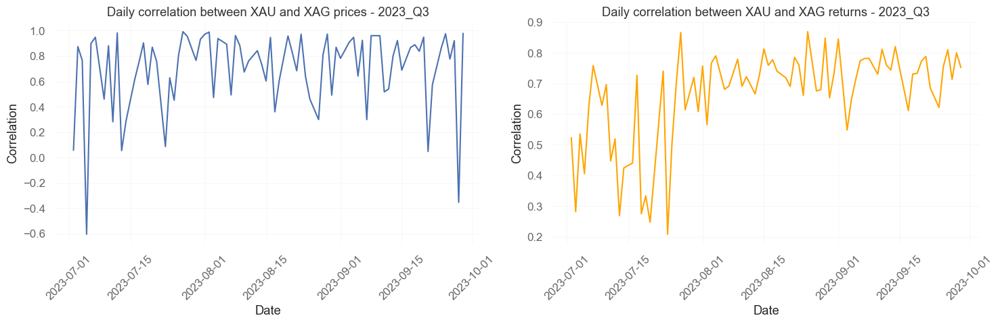


2023_Q4:
Daily Price Correlation - Mean: 0.6892, Std: 0.3577
Daily Returns Correlation - Mean: 0.7377, Std: 0.0829


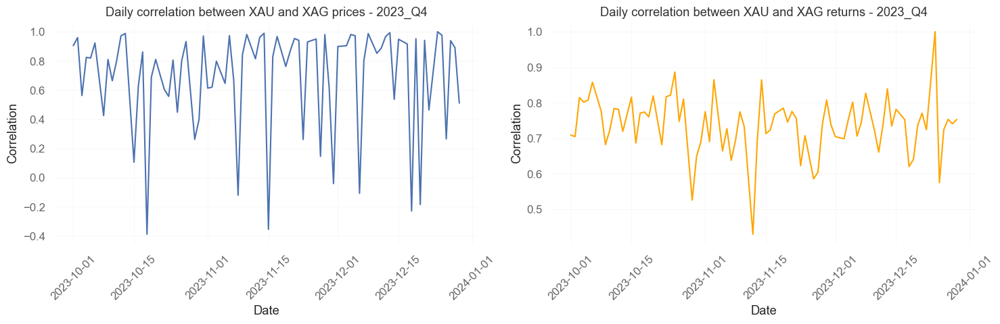


2024_Q2:
Daily Price Correlation - Mean: 0.7644, Std: 0.2931
Daily Returns Correlation - Mean: 0.7726, Std: 0.0643


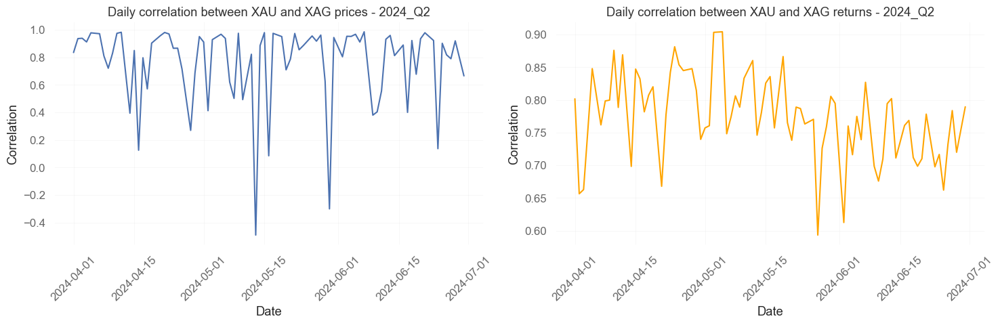


2024_Q4:
Daily Price Correlation - Mean: 0.7256, Std: 0.3032
Daily Returns Correlation - Mean: 0.7278, Std: 0.0926


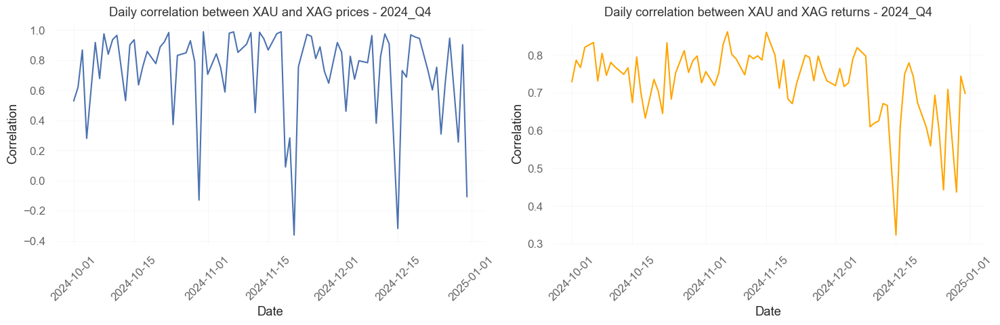


2025_Q1:
Daily Price Correlation - Mean: 0.6246, Std: 0.3374
Daily Returns Correlation - Mean: 0.6670, Std: 0.0726


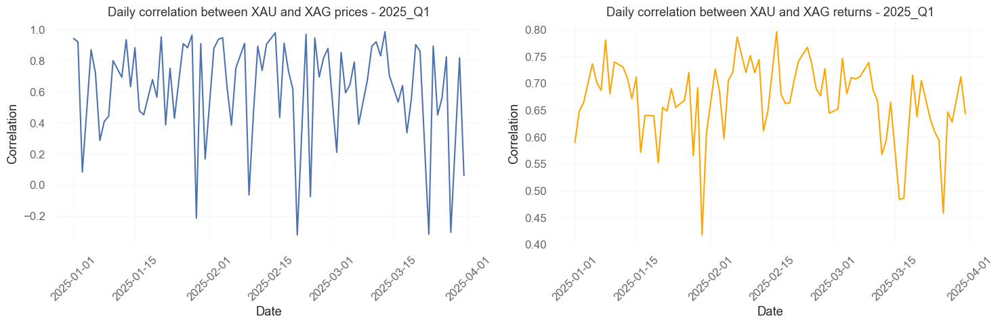


2025_Q2:
Daily Price Correlation - Mean: 0.5605, Std: 0.3700
Daily Returns Correlation - Mean: 0.6011, Std: 0.0763


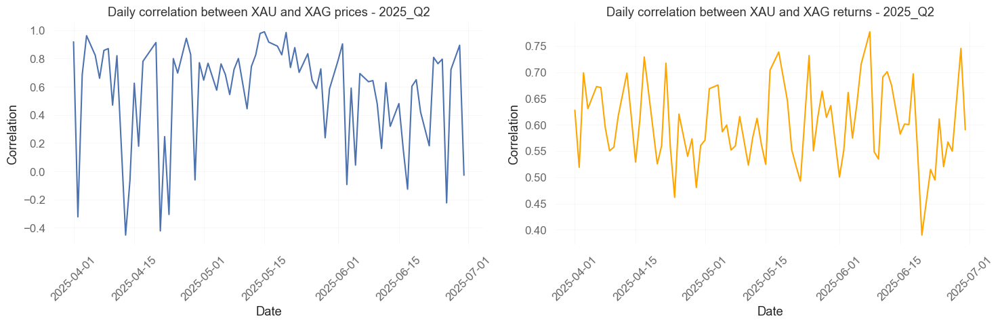


Summary by quarter:
        correlation_prices                                                    \
                     count      mean       std       min       25%       50%   
quarter                                                                        
2023_Q1               77.0  0.692738  0.334521 -0.396824  0.603545  0.802951   
2023_Q3               78.0  0.696266  0.315398 -0.605075  0.575214  0.802951   
2023_Q4               78.0  0.689188  0.357722 -0.389127  0.572416  0.821672   
2024_Q2               78.0  0.764391  0.293093 -0.491409  0.693241  0.887853   
2024_Q4               79.0  0.725593  0.303217 -0.361851  0.651422  0.830821   
2025_Q1               77.0  0.624579  0.337413 -0.322235  0.450254  0.715983   
2025_Q2               77.0  0.560466  0.369964 -0.451321  0.443905  0.686331   

                            correlation_returns                                \
              75%       max               count      mean       std       min   
quarter         

In [30]:
# Calculate daily correlations for each quarter separately
all_correlation_results = []

for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Calculate daily correlations for this quarter
    correlation_p_daily = quarter_data.resample("D").apply(lambda x: x['XAU'].corr(x['XAG']))
    correlation_r_daily = quarter_data.resample("D").apply(lambda x: x['r_XAU'].corr(x['r_XAG']))
    
    # Drop NaN values
    correlation_p_daily = correlation_p_daily.dropna()
    correlation_r_daily = correlation_r_daily.dropna()
    
    # Create a DataFrame with quarter indicator
    quarter_correlations = pd.DataFrame({
        'correlation_prices': correlation_p_daily,
        'correlation_returns': correlation_r_daily,
        'quarter': quarter
    })
    
    all_correlation_results.append(quarter_correlations)
    
    print(f"\n{quarter}:")
    print(f"Daily Price Correlation - Mean: {correlation_p_daily.mean():.4f}, Std: {correlation_p_daily.std():.4f}")
    print(f"Daily Returns Correlation - Mean: {correlation_r_daily.mean():.4f}, Std: {correlation_r_daily.std():.4f}")

    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot price correlation
    axes[0].plot(correlation_p_daily.index, correlation_p_daily.values)
    axes[0].set_title(f"Daily correlation between XAU and XAG prices - {quarter}")
    axes[0].set_xlabel("Date")
    axes[0].set_ylabel("Correlation")
    axes[0].grid(True, alpha=0.3)
    axes[0].tick_params(axis='x', rotation=45)
    
    # Plot returns correlation
    axes[1].plot(correlation_r_daily.index, correlation_r_daily.values, color='orange')
    axes[1].set_title(f"Daily correlation between XAU and XAG returns - {quarter}")
    axes[1].set_xlabel("Date")
    axes[1].set_ylabel("Correlation")
    axes[1].grid(True, alpha=0.3)
    axes[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

# Combine all quarters into one DataFrame
daily_correlations = pd.concat(all_correlation_results, axis=0)

# Save to file

print("\nSummary by quarter:")
print(daily_correlations.groupby('quarter')[['correlation_prices', 'correlation_returns']].describe())

Regression 

In [31]:
# Lets calculate the regression coefficient between prices P1 and P2
# for the whole sample

import statsmodels.api as sm

# the OLS regression requires dropping NaN values

all_data_2_nonan = all_data_2.dropna(subset=["XAU", 'XAG', 'r_XAU', 'r_XAG'])

X = all_data_2_nonan["XAG"]
y = all_data_2_nonan["XAU"]
X = sm.add_constant(X)  # adding a constant term for intercept
model_ols = sm.OLS(y, X).fit()

print(model_ols.summary())

# the coefficient is negative (-0.1365)
# R2 = 0.098

                            OLS Regression Results                            
Dep. Variable:                    XAU   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                 9.826e+05
Date:                Sun, 18 Jan 2026   Prob (F-statistic):               0.00
Time:                        12:55:48   Log-Likelihood:            -8.1252e+05
No. Observations:              124139   AIC:                         1.625e+06
Df Residuals:                  124137   BIC:                         1.625e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -500.2189      2.986   -167.536      0.0

In [32]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

def regression_selected(df, y_col, x_col, add_const=True):

    # If the group is empty return NaNs
    if df.empty:
        return pd.Series({
            'beta': np.nan,
            'pvalue': np.nan,
            'tstat': np.nan,
            'r2': np.nan
        })

    y = df[y_col]
    X = df[[x_col]]  # keep as DataFrame

    if add_const:
        X = sm.add_constant(X)
        x_param_name = x_col      # slope name in params/pvalues/etc.
    else:
        x_param_name = x_col      # only column present

    model = sm.OLS(y, X).fit()

    return pd.Series({
        'beta':   model.params[x_param_name],
        'pvalue': model.pvalues[x_param_name],
        'tstat':  model.tvalues[x_param_name],
        'r2':     model.rsquared
    })

In [33]:
all_data_2_nonan = all_data_2.dropna(subset=["XAU", 'XAG', 'r_XAU', 'r_XAG'])

In [34]:
# Calculate regression for each quarter separately
regression_results_by_quarter = []
daily_regressions_P_all = []
daily_regressions_R_all = []

for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_data = all_data_2_nonan[all_data_2_nonan['quarter'] == quarter].copy()
    
    # Drop NaN values for regression
    quarter_data_clean = quarter_data.dropna(subset=['XAU', 'XAG'])

    daily_regressions_P = quarter_data_clean.resample("D").apply(
        lambda x: regression_selected(x, y_col='XAU', x_col='XAG', add_const=True)
    ).dropna()

    daily_regressions_R = quarter_data_clean.resample("D").apply(
        lambda x: regression_selected(x, y_col='r_XAU', x_col='r_XAG', add_const=True)
    ).dropna()

    daily_regressions_P['quarter'] = quarter
    daily_regressions_R['quarter'] = quarter

    daily_regressions_P_all.append(daily_regressions_P)
    daily_regressions_R_all.append(daily_regressions_R)

# Create summary dataframe
daily_regressions_P_all = pd.DataFrame(pd.concat(daily_regressions_P_all))
daily_regressions_R_all = pd.DataFrame(pd.concat(daily_regressions_R_all))

print("\n" + "="*50)
print("Summary of Regression Results by Quarter:")
print(daily_regressions_P_all)
print(daily_regressions_R_all)

Processing quarter: 2023_Q1
Processing quarter: 2023_Q3
Processing quarter: 2023_Q4
Processing quarter: 2024_Q2
Processing quarter: 2024_Q4
Processing quarter: 2025_Q1
Processing quarter: 2025_Q2

Summary of Regression Results by Quarter:
                                beta         pvalue      tstat        r2  \
2023-01-02 00:00:00+00:00  37.046330   2.170376e-38  27.323087  0.916518   
2023-01-03 00:00:00+00:00   6.092651   1.027061e-04   3.942083  0.053857   
2023-01-04 00:00:00+00:00   8.476150   1.464292e-16   8.812167  0.221455   
2023-01-05 00:00:00+00:00  40.192041  6.685905e-117  40.287690  0.856020   
2023-01-06 00:00:00+00:00  61.905893  2.992734e-140  66.880266  0.956587   
...                              ...            ...        ...       ...   
2025-06-25 00:00:00+00:00  20.730562   3.145109e-61  21.659463  0.632141   
2025-06-26 00:00:00+00:00 -20.134715   1.991831e-04  -3.771221  0.049516   
2025-06-27 00:00:00+00:00  33.147421   2.595187e-34  14.868086  0.521294   
2

Cointegration

In [35]:
# lets use PP and KPSS tests for cointegration
# based on the functions from lab03
# extended to control for empty dataframes

from arch.unitroot import PhillipsPerron, KPSS

# the function to get residuals from OLS regression
def _eg_residuals(df: pd.DataFrame, col1: str, col2: str):
    X = sm.add_constant(df[col1].values, has_constant="add")
    y = df[col2].values
    model = sm.OLS(y, X).fit()
    return model.resid

# the function for PP p-value
def eg_pp_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                 trend: str = "c") -> float:
    # If the group is empty return NaN
    if df.empty:
        return np.nan

    resid = _eg_residuals(df, col1, col2)
    return float(PhillipsPerron(resid, trend=trend).pvalue)

# the function for KPSS p-value
def eg_kpss_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                   trend: str = "c") -> float:
    # If the group is empty return NaN
    if df.empty:
        return np.nan
    resid = _eg_residuals(df, col1, col2)
    return float(KPSS(resid, trend=trend).pvalue)

In [36]:
print("p-value of PP test:", eg_pp_pvalue(all_data_2_nonan, "XAU", "XAG"))
print("p-value of KPSS test:", eg_kpss_pvalue(all_data_2_nonan, "XAU", "XAG"))

p-value of PP test: 0.06864261802821073
p-value of KPSS test: 0.0001


In [37]:
# how about daily cointegration tests?

# Group by date and calculate cointegration tests for each day
# Calculate daily cointegration tests for each quarter separately
daily_PP_all = []
daily_KPSS_all = []

for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter].dropna(subset=['XAU', 'XAG'])
    
    # Group by date and calculate cointegration tests for each day
    for date, group in quarter_data.groupby(quarter_data.index.date):
        if len(group) > 10:  # Ensure enough data points for the test
            try:
                pp_pvalue = eg_pp_pvalue(group, "XAU", "XAG")
                daily_PP_all.append({'date': date, 'pvalue': pp_pvalue, 'quarter': quarter})
            except:
                pass
            
            try:
                kpss_pvalue = eg_kpss_pvalue(group, "XAU", "XAG")
                daily_KPSS_all.append({'date': date, 'pvalue': kpss_pvalue, 'quarter': quarter})
            except:
                pass

# Convert to DataFrames with date index
daily_PP_tests = pd.DataFrame(daily_PP_all).set_index('date')
daily_KPSS_tests = pd.DataFrame(daily_KPSS_all).set_index('date')

# Remove NaN values
daily_PP_tests = daily_PP_tests.dropna(subset=['pvalue'])
daily_KPSS_tests = daily_KPSS_tests.dropna(subset=['pvalue'])

print(f"\nDaily PP tests: {len(daily_PP_tests)} days")
print(f"Daily KPSS tests: {len(daily_KPSS_tests)} days")

Processing quarter: 2023_Q1
Processing quarter: 2023_Q3
Processing quarter: 2023_Q4
Processing quarter: 2024_Q2
Processing quarter: 2024_Q4
Processing quarter: 2025_Q1
Processing quarter: 2025_Q2

Daily PP tests: 543 days
Daily KPSS tests: 545 days


In [38]:
daily_PP_tests

,pvalue,quarter
date,,
2023-01-02,0.072001,2023_Q1
2023-01-03,0.705547,2023_Q1
2023-01-04,0.507384,2023_Q1
2023-01-05,0.027094,2023_Q1
2023-01-06,0.047383,2023_Q1
...,...,...
2025-06-25,0.220312,2025_Q2
2025-06-26,0.164533,2025_Q2
2025-06-27,0.409804,2025_Q2


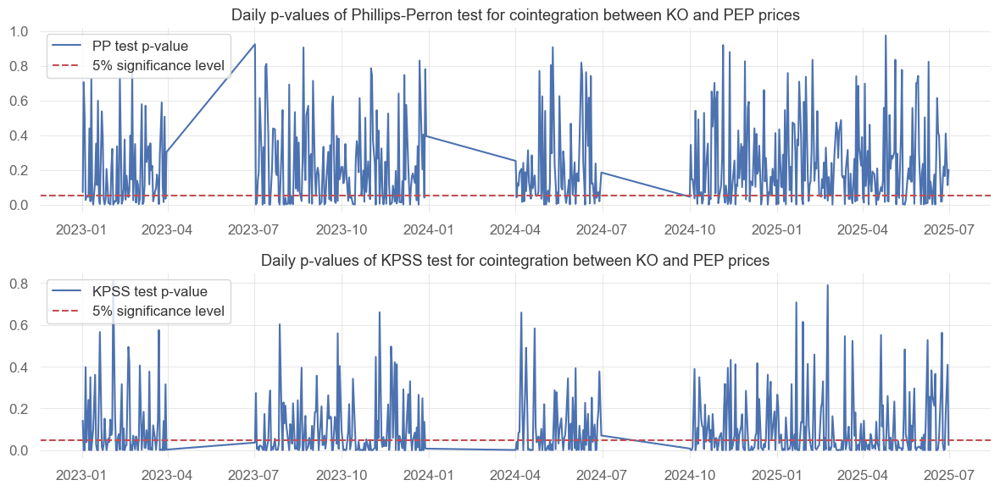

In [39]:
# lets plot p-values of both tests
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(daily_PP_tests['pvalue'], label="PP test p-value")
plt.axhline(y=0.05, color='r', linestyle='--', label='5% significance level')
plt.title("Daily p-values of Phillips-Perron test for cointegration between KO and PEP prices")
plt.legend()
plt.subplot(2, 1, 2)
plt.plot(daily_KPSS_tests['pvalue'], label="KPSS test p-value")
plt.axhline(y=0.05, color='r', linestyle='--', label='5% significance level')
plt.title("Daily p-values of KPSS test for cointegration between KO and PEP prices")
plt.legend()
plt.tight_layout()
plt.show()

In [40]:
print("Share of days with PP test p-value below 0.05 (indicating cointegration):", 
      (daily_PP_tests['pvalue'] < 0.05).sum() / len(daily_PP_tests))

# KPSS test (null: cointegration)
print("Share of days with KPSS test p-value above 0.05 (indicating cointegration):", 
      (daily_KPSS_tests['pvalue'] > 0.05).sum() / len(daily_KPSS_tests))


Share of days with PP test p-value below 0.05 (indicating cointegration): 0.31307550644567217
Share of days with KPSS test p-value above 0.05 (indicating cointegration): 0.44036697247706424


In [41]:
daily_PP_tests.index = pd.to_datetime(daily_PP_tests.index).tz_localize(all_data_2_nonan.index.tz)
daily_KPSS_tests.index = pd.to_datetime(daily_KPSS_tests.index).tz_localize(all_data_2_nonan.index.tz)

In [42]:
# Merge all dataframes using outer join to preserve all dates
combined_daily_stats = daily_correlations.copy()

# Merge regression results for prices
combined_daily_stats = combined_daily_stats.merge(
    daily_regressions_P_all.add_prefix("regression_price_"),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge regression results for returns
combined_daily_stats = combined_daily_stats.merge(
    daily_regressions_R_all.add_prefix("regression_return_"),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge PP test results
combined_daily_stats = combined_daily_stats.merge(
    daily_PP_tests[['pvalue']].rename(columns={'pvalue': 'PP_pvalue'}),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge KPSS test results
combined_daily_stats = combined_daily_stats.merge(
    daily_KPSS_tests[['pvalue']].rename(columns={'pvalue': 'KPSS_pvalue'}),
    left_index=True,
    right_index=True,
    how='outer'
)

combined_daily_stats.head()

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-02 00:00:00+00:00,0.955099,0.694811,2023_Q1,37.046330,2.170376e-38,27.323087,0.916518,2023_Q1,0.281785,2.519257e-11,7.966655,0.482762,2023_Q1,0.072001,0.141616
2023-01-03 00:00:00+00:00,0.232143,0.715152,2023_Q1,6.092651,1.027061e-04,3.942083,0.053857,2023_Q1,0.374290,2.314759e-44,16.905276,0.511443,2023_Q1,0.705547,0.000100
2023-01-04 00:00:00+00:00,0.470222,0.699511,2023_Q1,8.476150,1.464292e-16,8.812167,0.221455,2023_Q1,0.301728,9.998532e-42,16.173314,0.489315,2023_Q1,0.507384,0.000100
2023-01-05 00:00:00+00:00,0.925455,0.746938,2023_Q1,40.192041,6.685905e-117,40.287690,0.856020,2023_Q1,0.275026,2.631438e-50,18.561552,0.557917,2023_Q1,0.027094,0.397788
2023-01-06 00:00:00+00:00,0.978052,0.813984,2023_Q1,61.905893,2.992734e-140,66.880266,0.956587,2023_Q1,0.453712,8.845514e-50,19.965089,0.662569,2023_Q1,0.047383,0.037891


In [43]:
combined_daily_stats.index = combined_daily_stats.index.tz_convert(None)

In [44]:
combined_daily_stats

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-02,0.955099,0.694811,2023_Q1,37.046330,2.170376e-38,27.323087,0.916518,2023_Q1,0.281785,2.519257e-11,7.966655,0.482762,2023_Q1,0.072001,0.141616
2023-01-03,0.232143,0.715152,2023_Q1,6.092651,1.027061e-04,3.942083,0.053857,2023_Q1,0.374290,2.314759e-44,16.905276,0.511443,2023_Q1,0.705547,0.000100
2023-01-04,0.470222,0.699511,2023_Q1,8.476150,1.464292e-16,8.812167,0.221455,2023_Q1,0.301728,9.998532e-42,16.173314,0.489315,2023_Q1,0.507384,0.000100
2023-01-05,0.925455,0.746938,2023_Q1,40.192041,6.685905e-117,40.287690,0.856020,2023_Q1,0.275026,2.631438e-50,18.561552,0.557917,2023_Q1,0.027094,0.397788
2023-01-06,0.978052,0.813984,2023_Q1,61.905893,2.992734e-140,66.880266,0.956587,2023_Q1,0.453712,8.845514e-50,19.965089,0.662569,2023_Q1,0.047383,0.037891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-25,0.795581,0.520234,2025_Q2,20.730562,3.145109e-61,21.659463,0.632141,2025_Q2,0.320203,1.796228e-20,10.064928,0.270644,2025_Q2,0.220312,0.000201
2025-06-26,-0.223143,0.567185,2025_Q2,-20.134715,1.991831e-04,-3.771221,0.049516,2025_Q2,0.349459,8.235278e-25,11.378747,0.321698,2025_Q2,0.164533,0.004504
2025-06-27,0.722007,0.549610,2025_Q2,33.147421,2.595187e-34,14.868086,0.521294,2025_Q2,0.348387,1.411477e-17,9.373397,0.302071,2025_Q2,0.409804,0.177078
2025-06-29,0.893966,0.745378,2025_Q2,44.088456,1.462110e-25,16.562802,0.801359,2025_Q2,0.370259,1.353889e-13,9.220158,0.555588,2025_Q2,0.111889,0.409146


In [45]:
combined_daily_stats.index = combined_daily_stats.index + pd.to_timedelta(np.where(combined_daily_stats.index.day_name() == "Friday", "3D", "1D")) 

combined_daily_stats.head()

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-03,0.955099,0.694811,2023_Q1,37.046330,2.170376e-38,27.323087,0.916518,2023_Q1,0.281785,2.519257e-11,7.966655,0.482762,2023_Q1,0.072001,0.141616
2023-01-04,0.232143,0.715152,2023_Q1,6.092651,1.027061e-04,3.942083,0.053857,2023_Q1,0.374290,2.314759e-44,16.905276,0.511443,2023_Q1,0.705547,0.000100
2023-01-05,0.470222,0.699511,2023_Q1,8.476150,1.464292e-16,8.812167,0.221455,2023_Q1,0.301728,9.998532e-42,16.173314,0.489315,2023_Q1,0.507384,0.000100
2023-01-06,0.925455,0.746938,2023_Q1,40.192041,6.685905e-117,40.287690,0.856020,2023_Q1,0.275026,2.631438e-50,18.561552,0.557917,2023_Q1,0.027094,0.397788
2023-01-09,0.978052,0.813984,2023_Q1,61.905893,2.992734e-140,66.880266,0.956587,2023_Q1,0.453712,8.845514e-50,19.965089,0.662569,2023_Q1,0.047383,0.037891


In [46]:
# based on the combined daily statistics
# lets create filtering rules
# storing them as new columns, where
# 1 means that the filter condition is met (trade on that day)
# and 0 means that it is not met (do NOT trade on that day)

# based on correlation between prices
combined_daily_stats['filter_correlation_prices_06'] = (combined_daily_stats['correlation_prices'] > 0.6) * 1
combined_daily_stats['filter_correlation_prices_07'] = (combined_daily_stats['correlation_prices'] > 0.7) * 1
combined_daily_stats['filter_correlation_prices_08'] = (combined_daily_stats['correlation_prices'] > 0.8) * 1
combined_daily_stats['filter_correlation_prices_09'] = (combined_daily_stats['correlation_prices'] > 0.9) * 1
# based on correlation between returns
combined_daily_stats['filter_correlation_returns_06'] = (combined_daily_stats['correlation_returns'] > 0.6) * 1
combined_daily_stats['filter_correlation_returns_07'] = (combined_daily_stats['correlation_returns'] > 0.7) * 1
combined_daily_stats['filter_correlation_returns_08'] = (combined_daily_stats['correlation_returns'] > 0.8) * 1
# based on regression for prices - significant beta above some threshold
combined_daily_stats['filter_regression_price_beta_sig_above0'] = ((combined_daily_stats['regression_price_beta'] > 0) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_price_beta_sig_above025'] = ((combined_daily_stats['regression_price_beta'] > 0.25) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_price_beta_sig_above05'] = ((combined_daily_stats['regression_price_beta'] > 0.5) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
# based on regression for returns - significant beta above some threshold
combined_daily_stats['filter_regression_return_beta_sig_above0'] = ((combined_daily_stats['regression_return_beta'] > 0) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_return_beta_sig_above025'] = ((combined_daily_stats['regression_return_beta'] > 0.25) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_return_beta_sig_above05'] = ((combined_daily_stats['regression_return_beta'] > 0.5) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
# cointegration based filters
combined_daily_stats['filter_PP_cointegration_10'] = (combined_daily_stats['PP_pvalue'] < 0.1) * 1
combined_daily_stats['filter_PP_cointegration_05'] = (combined_daily_stats['PP_pvalue'] < 0.05) * 1
combined_daily_stats['filter_PP_cointegration_01'] = (combined_daily_stats['PP_pvalue'] < 0.01) * 1
combined_daily_stats['filter_KPSS_cointegration_10'] = (combined_daily_stats['KPSS_pvalue'] > 0.1) * 1
combined_daily_stats['filter_KPSS_cointegration_05'] = (combined_daily_stats['KPSS_pvalue'] > 0.05) * 1
combined_daily_stats['filter_KPSS_cointegration_01'] = (combined_daily_stats['KPSS_pvalue'] > 0.01) * 1

In [47]:
summary_daily = pd.DataFrame()

# Loop through each quarter
for quarter in quarters:
        print(f"Processing quarter: {quarter}")
        
        # Filter data for the current quarter
        quarter_mask = all_data_2["quarter"] == quarter
        quarter_data = all_data_2[quarter_mask].copy()
        
        # Fixed parameters based on your analysis
        volat_sd = 60
        m = 3.5
        
        print(f"  volat_sd: {volat_sd}, m: {m}")
        
        # Calculate signal and bounds
        signal_sdsratio = quarter_data["spread_sdsratio"]
        std_spread_sdsratio = signal_sdsratio.rolling(window=volat_sd).std()
        upper_bound_sdsratio = m * std_spread_sdsratio
        lower_bound_sdsratio = -m * std_spread_sdsratio
        
        # Position
        pos_sdsratio = positionVB(signal=signal_sdsratio,
                                                          lower=lower_bound_sdsratio,
                                                          upper=upper_bound_sdsratio,
                                                          pos_flat=pos_flat[quarter_mask],
                                                          strategy="mr")
        
        # Number of transactions
        n_trans_sdsratio = np.abs(np.diff(pos_sdsratio, prepend=0))
        n_trans_sdsratio = pd.Series(n_trans_sdsratio, index=quarter_data.index)
        
        # Calculate PnL
        pnl_gross_sdsratio = pos_sdsratio * (quarter_data["XAU"].diff() - quarter_data["sds_ratio"] * quarter_data["XAG"].diff())
        pnl_net_sdsratio = pnl_gross_sdsratio - n_trans_sdsratio * (15 + quarter_data["sds_ratio"] * 10)
        
        # Aggregate to daily
        pnl_gross_sdsratio_daily = pnl_gross_sdsratio.resample("D").sum().dropna()
        pnl_net_sdsratio_daily = pnl_net_sdsratio.resample("D").sum().dropna()
        n_trans_sdsratio_daily = n_trans_sdsratio.resample("D").sum().dropna()
        
        # Calculate summary measures
        gross_SR_sdsratio = mySR(pnl_gross_sdsratio_daily, scale=252)
        net_SR_sdsratio = mySR(pnl_net_sdsratio_daily, scale=252)
        gross_PnL_sdsratio = pnl_gross_sdsratio_daily.sum()
        net_PnL_sdsratio = pnl_net_sdsratio_daily.sum()
        av_daily_ntrans_sdsratio = n_trans_sdsratio_daily.mean()
        
        print(f"  Net SR: {net_SR_sdsratio:.4f}, Net PnL: {net_PnL_sdsratio:.2f}")
        
        # Create summary dataframe with quarter indicator
        summary = pd.DataFrame({
            'volat_sd': [volat_sd],
            'm': [m],
            'quarter': [quarter],
            'gross_SR_sdsratio': [gross_SR_sdsratio],
            'net_SR_sdsratio': [net_SR_sdsratio],
            'gross_PnL_sdsratio': [gross_PnL_sdsratio],
            'net_PnL_sdsratio': [net_PnL_sdsratio],
            'av_daily_ntrans_sdsratio': [av_daily_ntrans_sdsratio],
        })

        summary_daily_stats = pd.DataFrame({
                'quarter': quarter,
                'pnl_gross_sdsratio': pnl_gross_sdsratio_daily,
                'pnl_net_sdsratio': pnl_net_sdsratio_daily,
                'n_trans_sdsratio': n_trans_sdsratio_daily})
        
        summary_daily = pd.concat([summary_daily, summary_daily_stats], ignore_index=False)

        # Append to results (create if doesn't exist)
        if 'summary_VB_optimal' not in locals():
            summary_VB_optimal = summary.copy()
        else:
            summary_VB_optimal = pd.concat([summary_VB_optimal, summary], ignore_index=True)



Processing quarter: 2023_Q1
  volat_sd: 60, m: 3.5
  Net SR: -15.4558, Net PnL: -3631.61
Processing quarter: 2023_Q3
  volat_sd: 60, m: 3.5
  Net SR: -13.8678, Net PnL: -3499.31
Processing quarter: 2023_Q4
  volat_sd: 60, m: 3.5
  Net SR: -14.1533, Net PnL: -2875.24
Processing quarter: 2024_Q2
  volat_sd: 60, m: 3.5
  Net SR: -12.0046, Net PnL: -2638.71
Processing quarter: 2024_Q4
  volat_sd: 60, m: 3.5
  Net SR: -11.1269, Net PnL: -2032.30
Processing quarter: 2025_Q1
  volat_sd: 60, m: 3.5
  Net SR: -10.5602, Net PnL: -2304.65
Processing quarter: 2025_Q2
  volat_sd: 60, m: 3.5
  Net SR: -11.3764, Net PnL: -2224.71


In [48]:
summary_daily

,quarter,pnl_gross_sdsratio,pnl_net_sdsratio,n_trans_sdsratio
2023-01-01 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-02 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-03 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-04 00:00:00+00:00,2023_Q1,-3.173975,-43.641398,2.0
2023-01-05 00:00:00+00:00,2023_Q1,12.520494,-26.106346,2.0
...,...,...,...,...
2025-06-26 00:00:00+00:00,2025_Q2,-17.474149,-59.784079,2.0
2025-06-27 00:00:00+00:00,2025_Q2,9.386077,-32.936506,2.0
2025-06-28 00:00:00+00:00,2025_Q2,0.000000,0.000000,0.0
2025-06-29 00:00:00+00:00,2025_Q2,0.000000,0.000000,0.0


In [49]:
# remove weekends with no trading
daily_pnls = summary_daily.copy()

daily_pnls.head()

,quarter,pnl_gross_sdsratio,pnl_net_sdsratio,n_trans_sdsratio
2023-01-01 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-02 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-03 00:00:00+00:00,2023_Q1,0.000000,0.000000,0.0
2023-01-04 00:00:00+00:00,2023_Q1,-3.173975,-43.641398,2.0
2023-01-05 00:00:00+00:00,2023_Q1,12.520494,-26.106346,2.0


In [50]:
daily_pnls.index = daily_pnls.index.tz_localize(None)

# Ensure combined_daily_stats index is also timezone-naive
combined_daily_stats_notz = combined_daily_stats.copy()
if combined_daily_stats_notz.index.tz is not None:
    combined_daily_stats_notz.index = combined_daily_stats_notz.index.tz_localize(None)

# Merge on index to ensure proper alignment
daily_pnls_filters = daily_pnls.merge(
    combined_daily_stats_notz.filter(regex='^filter_'),
    left_index=True,
    right_index=True,
    how='left'
)

daily_pnls_filters.head()

,quarter,pnl_gross_sdsratio,pnl_net_sdsratio,n_trans_sdsratio,filter_correlation_prices_06,filter_correlation_prices_07,filter_correlation_prices_08,filter_correlation_prices_09,filter_correlation_returns_06,filter_correlation_returns_07,...,filter_regression_price_beta_sig_above05,filter_regression_return_beta_sig_above0,filter_regression_return_beta_sig_above025,filter_regression_return_beta_sig_above05,filter_PP_cointegration_10,filter_PP_cointegration_05,filter_PP_cointegration_01,filter_KPSS_cointegration_10,filter_KPSS_cointegration_05,filter_KPSS_cointegration_01
2023-01-01,2023_Q1,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02,2023_Q1,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03,2023_Q1,0.000000,0.000000,0.0,1.0,1.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
2023-01-04,2023_Q1,-3.173975,-43.641398,2.0,0.0,0.0,0.0,0.0,1.0,1.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-05,2023_Q1,12.520494,-26.106346,2.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

print("Gross PnL SR:", mySR(daily_pnls['pnl_gross_sdsratio'], scale = 252))
print("Net PnL SR:", mySR(daily_pnls['pnl_net_sdsratio'], scale = 252))

# and average number of trades per day
print("Average number of trades per day:", daily_pnls['n_trans_sdsratio'].mean())

Gross PnL SR: -0.3780529548837283
Net PnL SR: -12.487525251653341
Average number of trades per day: 1.5047318611987381


In [52]:
pnl_gross_sdsratio_filtered = daily_pnls_filters['pnl_gross_sdsratio'] * daily_pnls_filters['filter_correlation_prices_06']
pnl_net_sdsratio_filtered = daily_pnls_filters['pnl_net_sdsratio'] * daily_pnls_filters['filter_correlation_prices_06']

print("Gross PnL SR after applying filter_correlation_prices_06:", 
      mySR(pnl_gross_sdsratio_filtered, scale = 252))
print("Net PnL SR after applying filter_correlation_prices_06:", 
      mySR(pnl_net_sdsratio_filtered, scale = 252))

# and average number of trades per day
n_trades_filtered = daily_pnls_filters['n_trans_sdsratio'] * daily_pnls_filters['filter_correlation_prices_06']
print("Average number of trades per day after applying filter_correlation_prices_06:", n_trades_filtered.mean())

# much better results!
# (although still negative in net terms)

Gross PnL SR after applying filter_correlation_prices_06: -0.41814525056718305
Net PnL SR after applying filter_correlation_prices_06: -12.23426718013968
Average number of trades per day after applying filter_correlation_prices_06: 1.474074074074074


In [53]:
results_filters_by_quarter = []

for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_pnls = daily_pnls_filters[daily_pnls_filters['quarter'] == quarter]
    
    for col in daily_pnls_filters.columns:
        if col.startswith('filter_'):
            pnl_gross_filtered = quarter_pnls['pnl_gross_sdsratio'] * quarter_pnls[col]
            pnl_net_filtered = quarter_pnls['pnl_net_sdsratio'] * quarter_pnls[col]
            n_trades_filtered = quarter_pnls['n_trans_sdsratio'] * quarter_pnls[col]
            
            results_filters_by_quarter.append({
                'quarter': quarter,
                'filter': col,
                'gross_SR': mySR(pnl_gross_filtered, scale=252),
                'net_SR': mySR(pnl_net_filtered, scale=252),
                'gross_PnL': pnl_gross_filtered.sum(),
                'net_PnL': pnl_net_filtered.sum(),
                'avg_n_trades_per_day': n_trades_filtered.mean()
            })

results_filters_by_quarter_df = pd.DataFrame(results_filters_by_quarter)



Processing quarter: 2023_Q1

Processing quarter: 2023_Q3

Processing quarter: 2023_Q4

Processing quarter: 2024_Q2

Processing quarter: 2024_Q4

Processing quarter: 2025_Q1

Processing quarter: 2025_Q2


In [54]:
results_filters_by_quarter_df.groupby('quarter').apply(lambda x: x.sort_values(by='net_SR', ascending=False))

quarter                                      filter  gross_SR  \
quarter                                                                      
2023_Q1 12   2023_Q1   filter_regression_return_beta_sig_above05  2.540897   
        6    2023_Q1               filter_correlation_returns_08  2.463138   
        15   2023_Q1                  filter_PP_cointegration_01 -0.668959   
        16   2023_Q1                filter_KPSS_cointegration_10  2.480053   
        3    2023_Q1                filter_correlation_prices_09  3.060810   
...              ...                                         ...       ...   
2025_Q2 122  2025_Q2   filter_regression_price_beta_sig_above025 -0.432360   
        121  2025_Q2     filter_regression_price_beta_sig_above0 -0.432360   
        125  2025_Q2  filter_regression_return_beta_sig_above025 -0.867133   
        124  2025_Q2    filter_regression_return_beta_sig_above0 -0.867133   
        120  2025_Q2               filter_correlation_returns_08       NaN   

                net_SR   gross_PnL      net_PnL  avg_n_trades_per_day  
quarter                                                                
2023_Q1 12   -2.757257   40.124262  -154.278159              0.131579  
        6    -5.178625   38.741281  -525.092741              0.394737  
        15   -5.320199  -19.975022  -606.058267              0.394737  
        16   -8.218026   72.156190 -1091.905351              0.815789  
        3    -9.317126  126.891125 -1331.570667              1.013158  
...                ...         ...          ...                   ...  
2025_Q2 122 -11.896854  -40.264238 -2181.111774              1.205128  
        121 -11.896854  -40.264238 -2181.111774              1.205128  
        125 -13.853120  -88.903928 -2594.616719              1.410256  
        124 -13.853120  -88.903928 -2594.616719              1.410256  
        120        NaN    0.000000     0.000000              0.000000  

[133 rows x 7 columns]

In [55]:
results_filters_by_quarter_df.loc[results_filters_by_quarter_df.groupby('quarter')['net_SR'].idxmax()]

,quarter,filter,gross_SR,net_SR,gross_PnL,net_PnL,avg_n_trades_per_day
12,2023_Q1,filter_regression_return_beta_sig_above05,2.540897,-2.757257,40.124262,-154.278159,0.131579
31,2023_Q3,filter_regression_return_beta_sig_above05,-1.820931,-1.820931,-6.345231,-27.122178,0.012987
50,2023_Q4,filter_regression_return_beta_sig_above05,-2.934015,-3.128239,-31.781938,-380.671164,0.179487
69,2024_Q2,filter_regression_return_beta_sig_above05,-2.252141,-2.369298,-40.609827,-186.691061,0.092105
88,2024_Q4,filter_regression_return_beta_sig_above05,-1.244928,-2.384956,-8.347473,-154.814451,0.076923
107,2025_Q1,filter_regression_return_beta_sig_above05,-2.258822,-2.433962,-9.845457,-142.220122,0.077922
117,2025_Q2,filter_correlation_prices_09,0.665524,-3.318483,25.587641,-355.779285,0.205128


CAD i AUD


All Average Ratios by Quarter:
                           av_ratio  quarter
2023-01-02 00:00:00+00:00  0.920738  2023_Q1
2023-01-03 00:00:00+00:00  0.922917  2023_Q1
2023-01-04 00:00:00+00:00  0.919307  2023_Q1
2023-01-05 00:00:00+00:00  0.925785  2023_Q1
2023-01-06 00:00:00+00:00  0.918506  2023_Q1
...                             ...      ...
2025-06-26 00:00:00+00:00  0.892772  2025_Q2
2025-06-27 00:00:00+00:00  0.893979  2025_Q2
2025-06-30 00:00:00+00:00  0.893012  2025_Q2
2025-06-30 00:00:00+00:00  0.893966  2025_Q2
2025-07-01 00:00:00+00:00  0.894287  2025_Q2

[546 rows x 2 columns]

Summary of AUD/CAD Ratio by Quarter:
   Quarter  Mean_Ratio  Std_Ratio  Min_Ratio  Max_Ratio
0  2023_Q1    0.924491   0.010931   0.906142   0.949919
1  2023_Q3    0.877987   0.010043   0.860269   0.902916
2  2023_Q4    0.885974   0.013264   0.861347   0.903625
3  2024_Q2    0.901688   0.009479   0.881586   0.914610
4  2024_Q4    0.912403   0.009699   0.891570   0.931721
5  2025_Q1    0.900324   0.005

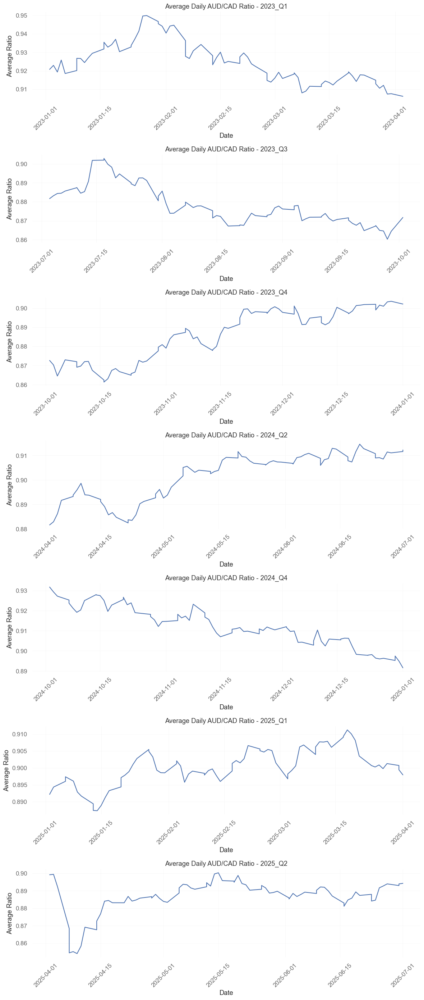

In [56]:
# Calculate the ratio for each quarter
ratio_results = []

# Initialize list to store all av_ratio data with quarter identification
all_av_ratios = []

for quarter in quarters:
    data2 = pd.read_parquet(f'data/data2_{quarter}.parquet')
    data2['datetime'] = pd.to_datetime(data2['datetime'])
    data2.set_index('datetime', inplace=True)
    
    data_r = np.log(data2 / data2.shift(1)) * 10000
    data_r.columns = ['r_' + col for col in data_r.columns]
    
    data_2_temp = pd.concat(
        [data2[['AUD', 'CAD']],
        data_r[['r_AUD', 'r_CAD']]],
        axis=1
    )
    
    # Compute the ratio SP / NQ
    ratio_temp = data_2_temp["AUD"] / data_2_temp["CAD"]
    
    # Compute daily averages
    av_ratio_temp = ratio_temp.resample("D").mean().dropna()
    
    # Store results
    ratio_results.append({
        'Quarter': quarter,
        'Mean_Ratio': av_ratio_temp.mean(),
        'Std_Ratio': av_ratio_temp.std(),
        'Min_Ratio': av_ratio_temp.min(),
        'Max_Ratio': av_ratio_temp.max()
    })
    
    # Store av_ratio with quarter identification
    av_ratio_quarter = av_ratio_temp.to_frame(name='av_ratio')
    av_ratio_quarter['quarter'] = quarter
    av_ratio_quarter.index = av_ratio_quarter.index + pd.to_timedelta(np.where(av_ratio_quarter.index.day_name() == "Friday", "3D", "1D")) + pd.Timedelta("0m")
    all_av_ratios.append(av_ratio_quarter)

# Combine all av_ratios into one DataFrame
all_av_ratios_df = pd.concat(all_av_ratios, axis=0)
print("\nAll Average Ratios by Quarter:")
print(all_av_ratios_df)

# Create summary dataframe
ratio_summary = pd.DataFrame(ratio_results)
print("\nSummary of AUD/CAD Ratio by Quarter:")
print(ratio_summary)

# Create charts for each quarter
fig, axes = plt.subplots(len(quarters), 1, figsize=(12, 4*len(quarters)))

for idx, quarter in enumerate(quarters):
    quarter_data = all_av_ratios_df[all_av_ratios_df['quarter'] == quarter]
    
    axes[idx].plot(quarter_data.index, quarter_data['av_ratio'].values)
    axes[idx].set_title(f"Average Daily AUD/CAD Ratio - {quarter}")
    axes[idx].set_xlabel("Date")
    axes[idx].set_ylabel("Average Ratio")
    axes[idx].grid(True, alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



All Ratios by Quarter:
                           sds_ratio  quarter
2023-01-02 00:00:00+00:00   1.600187  2023_Q1
2023-01-03 00:00:00+00:00   1.369730  2023_Q1
2023-01-04 00:00:00+00:00   1.604923  2023_Q1
2023-01-05 00:00:00+00:00   1.909956  2023_Q1
2023-01-06 00:00:00+00:00   1.780657  2023_Q1
...                              ...      ...
2025-06-26 00:00:00+00:00   1.725881  2025_Q2
2025-06-27 00:00:00+00:00   1.705657  2025_Q2
2025-06-30 00:00:00+00:00   1.099295  2025_Q2
2025-06-30 00:00:00+00:00   1.080260  2025_Q2
2025-07-01 00:00:00+00:00   1.441540  2025_Q2

[546 rows x 2 columns]

Summary of AUD/CAD Ratio by Quarter:
    Quarter  Mean_Ratio  Std_Ratio  Min_Ratio  Max_Ratio
0   2023_Q1    0.924491   0.010931   0.906142   0.949919
1   2023_Q3    0.877987   0.010043   0.860269   0.902916
2   2023_Q4    0.885974   0.013264   0.861347   0.903625
3   2024_Q2    0.901688   0.009479   0.881586   0.914610
4   2024_Q4    0.912403   0.009699   0.891570   0.931721
5   2025_Q1    0.900

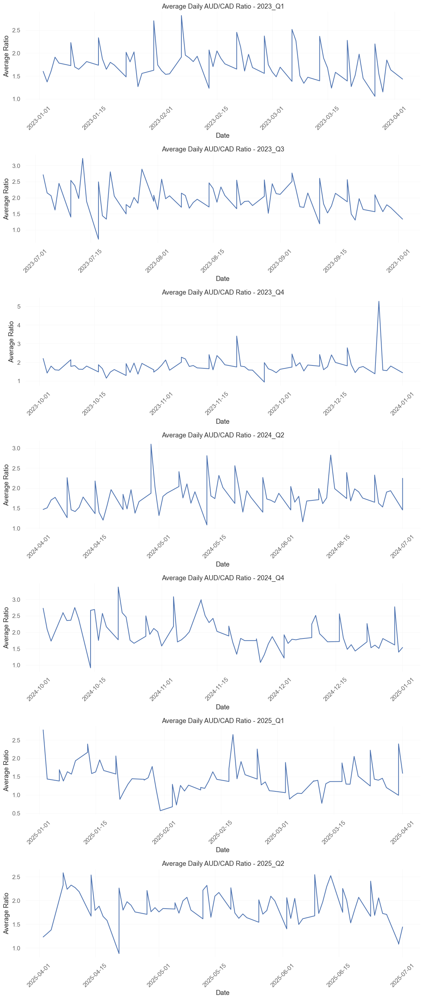

In [57]:
# Calculate the ratio for each quarter
ratio_sds_results = []

# Initialize list to store all av_ratio data with quarter identification
all_sds_ratios = []

for quarter in quarters:
    data2 = pd.read_parquet(f'data/data2_{quarter}.parquet')
    data2['datetime'] = pd.to_datetime(data2['datetime'])
    data2.set_index('datetime', inplace=True)
    
    data_r = np.log(data2 / data2.shift(1)) * 10000
    data_r.columns = ['r_' + col for col in data_r.columns]
    
    data_2_temp = pd.concat(
        [data2[['AUD', 'CAD']],
        data_r[['r_AUD', 'r_CAD']]],
        axis=1
    )
    
    # Compute the ratio SP / NQ
    ratio_temp = data_2_temp.resample("D").apply(lambda x: x['r_AUD'].std() / x['r_CAD'].std())
    
    # Compute daily averages
    sds_ratio_temp = ratio_temp.dropna()
    
    # Store results
    ratio_results.append({
        'Quarter': quarter,
        'Mean_Ratio': sds_ratio_temp.mean(),
        'Std_Ratio': sds_ratio_temp.std(),
        'Min_Ratio': sds_ratio_temp.min(),
        'Max_Ratio': sds_ratio_temp.max()
    })
    
    # Store av_ratio with quarter identification
    sds_ratio_quarter = sds_ratio_temp.to_frame(name='sds_ratio')
    sds_ratio_quarter['quarter'] = quarter
    sds_ratio_quarter.index = sds_ratio_quarter.index + pd.to_timedelta(np.where(sds_ratio_quarter.index.day_name() == "Friday", "3D", "1D")) + pd.Timedelta("0m")
    all_sds_ratios.append(sds_ratio_quarter)

# Combine all av_ratios into one DataFrame
all_sds_ratios_df = pd.concat(all_sds_ratios, axis=0)
print("\nAll Ratios by Quarter:")
print(all_sds_ratios_df)

# Create summary dataframe
ratio_summary = pd.DataFrame(ratio_results)
print("\nSummary of AUD/CAD Ratio by Quarter:")
print(ratio_summary)

# Create charts for each quarter
fig, axes = plt.subplots(len(quarters), 1, figsize=(12, 4*len(quarters)))

for idx, quarter in enumerate(quarters):
    quarter_data = all_sds_ratios_df[all_sds_ratios_df['quarter'] == quarter]
    
    axes[idx].plot(quarter_data.index, quarter_data['sds_ratio'].values)
    axes[idx].set_title(f"Average Daily AUD/CAD Ratio - {quarter}")
    axes[idx].set_xlabel("Date")
    axes[idx].set_ylabel("Average Ratio")
    axes[idx].grid(True, alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()



In [58]:
all_data_2 = all_data.copy()
all_data_2 = all_data_2.merge(all_sds_ratios_df[['sds_ratio']], left_index=True, right_index=True, how='left')
all_data_2 = all_data_2.merge(all_av_ratios_df[['av_ratio']], left_index=True, right_index=True, how='left')

In [59]:
all_data_2[['av_ratio', 'sds_ratio']] = all_data_2[['av_ratio', 'sds_ratio']].ffill()
all_data_2.between_time("9:31", "9:45").head(40)

,AUD,CAD,XAU,XAG,r_AUD,r_CAD,r_XAU,r_XAG,quarter,sds_ratio,av_ratio
2023-01-02 09:35:00+00:00,0.68121,0.736708,NaN,NaN,-0.146797,-0.294688,NaN,NaN,2023_Q1,1.600187,0.920738
2023-01-02 09:40:00+00:00,0.68118,0.736708,NaN,NaN,-0.440403,0.000000,NaN,NaN,2023_Q1,1.600187,0.920738
2023-01-02 09:45:00+00:00,0.68122,0.736686,NaN,NaN,0.587199,-0.294679,NaN,NaN,2023_Q1,1.600187,0.920738
2023-01-03 09:35:00+00:00,0.67442,0.732526,1844.555,24.450,13.502187,14.639791,18.992791,24.160041,2023_Q1,1.369730,0.922917
2023-01-03 09:40:00+00:00,0.67511,0.733568,1846.755,24.436,10.225783,14.221104,11.919889,-5.727611,2023_Q1,1.369730,0.922917
2023-01-03 09:45:00+00:00,0.67618,0.734614,1847.578,24.437,15.836722,14.241357,4.455473,0.409224,2023_Q1,1.369730,0.922917
2023-01-04 09:35:00+00:00,0.68733,0.738411,1857.435,24.191,-6.690325,-10.195262,-2.368578,-7.851078,2023_Q1,1.604923,0.919307
2023-01-04 09:40:00+00:00,0.68766,0.739115,1858.655,24.282,4.800035,9.530037,6.566041,37.546720,2023_Q1,1.604923,0.919307
2023-01-04 09:45:00+00:00,0.68715,0.739158,1858.525,24.272,-7.419207,0.591309,-0.699455,-4.119125,2023_Q1,1.604923,0.919307
2023-01-05 09:35:00+00:00,0.67722,0.738853,1837.348,23.335,0.442997,-1.551711,7.568115,-2.999336,2023_Q1,1.909956,0.925785


In [60]:
all_data_2['spread_avratio'] = all_data_2['AUD'] - all_data_2['CAD'] * all_data_2['av_ratio']
all_data_2['spread_sdsratio'] = all_data_2['r_AUD'] - all_data_2['r_CAD'] * all_data_2['sds_ratio']

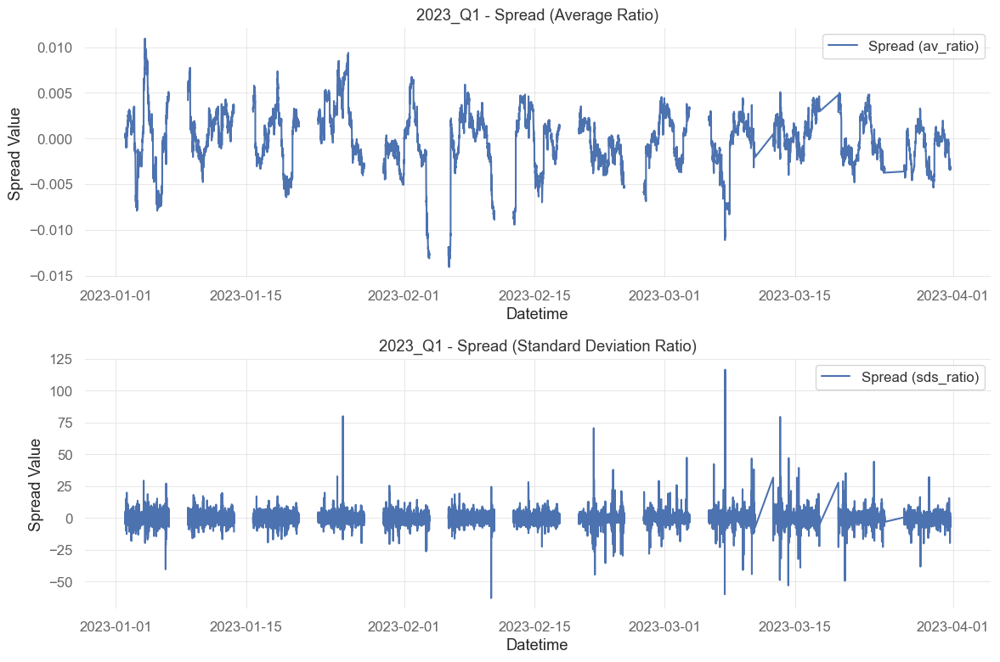

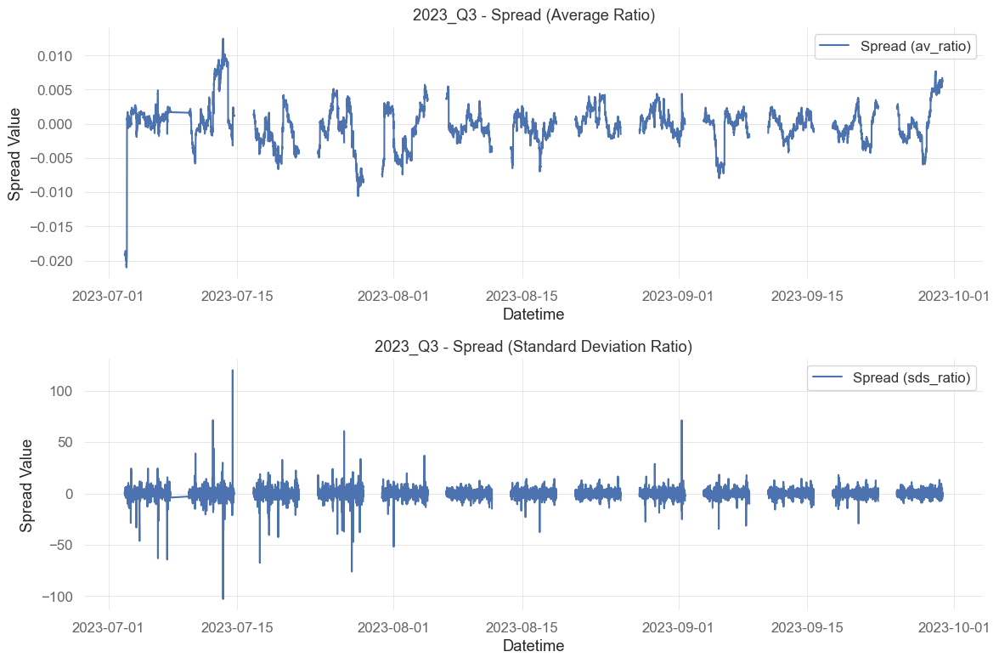

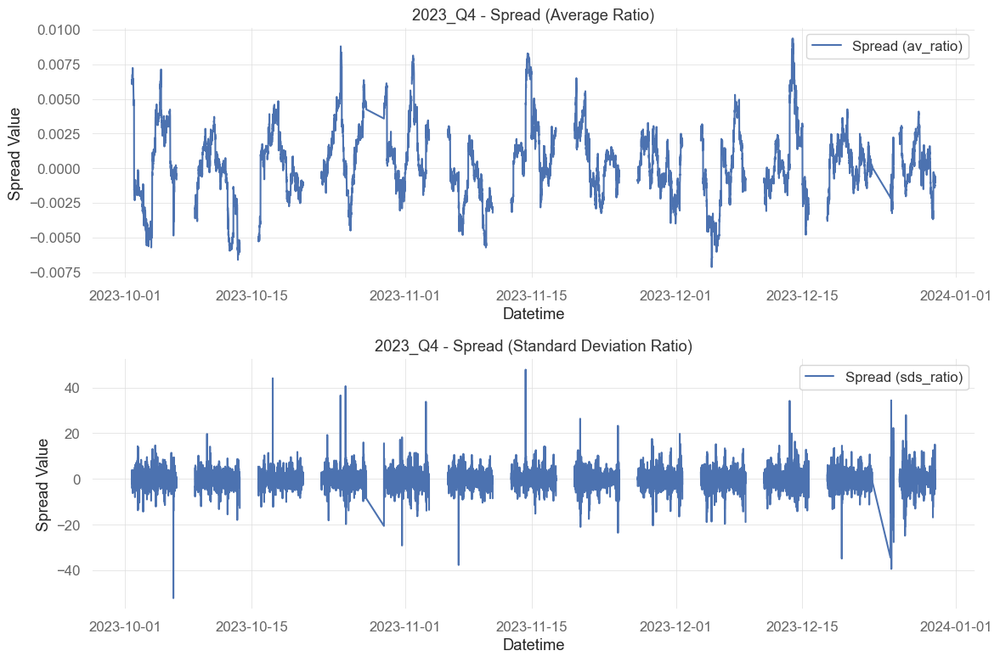

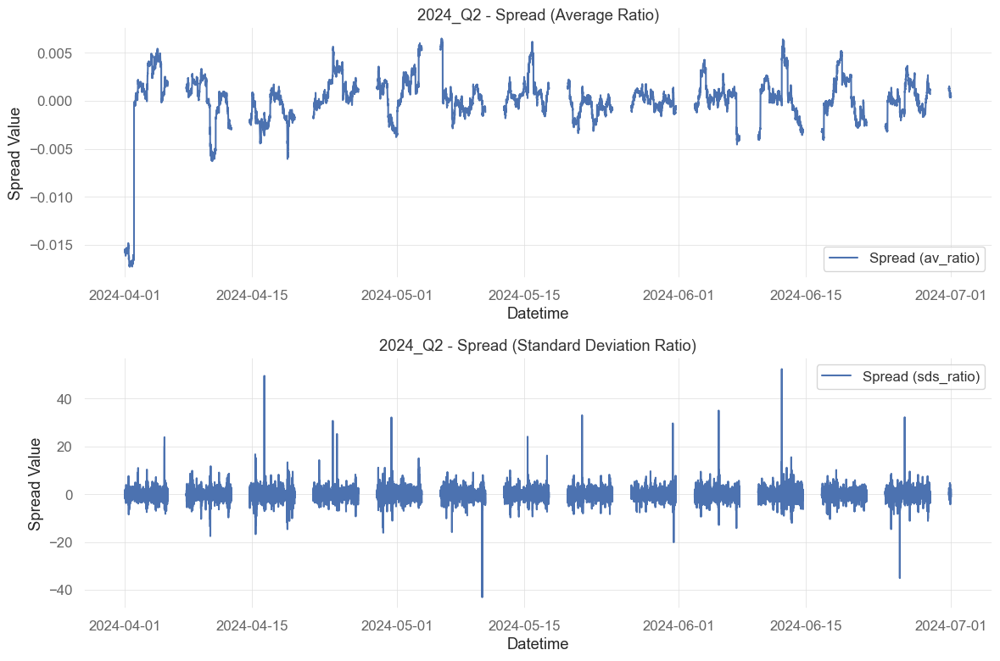

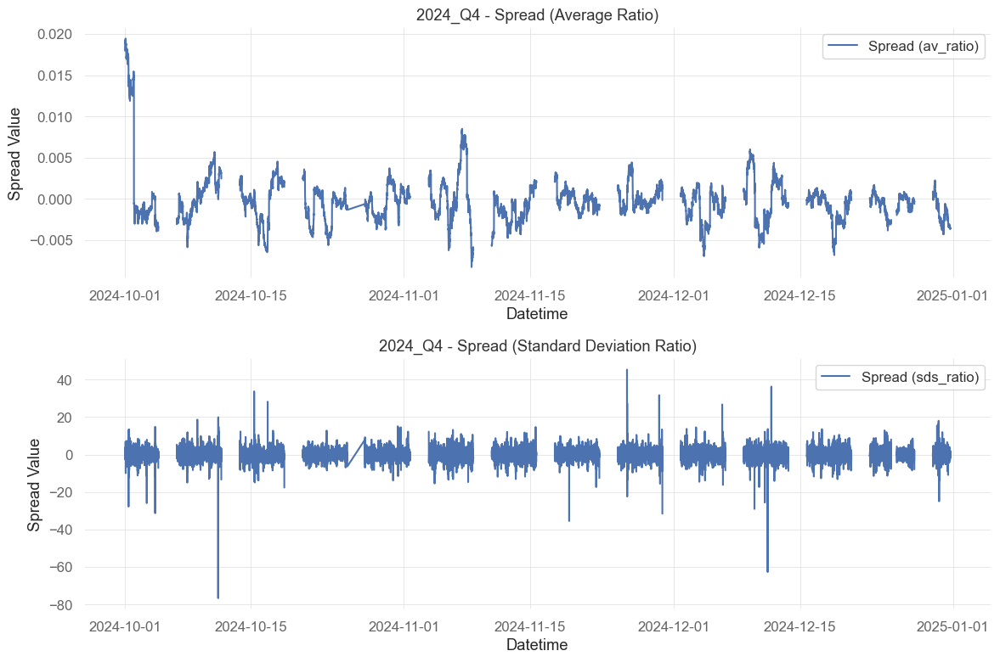

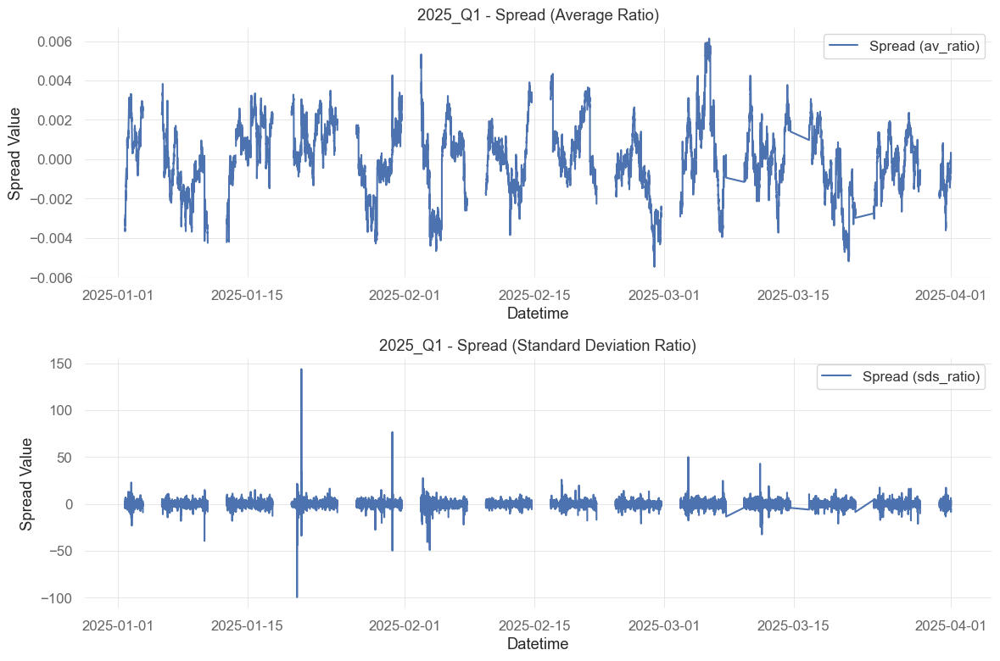

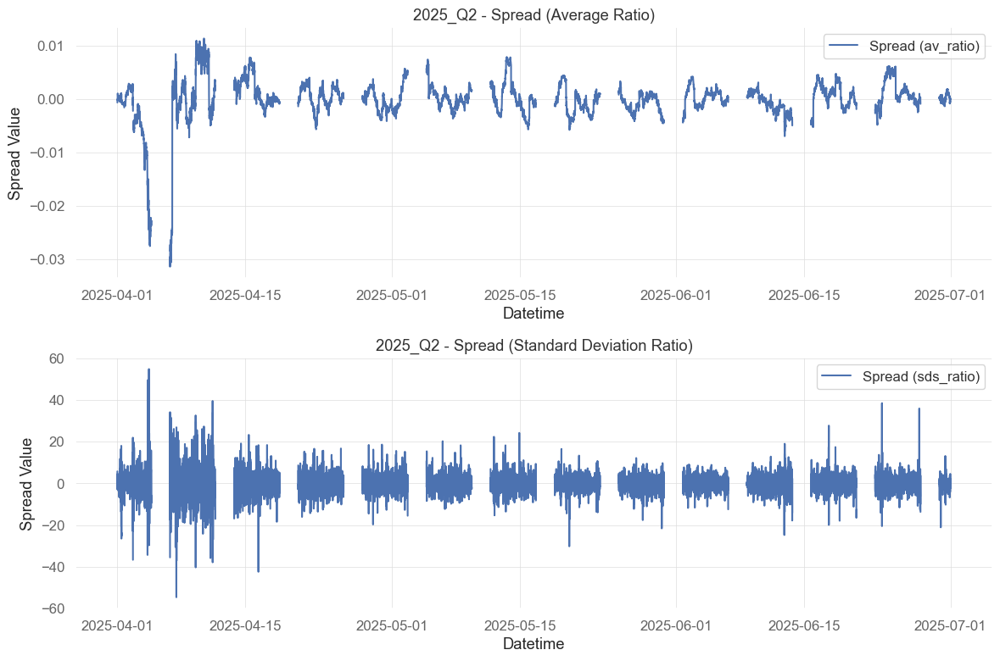

In [61]:
# Create separate charts for each quarter showing both spreads
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Create subplots for this quarter
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    
    # Plot spread based on average ratio
    axes[0].plot(quarter_data.index,
                 quarter_data["spread_avratio"],
                 label="Spread (av_ratio)")
    axes[0].set_title(f"{quarter} - Spread (Average Ratio)")
    axes[0].set_xlabel("Datetime")
    axes[0].set_ylabel("Spread Value")
    axes[0].legend()
    
    # Plot spread based on standard deviation ratio
    axes[1].plot(quarter_data.index,
                 quarter_data["spread_sdsratio"],
                 label="Spread (sds_ratio)")
    axes[1].set_title(f"{quarter} - Spread (Standard Deviation Ratio)")
    axes[1].set_xlabel("Datetime")
    axes[1].set_ylabel("Spread Value")
    axes[1].legend()
    
    plt.tight_layout()
    plt.show()

In [62]:
# we assume that spread mean reverts to 0

# lets apply the volatility breakout model

# first we need to calculate the standard deviation of the spreads
# let's use rolling window of 120 minutes (2 hours)

all_data_2["std_spread_avratio"] = all_data_2["spread_avratio"].rolling(window=120).std()
all_data_2["std_spread_sdsratio"] = all_data_2["spread_sdsratio"].rolling(window=120).std()

# lets put missings whenever KO price is missing
# (PEP price should be missing in the same moments)

all_data_2.loc[all_data_2["CAD"].isna(), ["std_spread_avratio", "std_spread_sdsratio"]] = np.nan

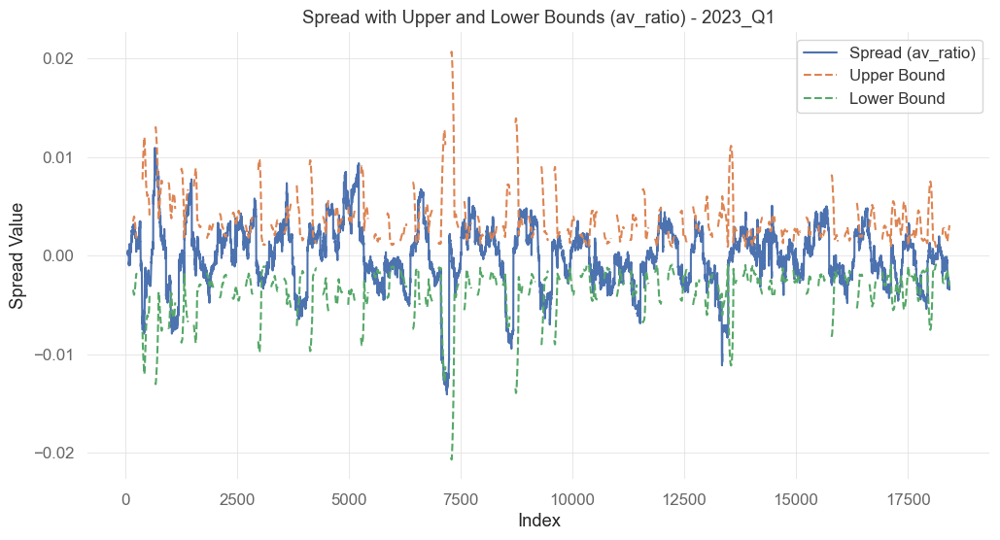

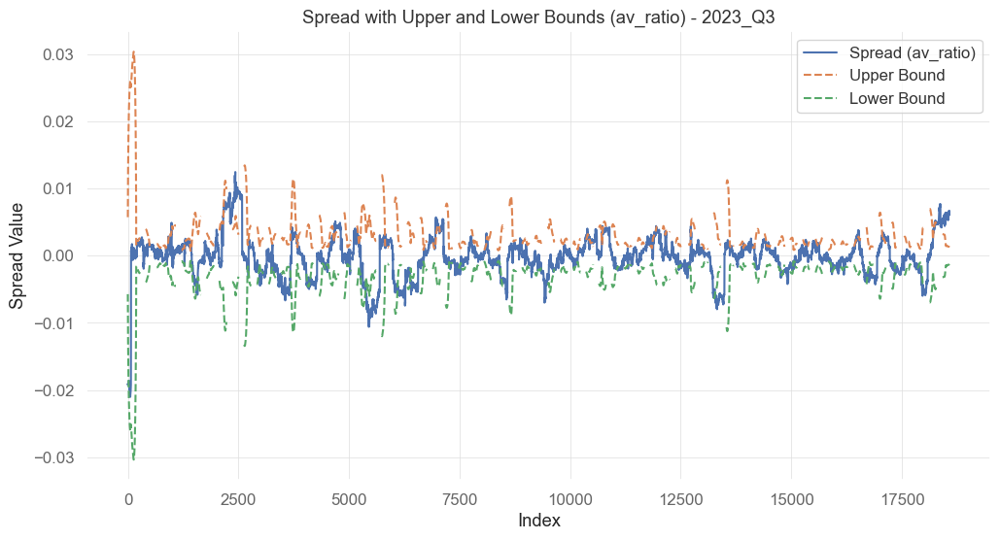

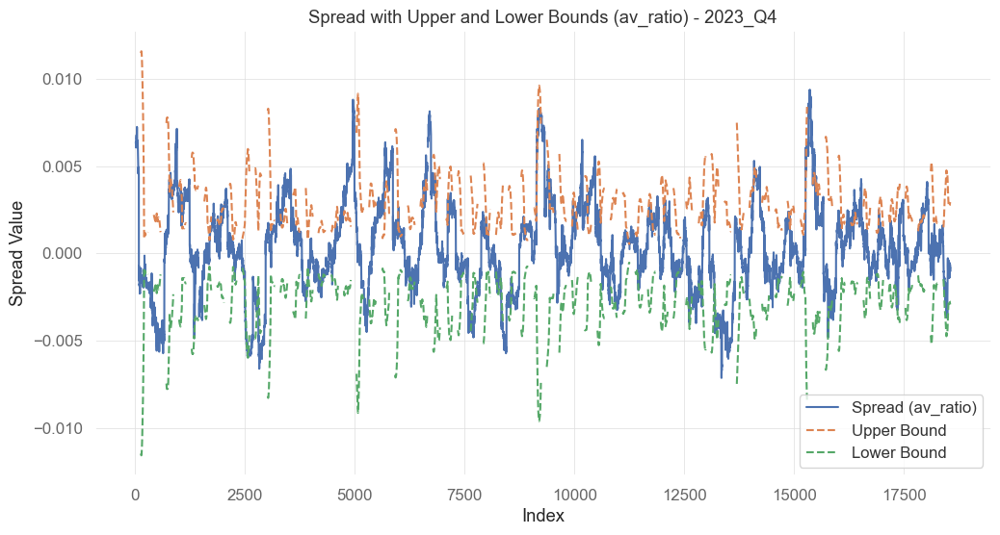

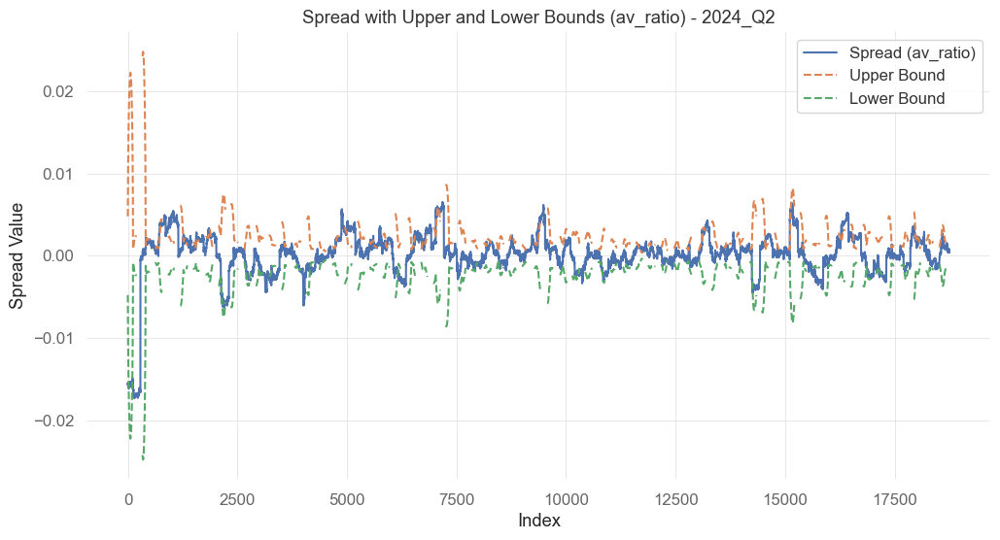

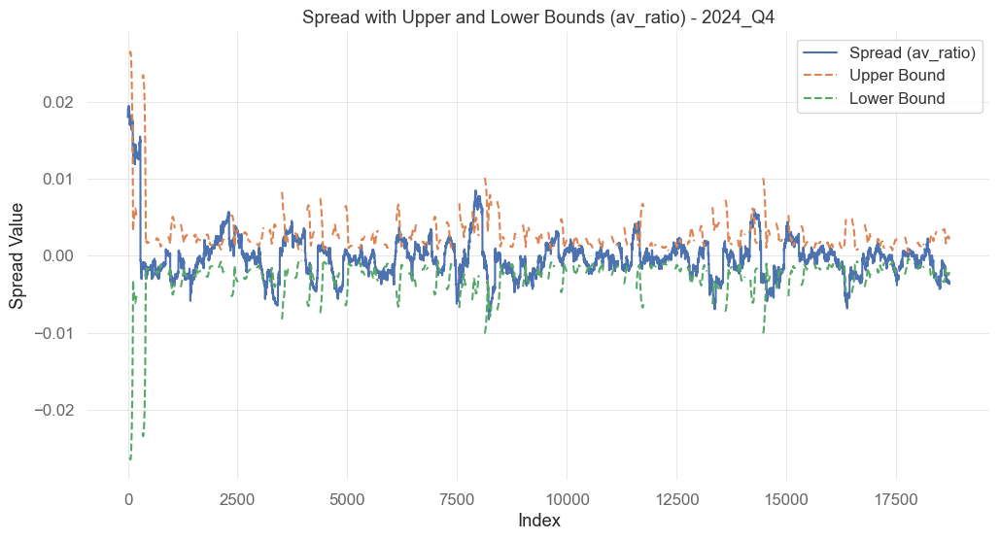

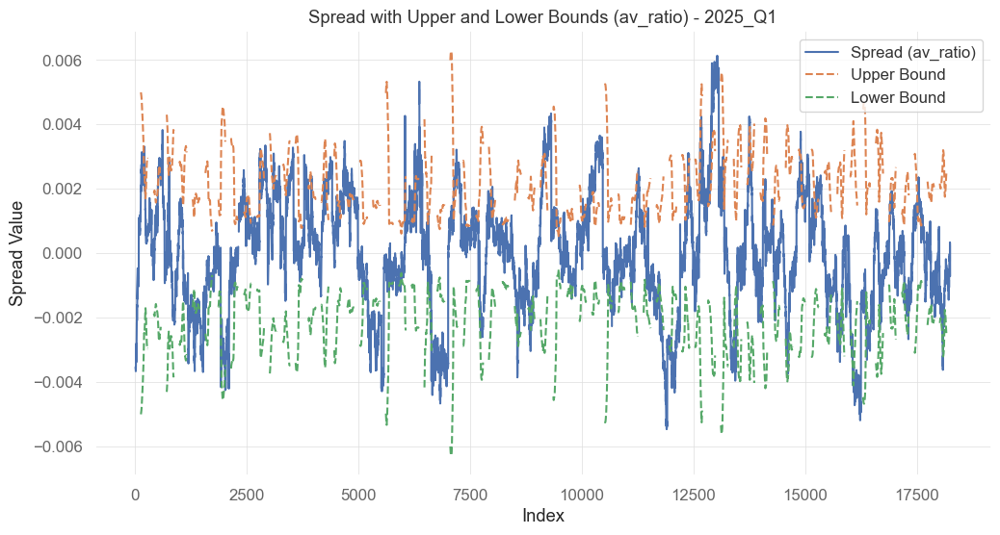

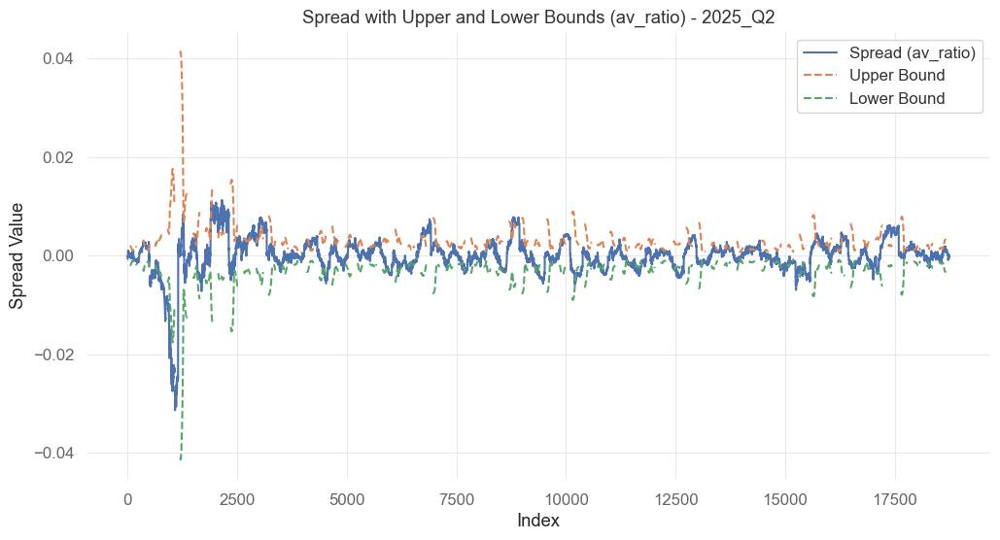

In [63]:
# applying a volatility breakout model
# sample upper and lower bounds for spreads
# for a volatility multiplier of 3
# (here we put the upper and lower band along zero)

all_data_2["upper_bound_avratio"] = 3 * all_data_2["std_spread_avratio"]
all_data_2["lower_bound_avratio"] = -3 * all_data_2["std_spread_avratio"]

# lets see how it looks like for each quarter separately
# Create separate charts for each quarter
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Reset index for plotting
    quarter_data_plot = quarter_data.reset_index()
    
    plt.figure(figsize=(12, 6))
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["spread_avratio"],
             label="Spread (av_ratio)")
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["upper_bound_avratio"],
             label="Upper Bound", linestyle='--')
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["lower_bound_avratio"],
             label="Lower Bound", linestyle='--')
    plt.title(f"Spread with Upper and Lower Bounds (av_ratio) - {quarter}")
    plt.xlabel("Index")
    plt.ylabel("Spread Value")
    plt.legend()
    plt.show()

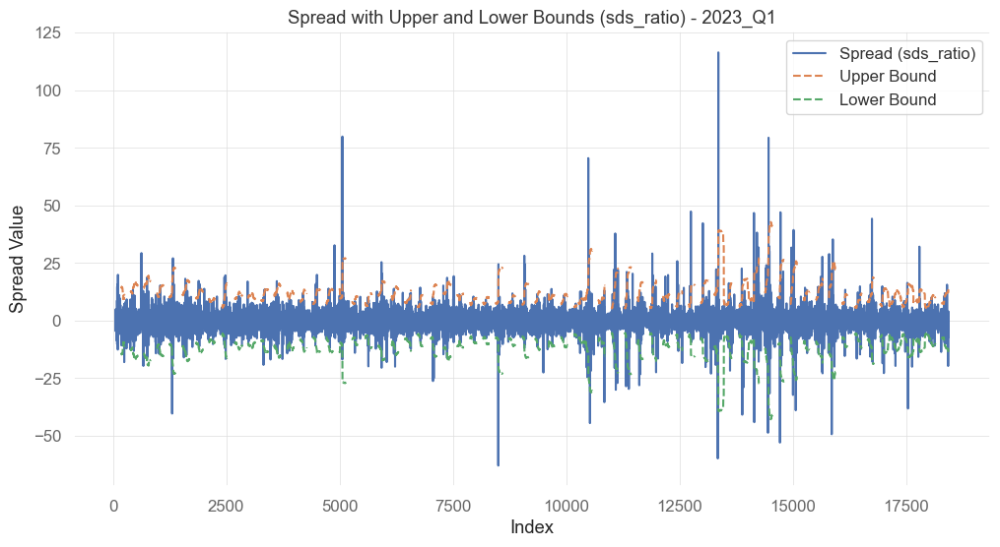

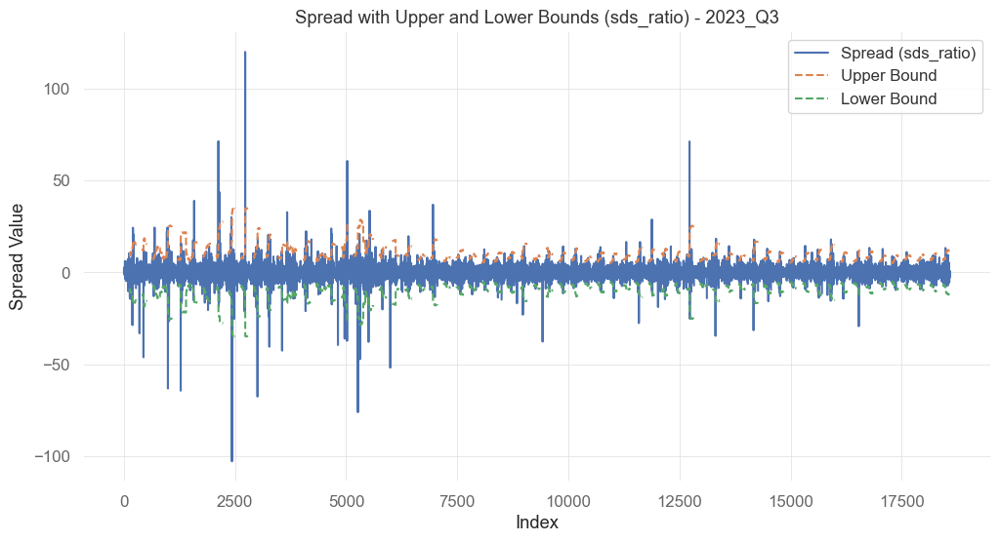

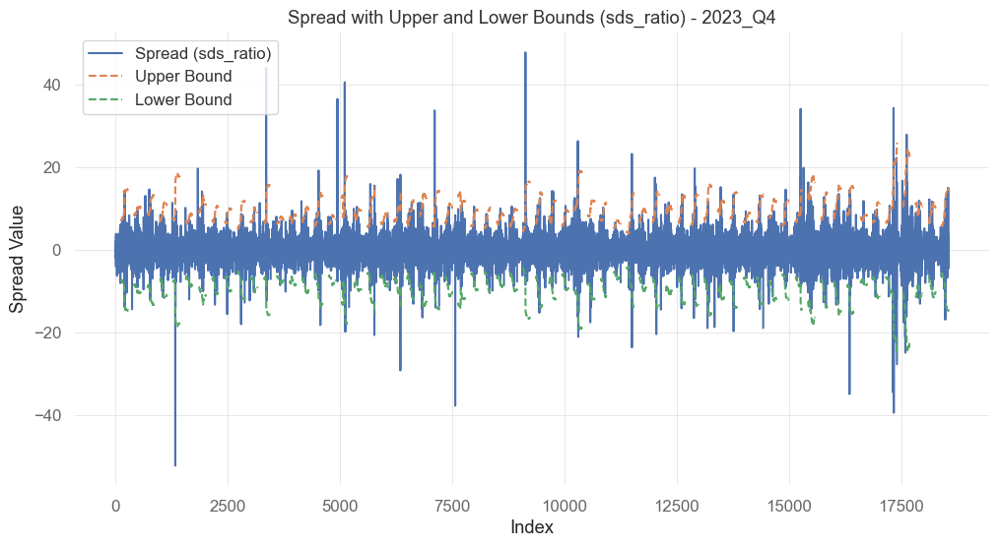

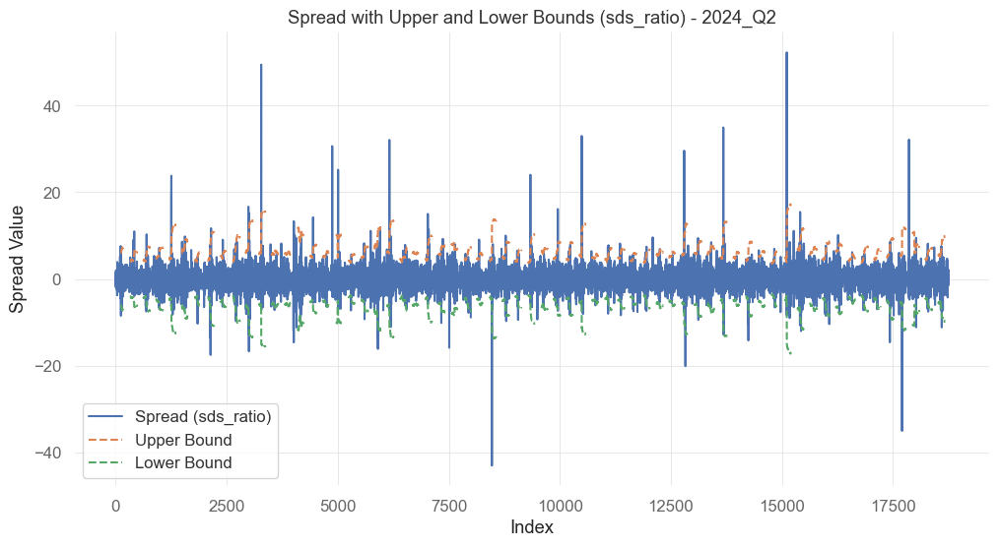

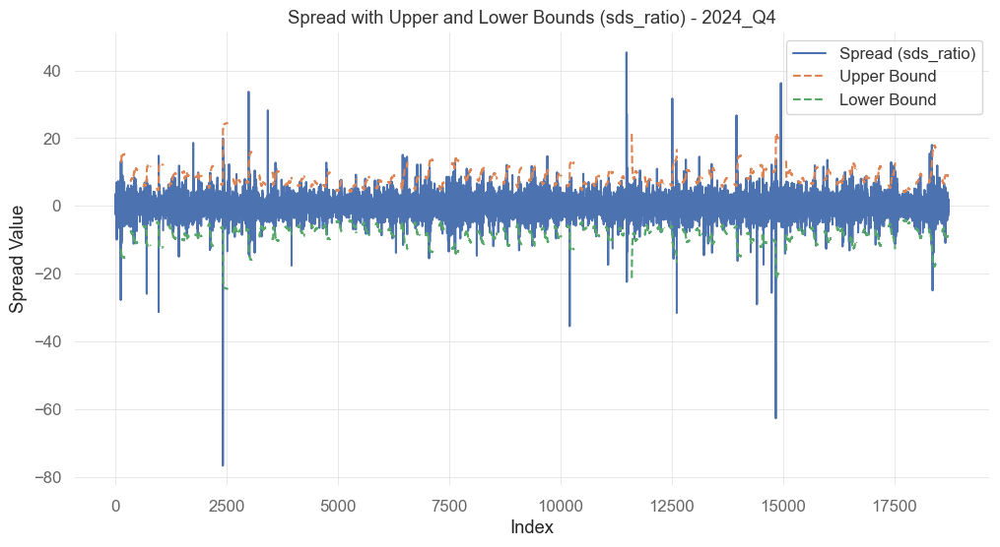

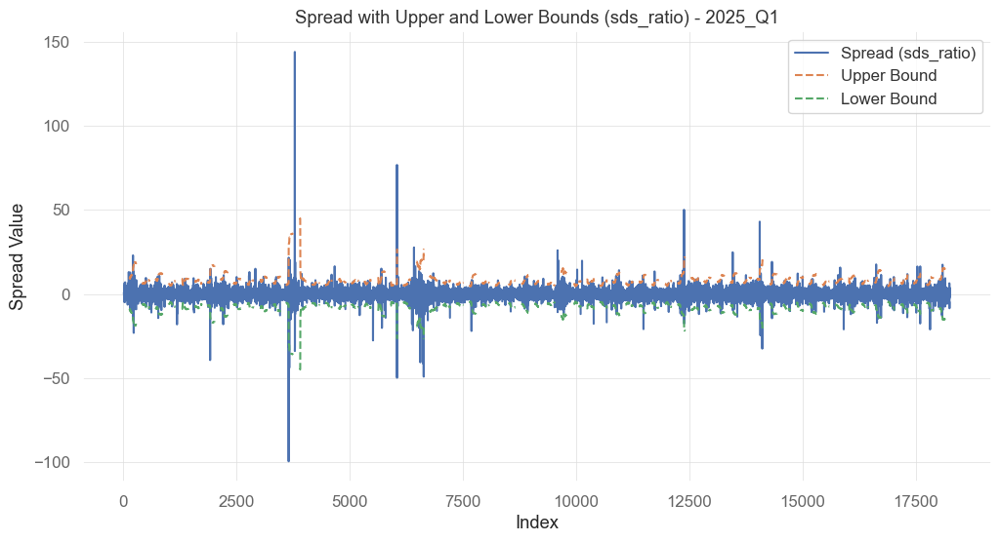

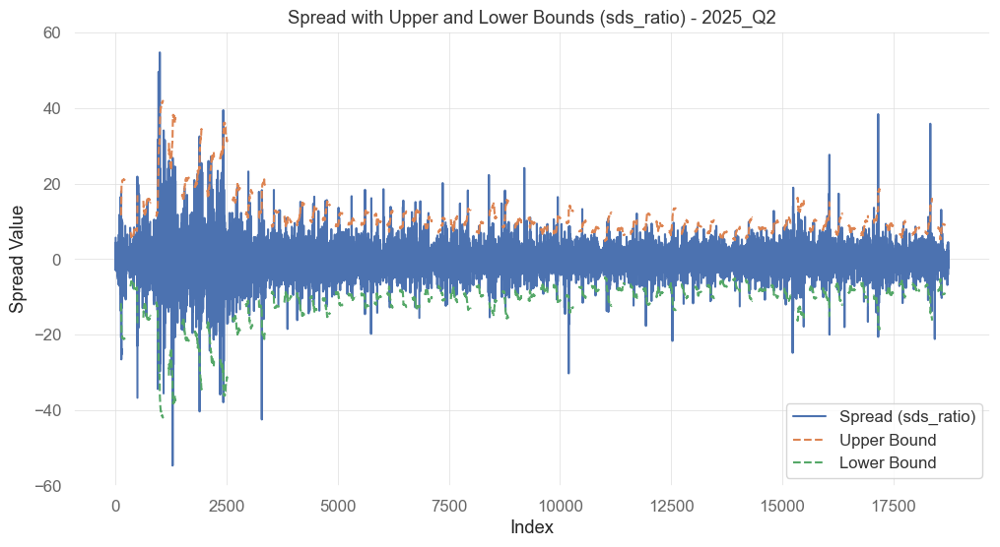

In [64]:
# applying a volatility breakout model
# sample upper and lower bounds for spreads
# for a volatility multiplier of 3
# (here we put the upper and lower band along zero)

all_data_2["upper_bound_sdsratio"] = 3 * all_data_2["std_spread_sdsratio"]
all_data_2["lower_bound_sdsratio"] = -3 * all_data_2["std_spread_sdsratio"]

# lets see how it looks like for each quarter separately
# Create separate charts for each quarter
for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Reset index for plotting
    quarter_data_plot = quarter_data.reset_index()
    
    plt.figure(figsize=(12, 6))
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["spread_sdsratio"],
             label="Spread (sds_ratio)")
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["upper_bound_sdsratio"],
             label="Upper Bound", linestyle='--')
    plt.plot(quarter_data_plot.index,
             quarter_data_plot["lower_bound_sdsratio"],
             label="Lower Bound", linestyle='--')
    plt.title(f"Spread with Upper and Lower Bounds (sds_ratio) - {quarter}")
    plt.xlabel("Index")
    plt.ylabel("Spread Value")
    plt.legend()
    plt.show()

In [65]:
### position will be based on relation of the spread to volatility bands

# lets assume we do not trade within the first 15-mins of the day
# and exit all positions 15 minutes before the end of quotations

# lets create a pos_flat vector and fill it with 0s

pos_flat = np.zeros(len(all_data_2))

In [66]:
breaks = (all_data_2.index.time >= pd.to_datetime("16:51").time()) & \
          (all_data_2.index.time <= pd.to_datetime("18:10").time())

pos_flat[breaks] = 1

### Two Intersecting Moving Averages
av_ratio

In [67]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over each quarter
for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2['quarter'] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    # Loop over different parameter combinations
    for fastEMA in fastEMA_parameters:
        for slowEMA in slowEMA_parameters:
                    
                    # ensure that fastEMA is less than slowEMA
                    if fastEMA >= slowEMA:
                        continue

                    print(f"  fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                    # We calculate the appropriate EMA
                    fastEMA_values = quarter_data['spread_avratio'].ewm(span = fastEMA).mean()
                    slowEMA_values = quarter_data['spread_avratio'].ewm(span = slowEMA).mean()

                    # Insert NaNs wherever the original price is missing
                    fastEMA_values[quarter_data['spread_avratio'].isna()] = np.nan
                    slowEMA_values[quarter_data['spread_avratio'].isna()] = np.nan 

                    # Calculate position for momentum strategy
                    cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                    
                    # let's add filters that check for the presence of NaN values
                    fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                    slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                    # Now we can add these conditions to our strategies
                    # if any of the values is missing,
                    # we cannot make a position decision

                    pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                       np.where(cond2b_mom_long, 1, -1),
                                       np.nan)
                    pos_mr = -pos_mom 

                    # Set position to 0 where pos_flat is 1
                    pos_flat_quarter = pos_flat[quarter_mask]
                    pos_mr[pos_flat_quarter == 1] = 0
                    
                    # Calculate gross pnl
                    pnl_gross_mr = pos_mr * (quarter_data['AUD'].diff() - quarter_data['CAD'].diff() * quarter_data['av_ratio'])
                    # point value for E6

                    # Calculate number of transactions
                    ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                    # Calculate net pnl
                    pnl_net_mr = pnl_gross_mr - ntrans * (10 + quarter_data['av_ratio']*10)   # cost $10 per transaction on E6
                      
                    # Aggregate to daily data
                    pnl_gross_mr = pd.Series(pnl_gross_mr)
                    pnl_gross_mr.index = quarter_data['spread_avratio'].index.time
                    pnl_gross_mr_d = pnl_gross_mr.groupby(quarter_data['spread_avratio'].index.date).sum()

                    pnl_net_mr = pd.Series(pnl_net_mr)
                    pnl_net_mr.index = quarter_data['spread_avratio'].index.time
                    pnl_net_mr_d = pnl_net_mr.groupby(quarter_data['spread_avratio'].index.date).sum()

                    ntrans = pd.Series(ntrans)
                    ntrans.index = quarter_data['spread_avratio'].index.time
                    ntrans_d = ntrans.groupby(quarter_data['spread_avratio'].index.date).sum()

                    # Calculate Sharpe Ratio and PnL
                    gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                    net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                    gross_PnL_mr = pnl_gross_mr_d.sum()
                    net_PnL_mr = pnl_net_mr_d.sum()

                    av_daily_ntrans = ntrans_d.mean()

                    # Collect necessary results into one object
                    summary = pd.DataFrame({
                        'fastEMA': fastEMA,
                        'slowEMA': slowEMA,
                        'quarter': quarter,
                        'gross_SR_mr': gross_SR_mr,
                        'net_SR_mr': net_SR_mr,
                        'gross_PnL_mr': gross_PnL_mr,
                        'net_PnL_mr': net_PnL_mr,
                        'av_daily_ntrans': av_daily_ntrans
                    }, index=[0])

                    # Append results to the summary
                    summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)


Processing quarter: 2023_Q1
  fastEMA = 15, slowEMA = 90
  fastEMA = 15, slowEMA = 120
  fastEMA = 15, slowEMA = 150
  fastEMA = 15, slowEMA = 180
  fastEMA = 15, slowEMA = 240
  fastEMA = 15, slowEMA = 300
  fastEMA = 15, slowEMA = 360
  fastEMA = 15, slowEMA = 420
  fastEMA = 20, slowEMA = 90
  fastEMA = 20, slowEMA = 120
  fastEMA = 20, slowEMA = 150
  fastEMA = 20, slowEMA = 180
  fastEMA = 20, slowEMA = 240
  fastEMA = 20, slowEMA = 300
  fastEMA = 20, slowEMA = 360
  fastEMA = 20, slowEMA = 420
  fastEMA = 30, slowEMA = 90
  fastEMA = 30, slowEMA = 120
  fastEMA = 30, slowEMA = 150
  fastEMA = 30, slowEMA = 180
  fastEMA = 30, slowEMA = 240
  fastEMA = 30, slowEMA = 300
  fastEMA = 30, slowEMA = 360
  fastEMA = 30, slowEMA = 420
  fastEMA = 45, slowEMA = 90
  fastEMA = 45, slowEMA = 120
  fastEMA = 45, slowEMA = 150
  fastEMA = 45, slowEMA = 180
  fastEMA = 45, slowEMA = 240
  fastEMA = 45, slowEMA = 300
  fastEMA = 45, slowEMA = 360
  fastEMA = 45, slowEMA = 420
  fastEMA = 60,

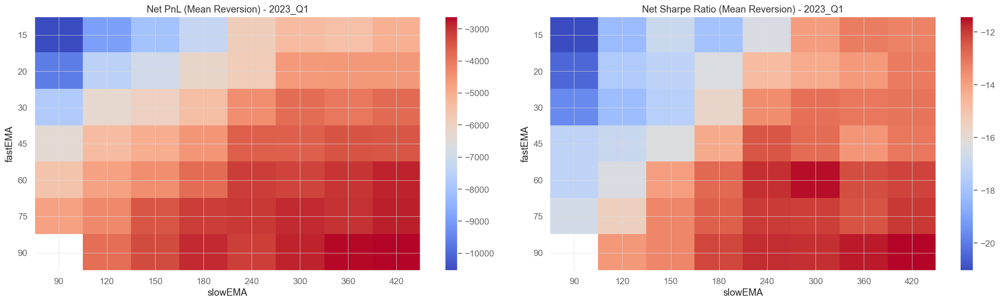

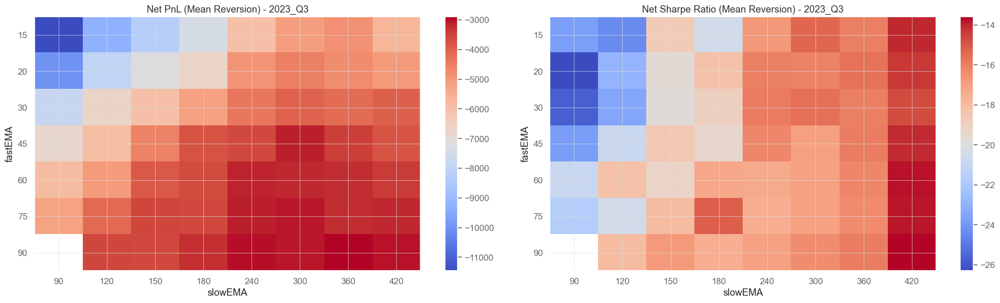

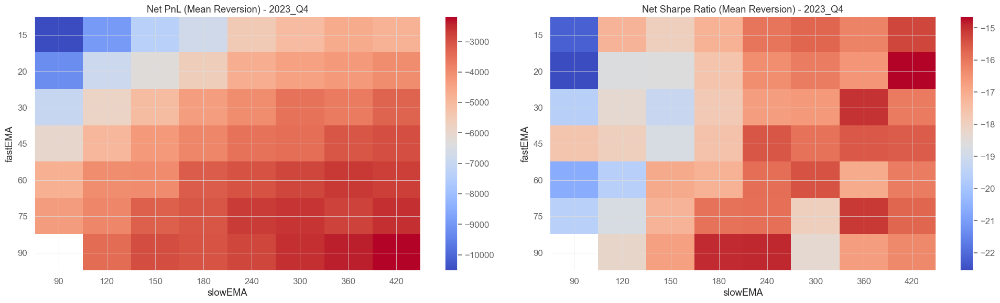

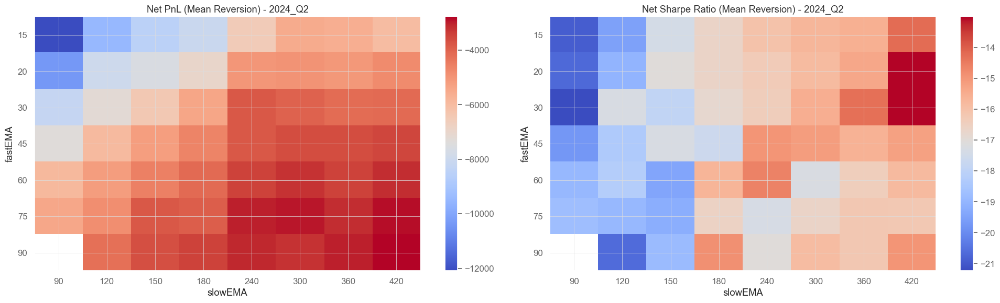

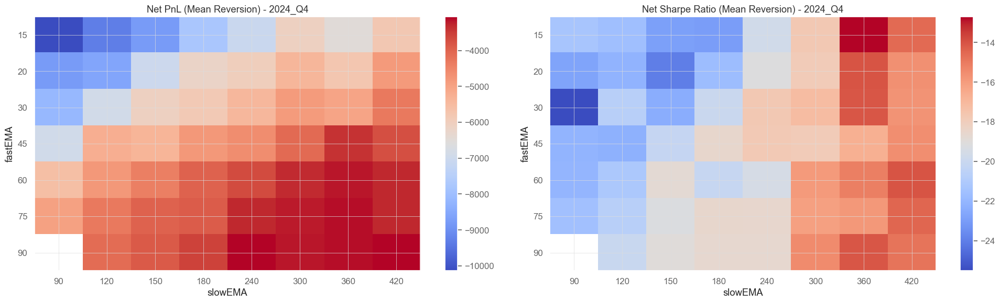

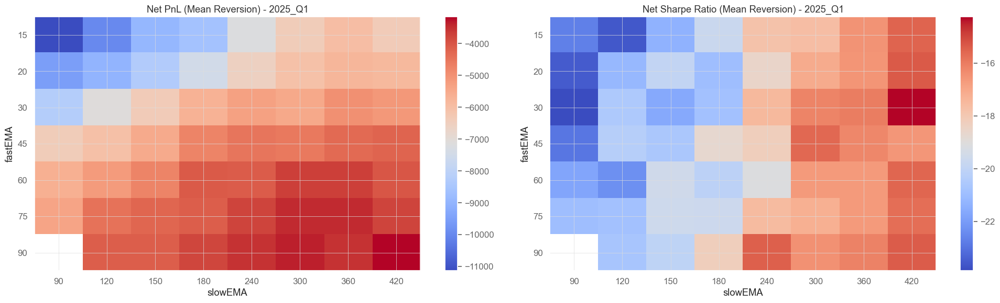

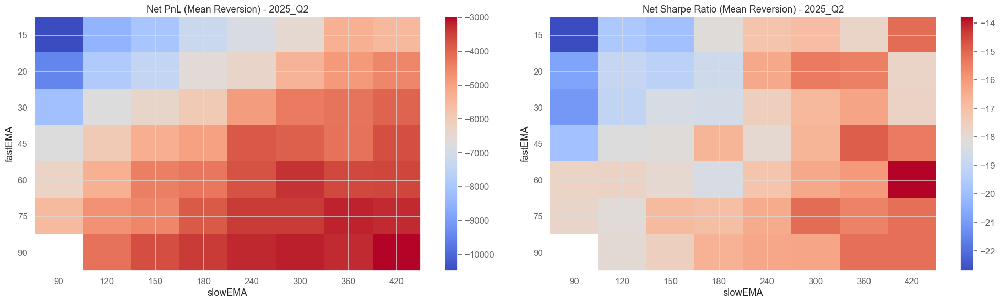

In [68]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_2MAs[summary_all_2MAs['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_PnL_mr')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('slowEMA')
    axes[0].set_ylabel('fastEMA')
    axes[0].set_title(f'Net PnL (Mean Reversion) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_SR_mr')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[1].set_xlabel('slowEMA')
    axes[1].set_ylabel('fastEMA')
    axes[1].set_title(f'Net Sharpe Ratio (Mean Reversion) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

sds_ratio

In [69]:
# we check various parameter combinations in a loop

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

fastEMA_parameters = [15, 20, 30, 45, 60, 75, 90]
slowEMA_parameters = [90, 120, 150, 180, 240, 300, 360, 420]

# create a dataframe to store results
summary_all_2MAs = pd.DataFrame()

# Loop over each quarter
for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2['quarter'] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    # Loop over different parameter combinations
    for fastEMA in fastEMA_parameters:
        for slowEMA in slowEMA_parameters:
                    
                    # ensure that fastEMA is less than slowEMA
                    if fastEMA >= slowEMA:
                        continue

                    print(f"  fastEMA = {fastEMA}, slowEMA = {slowEMA}")

                    # We calculate the appropriate EMA
                    fastEMA_values = quarter_data['spread_sdsratio'].ewm(span = fastEMA).mean()
                    slowEMA_values = quarter_data['spread_sdsratio'].ewm(span = slowEMA).mean()

                    # Insert NaNs wherever the original price is missing
                    fastEMA_values[quarter_data['spread_sdsratio'].isna()] = np.nan
                    slowEMA_values[quarter_data['spread_sdsratio'].isna()] = np.nan 

                    # Calculate position for momentum strategy
                    cond2b_mom_long = fastEMA_values.shift(1) > slowEMA_values.shift(1)
                    
                    # let's add filters that check for the presence of NaN values
                    fastEMA_nonmiss = fastEMA_values.shift(1).notna()
                    slowEMA_nonmiss = slowEMA_values.shift(1).notna()

                    # Now we can add these conditions to our strategies
                    # if any of the values is missing,
                    # we cannot make a position decision

                    pos_mom = np.where(fastEMA_nonmiss & slowEMA_nonmiss,
                                       np.where(cond2b_mom_long, 1, -1),
                                       np.nan)
                    pos_mr = -pos_mom 

                    # Set position to 0 where pos_flat is 1
                    pos_flat_quarter = pos_flat[quarter_mask]
                    pos_mr[pos_flat_quarter == 1] = 0
                    
                    # Calculate gross pnl
                    pnl_gross_mr = pos_mr * (quarter_data['AUD'].diff() - quarter_data['CAD'].diff() * quarter_data['sds_ratio'])
                    # point value for E6

                    # Calculate number of transactions
                    ntrans = np.abs(np.diff(pos_mom, prepend = 0))

                    # Calculate net pnl
                    pnl_net_mr = pnl_gross_mr - ntrans * (10 + quarter_data['sds_ratio']*10)   # cost $10 per transaction on E6
                      
                    # Aggregate to daily data
                    pnl_gross_mr = pd.Series(pnl_gross_mr)
                    pnl_gross_mr.index = quarter_data['spread_sdsratio'].index.time
                    pnl_gross_mr_d = pnl_gross_mr.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    pnl_net_mr = pd.Series(pnl_net_mr)
                    pnl_net_mr.index = quarter_data['spread_sdsratio'].index.time
                    pnl_net_mr_d = pnl_net_mr.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    ntrans = pd.Series(ntrans)
                    ntrans.index = quarter_data['spread_sdsratio'].index.time
                    ntrans_d = ntrans.groupby(quarter_data['spread_sdsratio'].index.date).sum()

                    # Calculate Sharpe Ratio and PnL
                    gross_SR_mr = mySR(pnl_gross_mr_d, scale=252)
                    net_SR_mr = mySR(pnl_net_mr_d, scale=252)
                    gross_PnL_mr = pnl_gross_mr_d.sum()
                    net_PnL_mr = pnl_net_mr_d.sum()

                    av_daily_ntrans = ntrans_d.mean()

                    # Collect necessary results into one object
                    summary = pd.DataFrame({
                        'fastEMA': fastEMA,
                        'slowEMA': slowEMA,
                        'quarter': quarter,
                        'gross_SR_mr': gross_SR_mr,
                        'net_SR_mr': net_SR_mr,
                        'gross_PnL_mr': gross_PnL_mr,
                        'net_PnL_mr': net_PnL_mr,
                        'av_daily_ntrans': av_daily_ntrans
                    }, index=[0])

                    # Append results to the summary
                    summary_all_2MAs = pd.concat([summary_all_2MAs, summary], ignore_index=True)


Processing quarter: 2023_Q1
  fastEMA = 15, slowEMA = 90
  fastEMA = 15, slowEMA = 120
  fastEMA = 15, slowEMA = 150
  fastEMA = 15, slowEMA = 180
  fastEMA = 15, slowEMA = 240
  fastEMA = 15, slowEMA = 300
  fastEMA = 15, slowEMA = 360
  fastEMA = 15, slowEMA = 420
  fastEMA = 20, slowEMA = 90
  fastEMA = 20, slowEMA = 120
  fastEMA = 20, slowEMA = 150
  fastEMA = 20, slowEMA = 180
  fastEMA = 20, slowEMA = 240
  fastEMA = 20, slowEMA = 300
  fastEMA = 20, slowEMA = 360
  fastEMA = 20, slowEMA = 420
  fastEMA = 30, slowEMA = 90
  fastEMA = 30, slowEMA = 120
  fastEMA = 30, slowEMA = 150
  fastEMA = 30, slowEMA = 180
  fastEMA = 30, slowEMA = 240
  fastEMA = 30, slowEMA = 300
  fastEMA = 30, slowEMA = 360
  fastEMA = 30, slowEMA = 420
  fastEMA = 45, slowEMA = 90
  fastEMA = 45, slowEMA = 120
  fastEMA = 45, slowEMA = 150
  fastEMA = 45, slowEMA = 180
  fastEMA = 45, slowEMA = 240
  fastEMA = 45, slowEMA = 300
  fastEMA = 45, slowEMA = 360
  fastEMA = 45, slowEMA = 420
  fastEMA = 60,

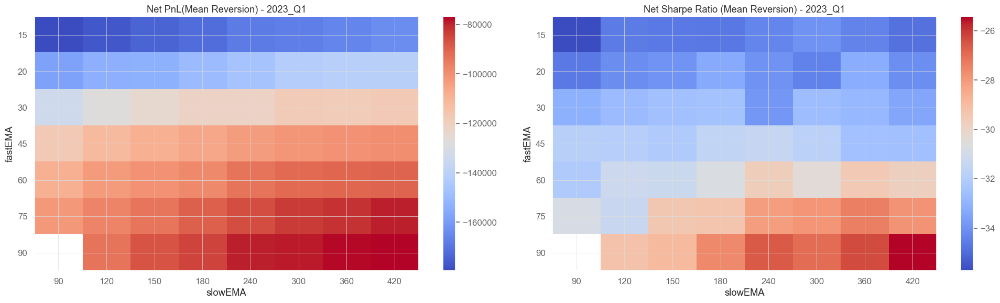

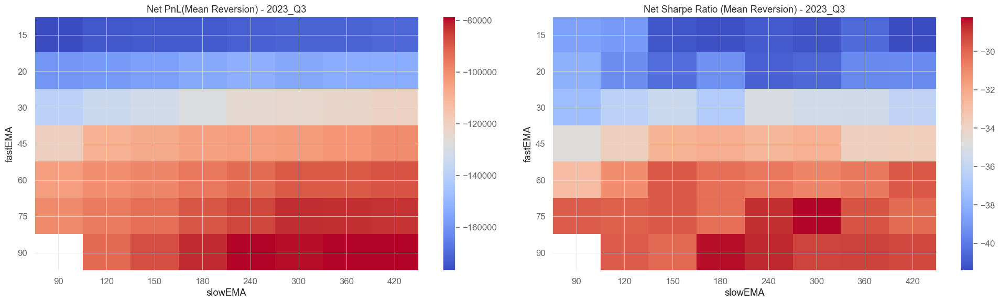

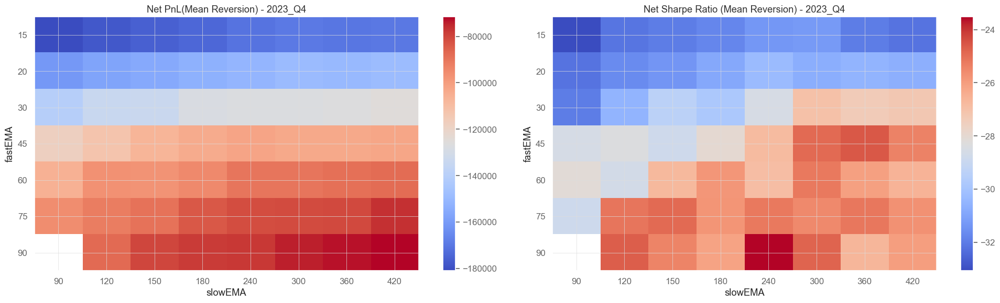

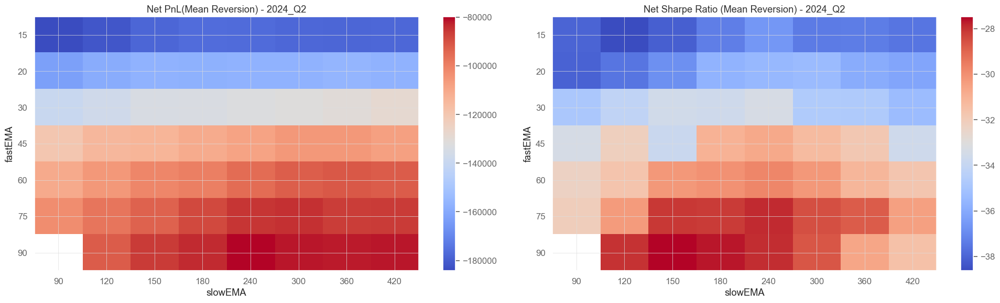

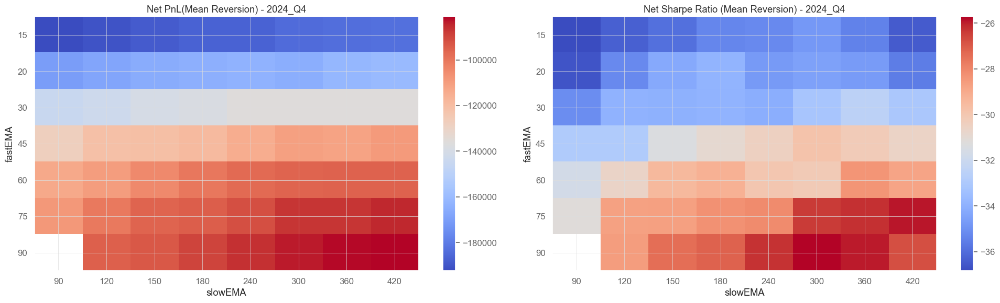

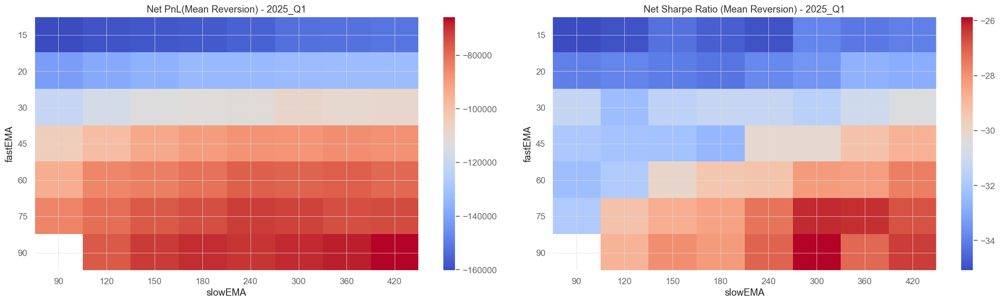

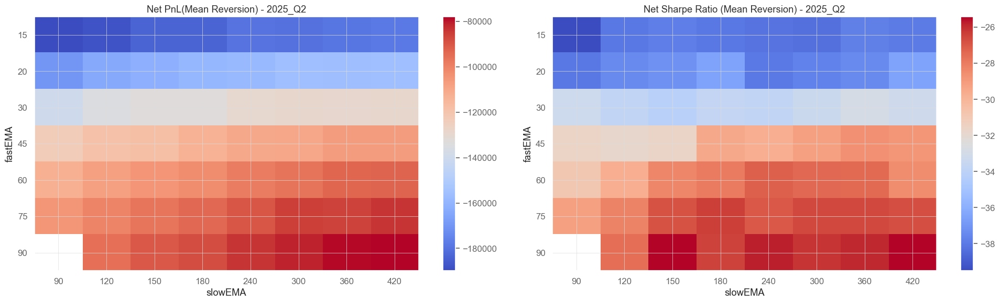

In [70]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_2MAs[summary_all_2MAs['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_PnL_mr')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('slowEMA')
    axes[0].set_ylabel('fastEMA')
    axes[0].set_title(f'Net PnL(Mean Reversion) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='fastEMA', columns='slowEMA', values='net_SR_mr')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[1].set_xlabel('slowEMA')
    axes[1].set_ylabel('fastEMA')
    axes[1].set_title(f'Net Sharpe Ratio (Mean Reversion) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

### Volatility Breakout Strategy

In [71]:
from functions.position_VB import positionVB

In [72]:
# lets do a comparison within a loop for spread_avratio and spread_sdsratio

def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

volat_sd_parameters = [60, 90, 120, 150, 180]
m_parameters = [0.5, 1, 1.5, 2, 2.5, 3, 3.5]

# create a dataframe to store results
summary_all_volatility = pd.DataFrame()

# Loop through each quarter
for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_mask = all_data_2["quarter"] == quarter
    quarter_data = all_data_2[quarter_mask].copy()
    
    for volat_sd in volat_sd_parameters:
        for m in m_parameters:
            print(f"  volat_sd: {volat_sd}, m: {m}")

            # calculate the elements of the strategy
            XAU = quarter_data["AUD"]
            XAG = quarter_data["CAD"]

            # spread based on average ratio
            signal_avratio = XAU - (quarter_data["av_ratio"] * XAG)
            std_spread_avratio = signal_avratio.rolling(window=volat_sd).std()
            upper_bound_avratio = m * std_spread_avratio
            lower_bound_avratio = -m * std_spread_avratio
            # position
            pos_avratio = positionVB(signal = signal_avratio,
                                    lower = lower_bound_avratio,
                                    upper = upper_bound_avratio,
                                    pos_flat = pos_flat[quarter_mask],
                                    strategy = "mr")
            # number of transactions
            n_trans_avratio = np.abs(np.diff(pos_avratio, prepend = 0))
            # convert to pd.Series and set the index
            n_trans_avratio = pd.Series(n_trans_avratio, index=quarter_data.index)

            # gross and net PnL
            pnl_gross_avratio = pos_avratio * (quarter_data["AUD"].diff() - quarter_data["av_ratio"] * quarter_data["CAD"].diff())
            pnl_net_avratio = pnl_gross_avratio - n_trans_avratio * (10 + quarter_data["av_ratio"] * 10)

            # spread based on standard deviation ratio
            signal_sdsratio = quarter_data["spread_sdsratio"]
            std_spread_sdsratio = signal_sdsratio.rolling(window=volat_sd).std()
            upper_bound_sdsratio = m * std_spread_sdsratio
            lower_bound_sdsratio = -m * std_spread_sdsratio
            # position
            pos_sdsratio = positionVB(signal = signal_sdsratio,
                                    lower = lower_bound_sdsratio,
                                    upper = upper_bound_sdsratio,
                                    pos_flat = pos_flat[quarter_mask],
                                    strategy = "mr")

            # number of transactions
            n_trans_sdsratio = np.abs(np.diff(pos_sdsratio, prepend = 0))
            # convert to pd.Series and set the index
            n_trans_sdsratio = pd.Series(n_trans_sdsratio, index=quarter_data.index)

            # !!!!! signal is based on returns, but PnL on prices !!!!
            pnl_gross_sdsratio = pos_sdsratio * (quarter_data["AUD"].diff() - quarter_data["sds_ratio"] * quarter_data["CAD"].diff())
            pnl_net_sdsratio = pnl_gross_sdsratio - n_trans_sdsratio * (10 + quarter_data["sds_ratio"] * 10)

            # aggregate to daily
            pnl_gross_avratio_daily = pnl_gross_avratio.resample("D").sum().dropna()
            pnl_gross_sdsratio_daily = pnl_gross_sdsratio.resample("D").sum().dropna()
            pnl_net_avratio_daily = pnl_net_avratio.resample("D").sum().dropna()
            pnl_net_sdsratio_daily = pnl_net_sdsratio.resample("D").sum().dropna()
            n_trans_avratio_daily = n_trans_avratio.resample("D").sum().dropna()
            n_trans_sdsratio_daily = n_trans_sdsratio.resample("D").sum().dropna()

            # calculate summary measures
            gross_SR_avratio = mySR(pnl_gross_avratio_daily, scale = 252)
            net_SR_avratio = mySR(pnl_net_avratio_daily, scale = 252)
            gross_PnL_avratio = pnl_gross_avratio_daily.sum()
            net_PnL_avratio = pnl_net_avratio_daily.sum()
            av_daily_ntrans_avratio = n_trans_avratio_daily.mean()

            gross_SR_sdsratio = mySR(pnl_gross_sdsratio_daily, scale = 252)
            net_SR_sdsratio = mySR(pnl_net_sdsratio_daily, scale = 252)
            gross_PnL_sdsratio = pnl_gross_sdsratio_daily.sum()
            net_PnL_sdsratio = pnl_net_sdsratio_daily.sum()
            av_daily_ntrans_sdsratio = n_trans_sdsratio_daily.mean()

            # Collect the necessary results into one object
            summary = pd.DataFrame({
                    'volat_sd': [volat_sd],
                    'm': [m],
                    'quarter': [quarter],
                    'gross_SR_avratio': [gross_SR_avratio],
                    'net_SR_avratio': [net_SR_avratio],
                    'gross_PnL_avratio': [gross_PnL_avratio],
                    'net_PnL_avratio': [net_PnL_avratio],
                    'av_daily_ntrans_avratio': [av_daily_ntrans_avratio],
                    'gross_SR_sdsratio': [gross_SR_sdsratio],
                    'net_SR_sdsratio': [net_SR_sdsratio],
                    'gross_PnL_sdsratio': [gross_PnL_sdsratio],
                    'net_PnL_sdsratio': [net_PnL_sdsratio],
                    'av_daily_ntrans_sdsratio': [av_daily_ntrans_sdsratio]
                    }, index=[0])

            # Append the results to the summary
            summary_all_volatility = pd.concat([summary_all_volatility,
                                            summary], ignore_index=True)

Processing quarter: 2023_Q1
  volat_sd: 60, m: 0.5
  volat_sd: 60, m: 1
  volat_sd: 60, m: 1.5
  volat_sd: 60, m: 2
  volat_sd: 60, m: 2.5
  volat_sd: 60, m: 3
  volat_sd: 60, m: 3.5
  volat_sd: 90, m: 0.5
  volat_sd: 90, m: 1
  volat_sd: 90, m: 1.5
  volat_sd: 90, m: 2
  volat_sd: 90, m: 2.5
  volat_sd: 90, m: 3
  volat_sd: 90, m: 3.5
  volat_sd: 120, m: 0.5
  volat_sd: 120, m: 1
  volat_sd: 120, m: 1.5
  volat_sd: 120, m: 2
  volat_sd: 120, m: 2.5
  volat_sd: 120, m: 3
  volat_sd: 120, m: 3.5
  volat_sd: 150, m: 0.5
  volat_sd: 150, m: 1
  volat_sd: 150, m: 1.5
  volat_sd: 150, m: 2
  volat_sd: 150, m: 2.5
  volat_sd: 150, m: 3
  volat_sd: 150, m: 3.5
  volat_sd: 180, m: 0.5
  volat_sd: 180, m: 1
  volat_sd: 180, m: 1.5
  volat_sd: 180, m: 2
  volat_sd: 180, m: 2.5
  volat_sd: 180, m: 3
  volat_sd: 180, m: 3.5
Processing quarter: 2023_Q3
  volat_sd: 60, m: 0.5
  volat_sd: 60, m: 1
  volat_sd: 60, m: 1.5
  volat_sd: 60, m: 2
  volat_sd: 60, m: 2.5
  volat_sd: 60, m: 3
  volat_sd: 60, 

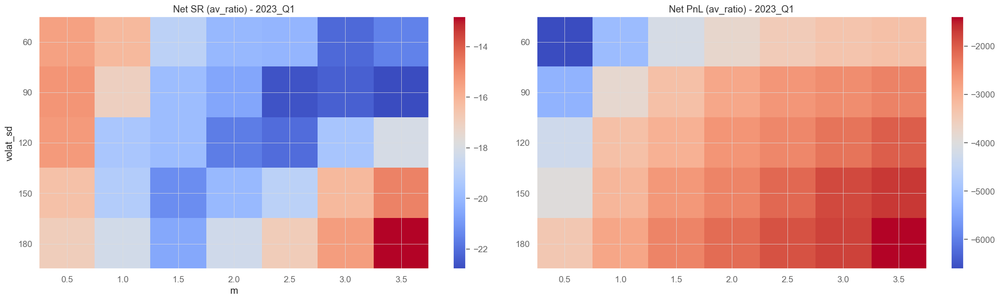

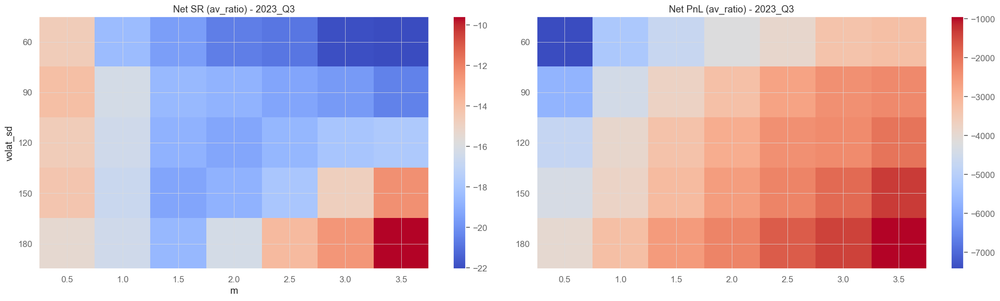

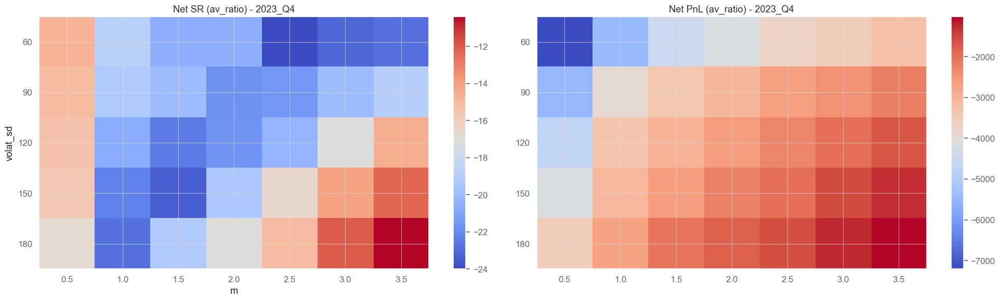

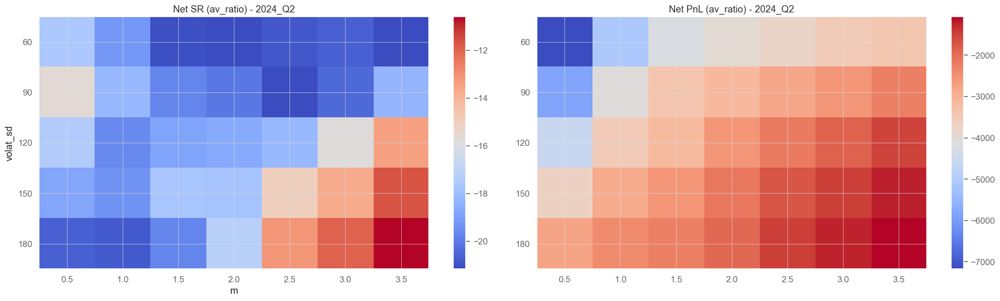

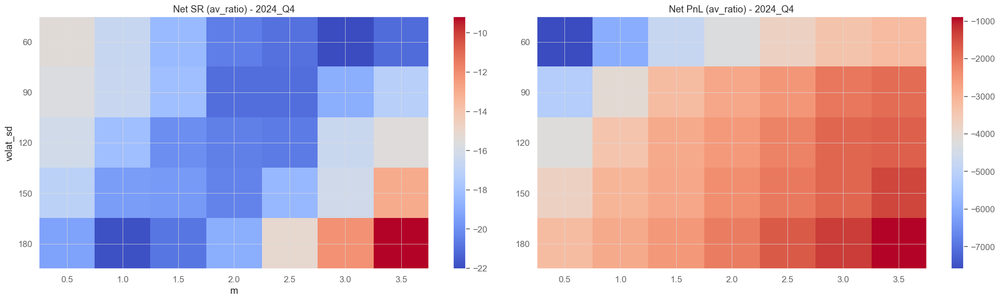

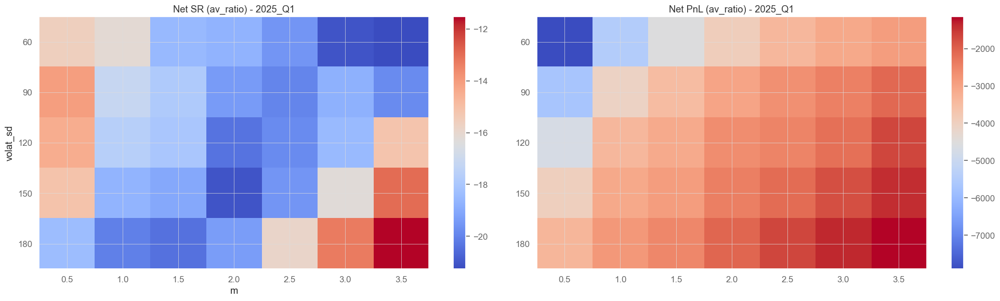

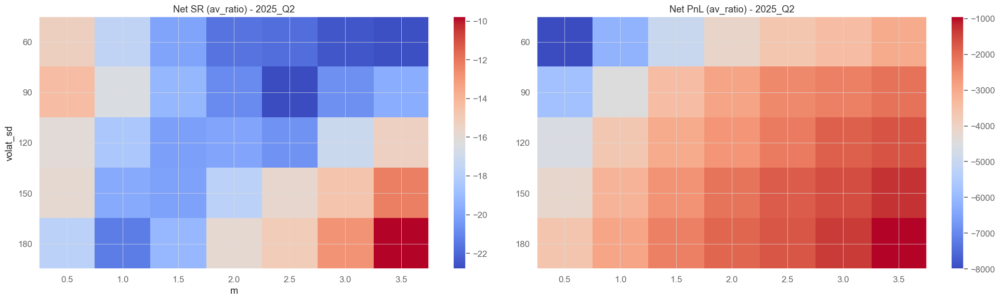

In [73]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_volatility[summary_all_volatility['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='volat_sd', columns='m', values='net_SR_avratio')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[0].set_title(f'Net SR (av_ratio) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='volat_sd', columns='m', values='net_PnL_avratio')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[1].set_title(f'Net PnL (av_ratio) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

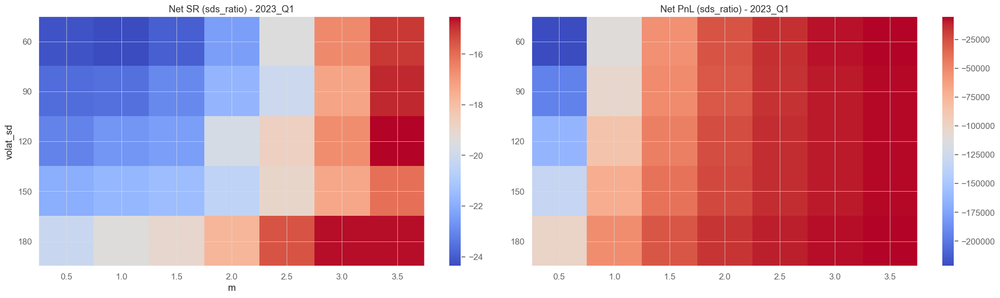

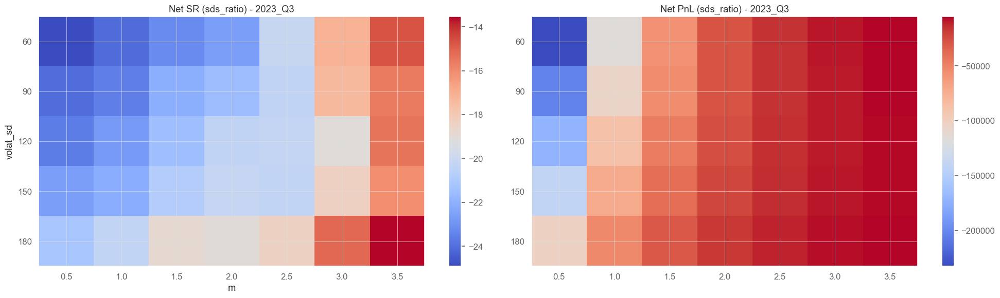

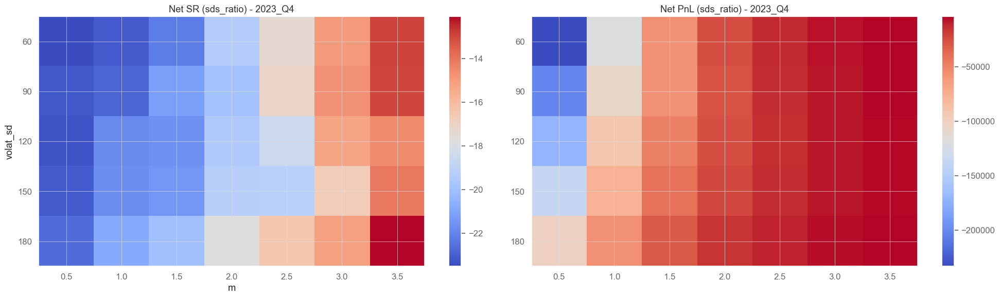

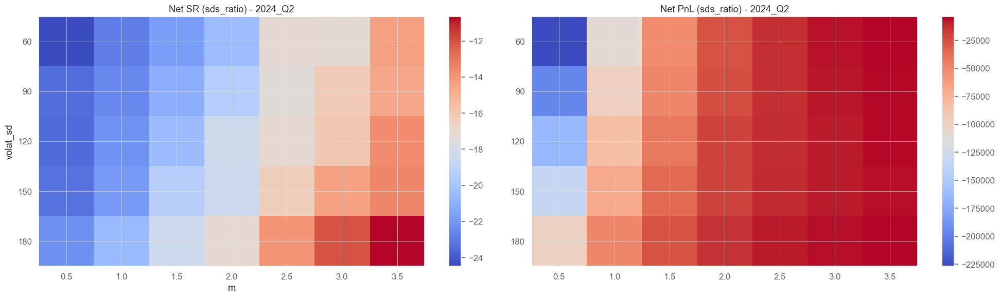

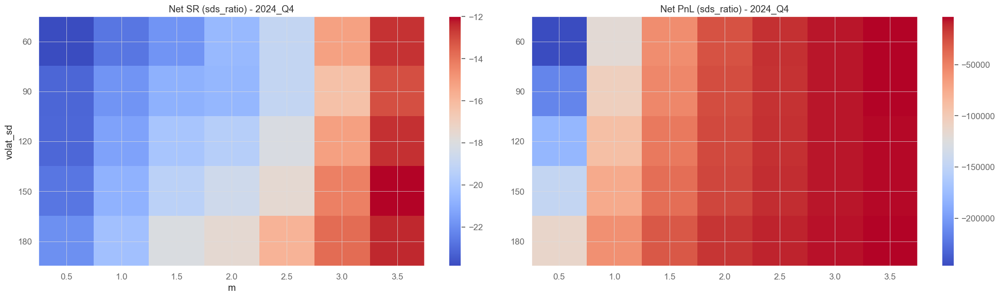

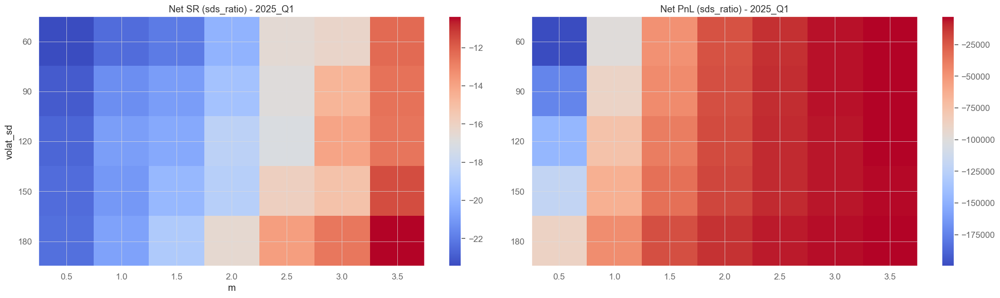

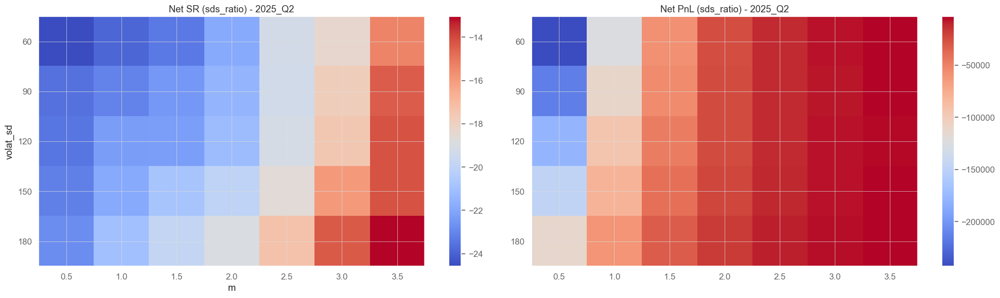

In [74]:
# Create separate heatmaps for each quarter
for quarter in quarters:
    quarter_data = summary_all_volatility[summary_all_volatility['quarter'] == quarter]
    
    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 6))
    
    # Plot momentum strategy heatmap
    quarter_data_pivot_mom = quarter_data.pivot(index='volat_sd', columns='m', values='net_SR_sdsratio')
    im1 = axes[0].imshow(quarter_data_pivot_mom.values, cmap='coolwarm', aspect='auto')
    axes[0].set_xticks(range(len(quarter_data_pivot_mom.columns)))
    axes[0].set_yticks(range(len(quarter_data_pivot_mom.index)))
    axes[0].set_xticklabels(quarter_data_pivot_mom.columns)
    axes[0].set_yticklabels(quarter_data_pivot_mom.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[0].set_title(f'Net SR (sds_ratio) - {quarter}')
    plt.colorbar(im1, ax=axes[0])
    
    # Plot mean reversion strategy heatmap
    quarter_data_pivot_mr = quarter_data.pivot(index='volat_sd', columns='m', values='net_PnL_sdsratio')
    im2 = axes[1].imshow(quarter_data_pivot_mr.values, cmap='coolwarm', aspect='auto')
    axes[1].set_xticks(range(len(quarter_data_pivot_mr.columns)))
    axes[1].set_yticks(range(len(quarter_data_pivot_mr.index)))
    axes[1].set_xticklabels(quarter_data_pivot_mr.columns)
    axes[1].set_yticklabels(quarter_data_pivot_mr.index)
    axes[0].set_xlabel('m')
    axes[0].set_ylabel('volat_sd')
    axes[1].set_title(f'Net PnL (sds_ratio) - {quarter}')
    plt.colorbar(im2, ax=axes[1])
    
    plt.tight_layout()
    plt.show()

### Filtering
Correlation

In [75]:
# Calculate correlations for each quarter
correlation_results_by_quarter = []

for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Calculate correlations for this quarter
    corr_p = quarter_data['AUD'].corr(quarter_data['CAD'])
    corr_r = quarter_data['r_AUD'].corr(quarter_data['r_CAD'])
    
    correlation_results_by_quarter.append({
        'Quarter': quarter,
        'Price_Correlation': corr_p,
        'Returns_Correlation': corr_r
    })
    
    print(f"\n{quarter}:")
    print(f"AUD and CAD closing price correlation: {corr_p:.4f}")
    print(f"AUD and CAD returns correlation: {corr_r:.4f}")

# Create a summary dataframe
correlation_summary_by_quarter = pd.DataFrame(correlation_results_by_quarter)
print("\n" + "="*50)
print("Summary of Correlations by Quarter:")
print(correlation_summary_by_quarter)


2023_Q1:
AUD and CAD closing price correlation: 0.9458
AUD and CAD returns correlation: 0.6304

2023_Q3:
AUD and CAD closing price correlation: 0.9548
AUD and CAD returns correlation: 0.5895

2023_Q4:
AUD and CAD closing price correlation: 0.8691
AUD and CAD returns correlation: 0.6680

2024_Q2:
AUD and CAD closing price correlation: 0.3618
AUD and CAD returns correlation: 0.7661

2024_Q4:
AUD and CAD closing price correlation: 0.9878
AUD and CAD returns correlation: 0.6552

2025_Q1:
AUD and CAD closing price correlation: 0.7657
AUD and CAD returns correlation: 0.7014

2025_Q2:
AUD and CAD closing price correlation: 0.8296
AUD and CAD returns correlation: 0.6316

Summary of Correlations by Quarter:
   Quarter  Price_Correlation  Returns_Correlation
0  2023_Q1           0.945800             0.630444
1  2023_Q3           0.954772             0.589466
2  2023_Q4           0.869077             0.667965
3  2024_Q2           0.361845             0.766076
4  2024_Q4           0.987786       

In [76]:
import warnings

warnings.filterwarnings('ignore')


2023_Q1:
Daily Price Correlation - Mean: 0.7115, Std: 0.2779
Daily Returns Correlation - Mean: 0.6207, Std: 0.1952


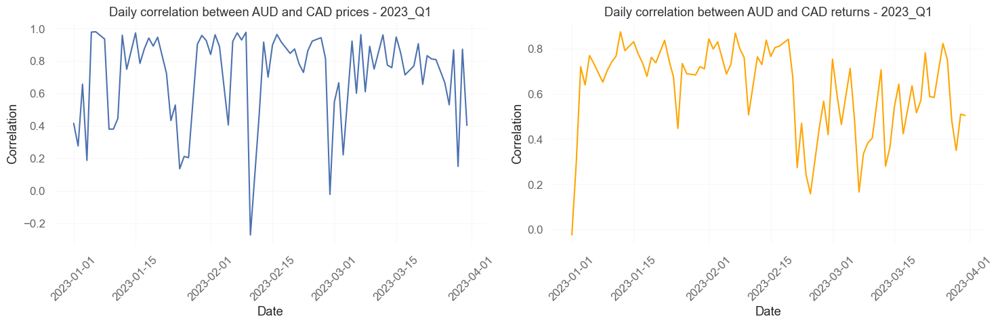


2023_Q3:
Daily Price Correlation - Mean: 0.6538, Std: 0.3256
Daily Returns Correlation - Mean: 0.6427, Std: 0.1838


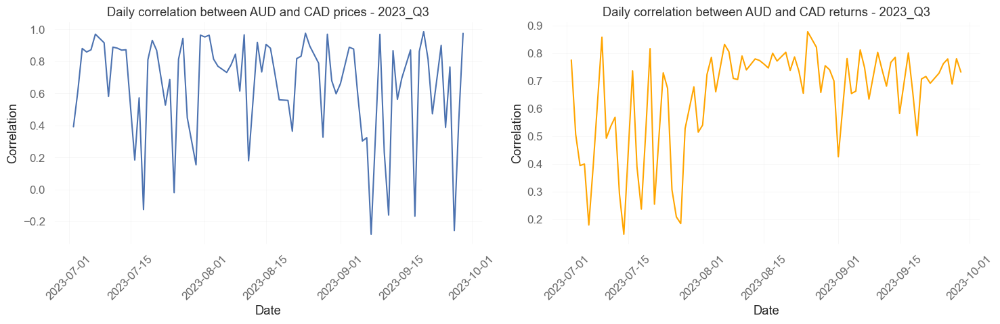


2023_Q4:
Daily Price Correlation - Mean: 0.6472, Std: 0.3650
Daily Returns Correlation - Mean: 0.6613, Std: 0.1400


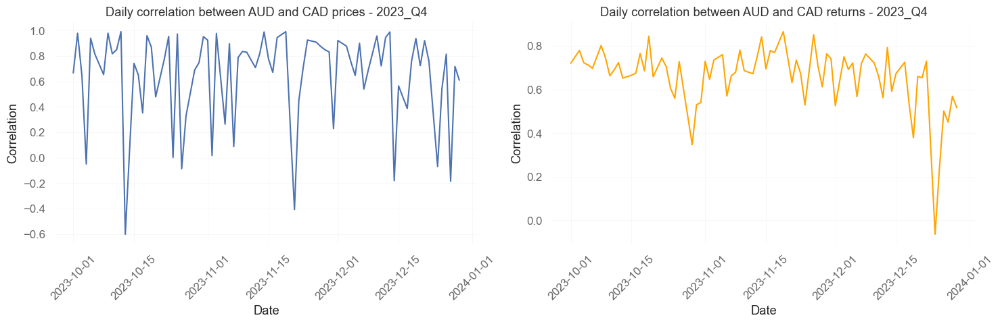


2024_Q2:
Daily Price Correlation - Mean: 0.7822, Std: 0.2787
Daily Returns Correlation - Mean: 0.7509, Std: 0.0899


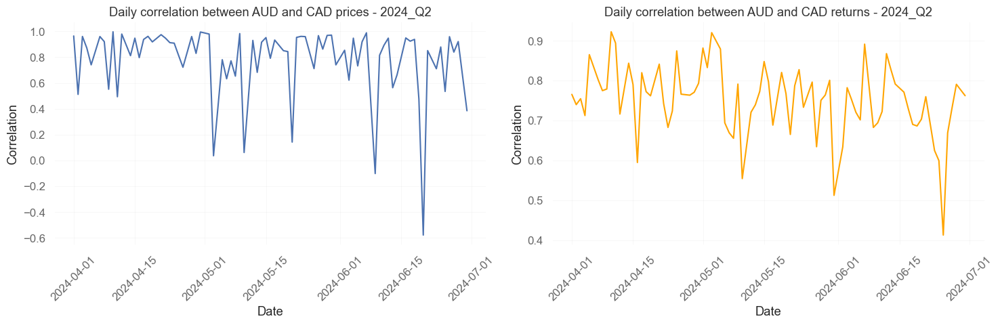


2024_Q4:
Daily Price Correlation - Mean: 0.5484, Std: 0.4379
Daily Returns Correlation - Mean: 0.6601, Std: 0.0959


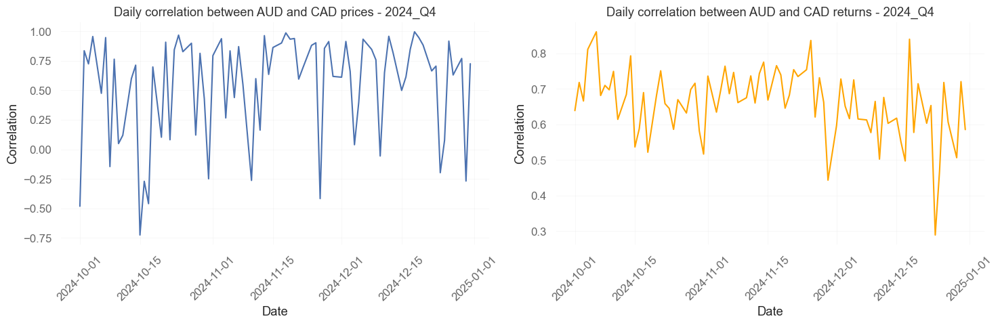


2025_Q1:
Daily Price Correlation - Mean: 0.6741, Std: 0.2981
Daily Returns Correlation - Mean: 0.6995, Std: 0.0844


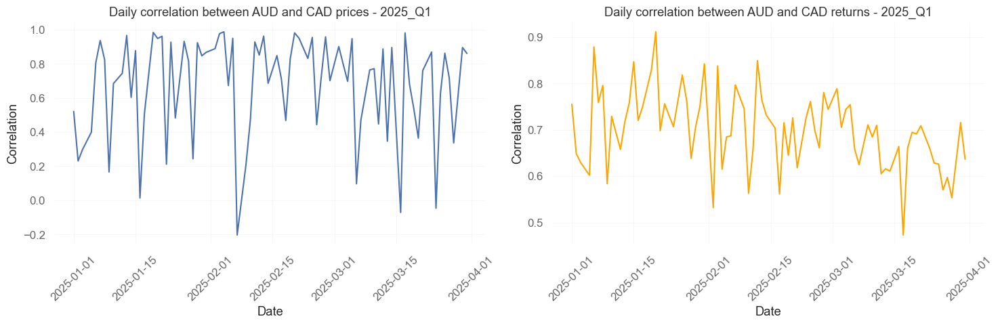


2025_Q2:
Daily Price Correlation - Mean: 0.6324, Std: 0.3710
Daily Returns Correlation - Mean: 0.6492, Std: 0.0779


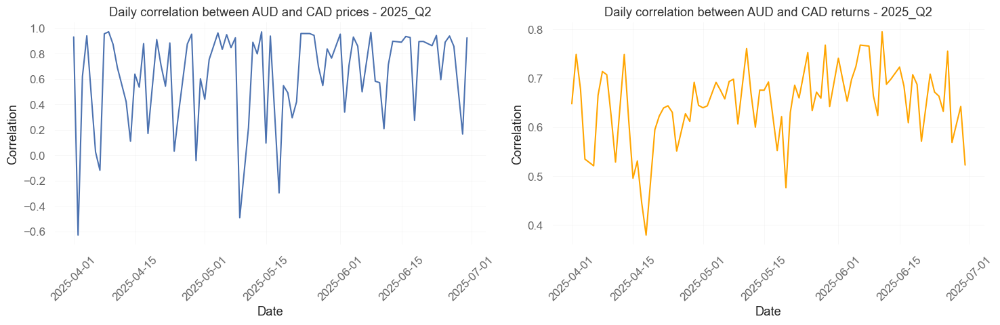


Summary by quarter:
        correlation_prices                                                    \
                     count      mean       std       min       25%       50%   
quarter                                                                        
2023_Q1               78.0  0.711493  0.277916 -0.272104  0.561364  0.813799   
2023_Q3               78.0  0.653837  0.325587 -0.279803  0.533572  0.782990   
2023_Q4               78.0  0.647205  0.364978 -0.601666  0.548960  0.760617   
2024_Q2               78.0  0.782246  0.278730 -0.578209  0.724297  0.885119   
2024_Q4               79.0  0.548379  0.437940 -0.725446  0.332712  0.705010   
2025_Q1               77.0  0.674094  0.298125 -0.203288  0.475665  0.771781   
2025_Q2               78.0  0.632361  0.371025 -0.628615  0.453015  0.781121   

                            correlation_returns                                \
              75%       max               count      mean       std       min   
quarter         

In [77]:
# Calculate daily correlations for each quarter separately
all_correlation_results = []

for quarter in quarters:
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter]
    
    # Calculate daily correlations for this quarter
    correlation_p_daily = quarter_data.resample("D").apply(lambda x: x['AUD'].corr(x['CAD']))
    correlation_r_daily = quarter_data.resample("D").apply(lambda x: x['r_AUD'].corr(x['r_CAD']))
    
    # Drop NaN values
    correlation_p_daily = correlation_p_daily.dropna()
    correlation_r_daily = correlation_r_daily.dropna()
    
    # Create a DataFrame with quarter indicator
    quarter_correlations = pd.DataFrame({
        'correlation_prices': correlation_p_daily,
        'correlation_returns': correlation_r_daily,
        'quarter': quarter
    })
    
    all_correlation_results.append(quarter_correlations)
    
    print(f"\n{quarter}:")
    print(f"Daily Price Correlation - Mean: {correlation_p_daily.mean():.4f}, Std: {correlation_p_daily.std():.4f}")
    print(f"Daily Returns Correlation - Mean: {correlation_r_daily.mean():.4f}, Std: {correlation_r_daily.std():.4f}")

    # Create figure with 2 subplots side by side
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot price correlation
    axes[0].plot(correlation_p_daily.index, correlation_p_daily.values)
    axes[0].set_title(f"Daily correlation between AUD and CAD prices - {quarter}")
    axes[0].set_xlabel("Date")
    axes[0].set_ylabel("Correlation")
    axes[0].grid(True, alpha=0.3)
    axes[0].tick_params(axis='x', rotation=45)
    
    # Plot returns correlation
    axes[1].plot(correlation_r_daily.index, correlation_r_daily.values, color='orange')
    axes[1].set_title(f"Daily correlation between AUD and CAD returns - {quarter}")
    axes[1].set_xlabel("Date")
    axes[1].set_ylabel("Correlation")
    axes[1].grid(True, alpha=0.3)
    axes[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

# Combine all quarters into one DataFrame
daily_correlations = pd.concat(all_correlation_results, axis=0)

# Save to file

print("\nSummary by quarter:")
print(daily_correlations.groupby('quarter')[['correlation_prices', 'correlation_returns']].describe())

Regression

In [78]:
# Lets calculate the regression coefficient between prices P1 and P2
# for the whole sample

import statsmodels.api as sm

# the OLS regression requires dropping NaN values

all_data_2_nonan = all_data_2.dropna(subset=["CAD", 'AUD', 'r_CAD', 'r_AUD'])

X = all_data_2_nonan["CAD"]
y = all_data_2_nonan["AUD"]
X = sm.add_constant(X)  # adding a constant term for intercept
model_ols = sm.OLS(y, X).fit()

print(model_ols.summary())

# the coefficient is negative (-0.1365)
# R2 = 0.098

                            OLS Regression Results                            
Dep. Variable:                    AUD   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                 1.741e+05
Date:                Sun, 18 Jan 2026   Prob (F-statistic):               0.00
Time:                        12:58:30   Log-Likelihood:             3.6000e+05
No. Observations:              124397   AIC:                        -7.200e+05
Df Residuals:                  124395   BIC:                        -7.200e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0118      0.002     -7.392      0.0

In [79]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

def regression_selected(df, y_col, x_col, add_const=True):

    # If the group is empty return NaNs
    if df.empty:
        return pd.Series({
            'beta': np.nan,
            'pvalue': np.nan,
            'tstat': np.nan,
            'r2': np.nan
        })

    y = df[y_col]
    X = df[[x_col]]  # keep as DataFrame

    if add_const:
        X = sm.add_constant(X)
        x_param_name = x_col      # slope name in params/pvalues/etc.
    else:
        x_param_name = x_col      # only column present

    model = sm.OLS(y, X).fit()

    return pd.Series({
        'beta':   model.params[x_param_name],
        'pvalue': model.pvalues[x_param_name],
        'tstat':  model.tvalues[x_param_name],
        'r2':     model.rsquared
    })

In [80]:
# Calculate regression for each quarter separately
regression_results_by_quarter = []
daily_regressions_P_all = []
daily_regressions_R_all = []

for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_data = all_data_2_nonan[all_data_2_nonan['quarter'] == quarter].copy()
    
    # Drop NaN values for regression
    quarter_data_clean = quarter_data.dropna(subset=['AUD', 'CAD'])

    daily_regressions_P = quarter_data_clean.resample("D").apply(
        lambda x: regression_selected(x, y_col='AUD', x_col='CAD', add_const=True)
    ).dropna()

    daily_regressions_R = quarter_data_clean.resample("D").apply(
        lambda x: regression_selected(x, y_col='r_AUD', x_col='r_CAD', add_const=True)
    ).dropna()

    daily_regressions_P['quarter'] = quarter
    daily_regressions_R['quarter'] = quarter

    daily_regressions_P_all.append(daily_regressions_P)
    daily_regressions_R_all.append(daily_regressions_R)

# Create summary dataframe
daily_regressions_P_all = pd.DataFrame(pd.concat(daily_regressions_P_all))
daily_regressions_R_all = pd.DataFrame(pd.concat(daily_regressions_R_all))

print("\n" + "="*50)
print("Summary of Regression Results by Quarter:")
print(daily_regressions_P_all)
print(daily_regressions_R_all)

Processing quarter: 2023_Q1
Processing quarter: 2023_Q3
Processing quarter: 2023_Q4
Processing quarter: 2024_Q2
Processing quarter: 2024_Q4
Processing quarter: 2025_Q1
Processing quarter: 2025_Q2

Summary of Regression Results by Quarter:
                               beta         pvalue      tstat        r2  \
2023-01-01 00:00:00+00:00  0.316548   2.249393e-03   3.205064  0.157378   
2023-01-02 00:00:00+00:00  0.323482   4.230602e-06   4.696906  0.076319   
2023-01-03 00:00:00+00:00  0.974553   2.655510e-35  14.383759  0.431123   
2023-01-04 00:00:00+00:00  0.162867   1.604716e-03   3.186990  0.035870   
2023-01-05 00:00:00+00:00  1.929964  1.857609e-188  77.873798  0.956922   
...                             ...            ...        ...       ...   
2025-06-25 00:00:00+00:00  1.940653   6.037669e-95  32.196175  0.791538   
2025-06-26 00:00:00+00:00  0.602127  1.621259e-128  45.091675  0.881626   
2025-06-27 00:00:00+00:00  0.632238   2.436444e-60  23.686927  0.734318   
2025-06-29 

Cointegration

In [81]:
# lets use PP and KPSS tests for cointegration
# based on the functions from lab03
# extended to control for empty dataframes

from arch.unitroot import PhillipsPerron, KPSS

# the function to get residuals from OLS regression
def _eg_residuals(df: pd.DataFrame, col1: str, col2: str):
    X = sm.add_constant(df[col1].values, has_constant="add")
    y = df[col2].values
    model = sm.OLS(y, X).fit()
    return model.resid

# the function for PP p-value
def eg_pp_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                 trend: str = "c") -> float:
    # If the group is empty return NaN
    if df.empty:
        return np.nan

    resid = _eg_residuals(df, col1, col2)
    return float(PhillipsPerron(resid, trend=trend).pvalue)

# the function for KPSS p-value
def eg_kpss_pvalue(df: pd.DataFrame, col1: str, col2: str, 
                   trend: str = "c") -> float:
    # If the group is empty return NaN
    if df.empty:
        return np.nan
    resid = _eg_residuals(df, col1, col2)
    return float(KPSS(resid, trend=trend).pvalue)

In [82]:
print("p-value of PP test:", eg_pp_pvalue(all_data_2_nonan, "AUD", "CAD"))
print("p-value of KPSS test:", eg_kpss_pvalue(all_data_2_nonan, "AUD", "CAD"))

p-value of PP test: 0.21130703401942896
p-value of KPSS test: 0.0001


In [83]:
# how about daily cointegration tests?

# Group by date and calculate cointegration tests for each day
# Calculate daily cointegration tests for each quarter separately
daily_PP_all = []
daily_KPSS_all = []

for quarter in quarters:
    print(f"Processing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_data = all_data_2[all_data_2['quarter'] == quarter].dropna(subset=['AUD', 'CAD'])
    
    # Group by date and calculate cointegration tests for each day
    for date, group in quarter_data.groupby(quarter_data.index.date):
        if len(group) > 10:  # Ensure enough data points for the test
            try:
                pp_pvalue = eg_pp_pvalue(group, "AUD", "CAD")
                daily_PP_all.append({'date': date, 'pvalue': pp_pvalue, 'quarter': quarter})
            except:
                pass
            
            try:
                kpss_pvalue = eg_kpss_pvalue(group, "AUD", "CAD")
                daily_KPSS_all.append({'date': date, 'pvalue': kpss_pvalue, 'quarter': quarter})
            except:
                pass

# Convert to DataFrames with date index
daily_PP_tests = pd.DataFrame(daily_PP_all).set_index('date')
daily_KPSS_tests = pd.DataFrame(daily_KPSS_all).set_index('date')

# Remove NaN values
daily_PP_tests = daily_PP_tests.dropna(subset=['pvalue'])
daily_KPSS_tests = daily_KPSS_tests.dropna(subset=['pvalue'])

print(f"\nDaily PP tests: {len(daily_PP_tests)} days")
print(f"Daily KPSS tests: {len(daily_KPSS_tests)} days")

Processing quarter: 2023_Q1
Processing quarter: 2023_Q3
Processing quarter: 2023_Q4
Processing quarter: 2024_Q2
Processing quarter: 2024_Q4
Processing quarter: 2025_Q1
Processing quarter: 2025_Q2

Daily PP tests: 546 days
Daily KPSS tests: 546 days


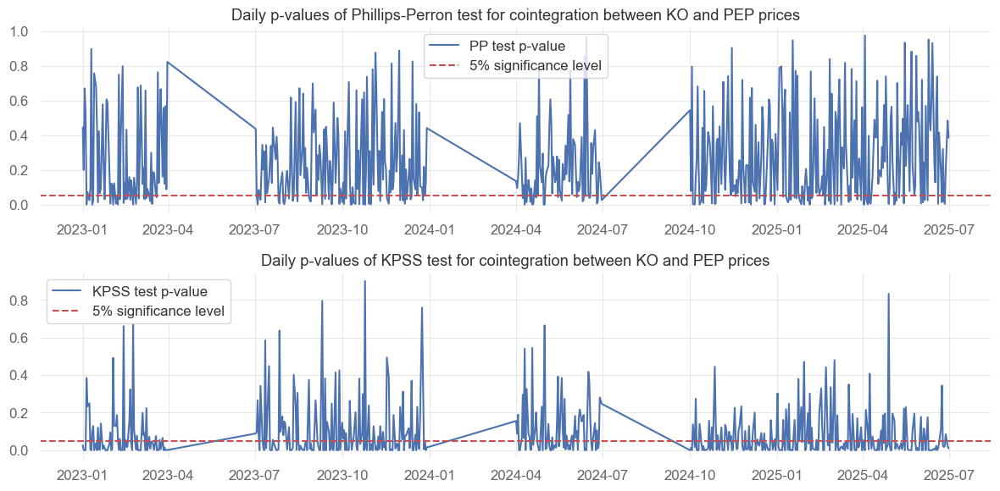

In [84]:
# lets plot p-values of both tests
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(daily_PP_tests['pvalue'], label="PP test p-value")
plt.axhline(y=0.05, color='r', linestyle='--', label='5% significance level')
plt.title("Daily p-values of Phillips-Perron test for cointegration between KO and PEP prices")
plt.legend()
plt.subplot(2, 1, 2)
plt.plot(daily_KPSS_tests['pvalue'], label="KPSS test p-value")
plt.axhline(y=0.05, color='r', linestyle='--', label='5% significance level')
plt.title("Daily p-values of KPSS test for cointegration between KO and PEP prices")
plt.legend()
plt.tight_layout()
plt.show()

In [85]:
print("Share of days with PP test p-value below 0.05 (indicating cointegration):", 
      (daily_PP_tests['pvalue'] < 0.05).sum() / len(daily_PP_tests))

# KPSS test (null: cointegration)
print("Share of days with KPSS test p-value above 0.05 (indicating cointegration):", 
      (daily_KPSS_tests['pvalue'] > 0.05).sum() / len(daily_KPSS_tests))


Share of days with PP test p-value below 0.05 (indicating cointegration): 0.27106227106227104
Share of days with KPSS test p-value above 0.05 (indicating cointegration): 0.40476190476190477


In [86]:
daily_PP_tests.index = pd.to_datetime(daily_PP_tests.index).tz_localize(all_data_2_nonan.index.tz)
daily_KPSS_tests.index = pd.to_datetime(daily_KPSS_tests.index).tz_localize(all_data_2_nonan.index.tz)

In [87]:
# Merge all dataframes using outer join to preserve all dates
combined_daily_stats = daily_correlations.copy()

# Merge regression results for prices
combined_daily_stats = combined_daily_stats.merge(
    daily_regressions_P_all.add_prefix("regression_price_"),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge regression results for returns
combined_daily_stats = combined_daily_stats.merge(
    daily_regressions_R_all.add_prefix("regression_return_"),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge PP test results
combined_daily_stats = combined_daily_stats.merge(
    daily_PP_tests[['pvalue']].rename(columns={'pvalue': 'PP_pvalue'}),
    left_index=True,
    right_index=True,
    how='outer'
)

# Merge KPSS test results
combined_daily_stats = combined_daily_stats.merge(
    daily_KPSS_tests[['pvalue']].rename(columns={'pvalue': 'KPSS_pvalue'}),
    left_index=True,
    right_index=True,
    how='outer'
)

combined_daily_stats.head()

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-01 00:00:00+00:00,0.415786,-0.023913,2023_Q1,0.316548,2.249393e-03,3.205064,0.157378,2023_Q1,-0.038440,8.598514e-01,-0.177393,0.000572,2023_Q1,0.445759,0.025710
2023-01-02 00:00:00+00:00,0.276245,0.296780,2023_Q1,0.323482,4.230602e-06,4.696906,0.076319,2023_Q1,0.406509,7.158261e-07,5.078222,0.088078,2023_Q1,0.199830,0.002374
2023-01-03 00:00:00+00:00,0.657072,0.719906,2023_Q1,0.974553,2.655510e-35,14.383759,0.431123,2023_Q1,1.155393,3.374118e-45,17.137694,0.518264,2023_Q1,0.670497,0.000100
2023-01-04 00:00:00+00:00,0.187594,0.639303,2023_Q1,0.162867,1.604716e-03,3.186990,0.035870,2023_Q1,1.221040,5.326549e-33,13.736849,0.408708,2023_Q1,0.527440,0.000100
2023-01-05 00:00:00+00:00,0.978183,0.769300,2023_Q1,1.929964,1.857609e-188,77.873798,0.956922,2023_Q1,1.369859,4.755979e-55,19.895376,0.591822,2023_Q1,0.000675,0.383904


In [88]:
combined_daily_stats.index = combined_daily_stats.index.tz_convert(None)

In [89]:
combined_daily_stats

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-01,0.415786,-0.023913,2023_Q1,0.316548,2.249393e-03,3.205064,0.157378,2023_Q1,-0.038440,8.598514e-01,-0.177393,0.000572,2023_Q1,0.445759,0.025710
2023-01-02,0.276245,0.296780,2023_Q1,0.323482,4.230602e-06,4.696906,0.076319,2023_Q1,0.406509,7.158261e-07,5.078222,0.088078,2023_Q1,0.199830,0.002374
2023-01-03,0.657072,0.719906,2023_Q1,0.974553,2.655510e-35,14.383759,0.431123,2023_Q1,1.155393,3.374118e-45,17.137694,0.518264,2023_Q1,0.670497,0.000100
2023-01-04,0.187594,0.639303,2023_Q1,0.162867,1.604716e-03,3.186990,0.035870,2023_Q1,1.221040,5.326549e-33,13.736849,0.408708,2023_Q1,0.527440,0.000100
2023-01-05,0.978183,0.769300,2023_Q1,1.929964,1.857609e-188,77.873798,0.956922,2023_Q1,1.369859,4.755979e-55,19.895376,0.591822,2023_Q1,0.000675,0.383904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-06-25,0.889741,0.632398,2025_Q2,1.940653,6.037669e-95,32.196175,0.791538,2025_Q2,1.091444,4.026687e-32,13.488698,0.399927,2025_Q2,0.033371,0.017284
2025-06-26,0.938669,0.755403,2025_Q2,0.602127,1.621259e-128,45.091675,0.881626,2025_Q2,1.288458,4.843365e-52,19.047846,0.570633,2025_Q2,0.004642,0.022279
2025-06-27,0.856923,0.568938,2025_Q2,0.632238,2.436444e-60,23.686927,0.734318,2025_Q2,0.625430,5.598407e-19,9.856889,0.323690,2025_Q2,0.204057,0.084853
2025-06-29,0.167182,0.642351,2025_Q2,0.090283,1.703899e-01,1.385623,0.027459,2025_Q2,0.693906,2.047675e-09,6.911391,0.412615,2025_Q2,0.484399,0.022592


In [90]:
combined_daily_stats.index = combined_daily_stats.index + pd.to_timedelta(np.where(combined_daily_stats.index.day_name() == "Friday", "3D", "1D")) 

combined_daily_stats.head()

,correlation_prices,correlation_returns,quarter,regression_price_beta,regression_price_pvalue,regression_price_tstat,regression_price_r2,regression_price_quarter,regression_return_beta,regression_return_pvalue,regression_return_tstat,regression_return_r2,regression_return_quarter,PP_pvalue,KPSS_pvalue
2023-01-02,0.415786,-0.023913,2023_Q1,0.316548,2.249393e-03,3.205064,0.157378,2023_Q1,-0.038440,8.598514e-01,-0.177393,0.000572,2023_Q1,0.445759,0.025710
2023-01-03,0.276245,0.296780,2023_Q1,0.323482,4.230602e-06,4.696906,0.076319,2023_Q1,0.406509,7.158261e-07,5.078222,0.088078,2023_Q1,0.199830,0.002374
2023-01-04,0.657072,0.719906,2023_Q1,0.974553,2.655510e-35,14.383759,0.431123,2023_Q1,1.155393,3.374118e-45,17.137694,0.518264,2023_Q1,0.670497,0.000100
2023-01-05,0.187594,0.639303,2023_Q1,0.162867,1.604716e-03,3.186990,0.035870,2023_Q1,1.221040,5.326549e-33,13.736849,0.408708,2023_Q1,0.527440,0.000100
2023-01-06,0.978183,0.769300,2023_Q1,1.929964,1.857609e-188,77.873798,0.956922,2023_Q1,1.369859,4.755979e-55,19.895376,0.591822,2023_Q1,0.000675,0.383904


In [91]:
# based on the combined daily statistics
# lets create filtering rules
# storing them as new columns, where
# 1 means that the filter condition is met (trade on that day)
# and 0 means that it is not met (do NOT trade on that day)

# based on correlation between prices
combined_daily_stats['filter_correlation_prices_06'] = (combined_daily_stats['correlation_prices'] > 0.6) * 1
combined_daily_stats['filter_correlation_prices_07'] = (combined_daily_stats['correlation_prices'] > 0.7) * 1
combined_daily_stats['filter_correlation_prices_08'] = (combined_daily_stats['correlation_prices'] > 0.8) * 1
combined_daily_stats['filter_correlation_prices_09'] = (combined_daily_stats['correlation_prices'] > 0.9) * 1
# based on correlation between returns
combined_daily_stats['filter_correlation_returns_06'] = (combined_daily_stats['correlation_returns'] > 0.6) * 1
combined_daily_stats['filter_correlation_returns_07'] = (combined_daily_stats['correlation_returns'] > 0.7) * 1
combined_daily_stats['filter_correlation_returns_08'] = (combined_daily_stats['correlation_returns'] > 0.8) * 1
# based on regression for prices - significant beta above some threshold
combined_daily_stats['filter_regression_price_beta_sig_above0'] = ((combined_daily_stats['regression_price_beta'] > 0) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_price_beta_sig_above025'] = ((combined_daily_stats['regression_price_beta'] > 0.25) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_price_beta_sig_above05'] = ((combined_daily_stats['regression_price_beta'] > 0.5) & (combined_daily_stats['regression_price_pvalue'] < 0.05)) * 1
# based on regression for returns - significant beta above some threshold
combined_daily_stats['filter_regression_return_beta_sig_above0'] = ((combined_daily_stats['regression_return_beta'] > 0) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_return_beta_sig_above025'] = ((combined_daily_stats['regression_return_beta'] > 0.25) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
combined_daily_stats['filter_regression_return_beta_sig_above05'] = ((combined_daily_stats['regression_return_beta'] > 0.5) & (combined_daily_stats['regression_return_pvalue'] < 0.05)) * 1
# cointegration based filters
combined_daily_stats['filter_PP_cointegration_10'] = (combined_daily_stats['PP_pvalue'] < 0.1) * 1
combined_daily_stats['filter_PP_cointegration_05'] = (combined_daily_stats['PP_pvalue'] < 0.05) * 1
combined_daily_stats['filter_PP_cointegration_01'] = (combined_daily_stats['PP_pvalue'] < 0.01) * 1
combined_daily_stats['filter_KPSS_cointegration_10'] = (combined_daily_stats['KPSS_pvalue'] > 0.1) * 1
combined_daily_stats['filter_KPSS_cointegration_05'] = (combined_daily_stats['KPSS_pvalue'] > 0.05) * 1
combined_daily_stats['filter_KPSS_cointegration_01'] = (combined_daily_stats['KPSS_pvalue'] > 0.01) * 1

In [92]:
summary_daily = pd.DataFrame()

# Loop through each quarter
for quarter in quarters:
        print(f"Processing quarter: {quarter}")
        
        # Filter data for the current quarter
        quarter_mask = all_data_2["quarter"] == quarter
        quarter_data = all_data_2[quarter_mask].copy()
        
        # Fixed parameters based on your analysis
        volat_sd = 180
        m = 3.5
        
        print(f"  volat_sd: {volat_sd}, m: {m}")
        
        # Calculate signal and bounds
        signal_avratio = quarter_data["spread_avratio"]
        std_spread_avratio = signal_avratio.rolling(window=volat_sd).std()
        upper_bound_avratio = m * std_spread_avratio
        lower_bound_avratio = -m * std_spread_avratio
        
        # Position
        pos_avratio = positionVB(signal=signal_avratio,
                                                          lower=lower_bound_avratio,
                                                          upper=upper_bound_avratio,
                                                          pos_flat=pos_flat[quarter_mask],
                                                          strategy="mr")
        
        # Number of transactions
        n_trans_avratio = np.abs(np.diff(pos_avratio, prepend=0))
        n_trans_avratio = pd.Series(n_trans_avratio, index=quarter_data.index)
        
        # Calculate PnL
        pnl_gross_avratio = pos_avratio * (quarter_data["AUD"].diff() - quarter_data["av_ratio"] * quarter_data["CAD"].diff())
        pnl_net_avratio = pnl_gross_avratio - n_trans_avratio * (15 + quarter_data["av_ratio"] * 10)
        
        # Aggregate to daily
        pnl_gross_avratio_daily = pnl_gross_avratio.resample("D").sum().dropna()
        pnl_net_avratio_daily = pnl_net_avratio.resample("D").sum().dropna()
        n_trans_avratio_daily = n_trans_avratio.resample("D").sum().dropna()
        
        # Calculate summary measures
        gross_SR_avratio = mySR(pnl_gross_avratio_daily, scale=252)
        net_SR_avratio = mySR(pnl_net_avratio_daily, scale=252)
        gross_PnL_avratio = pnl_gross_avratio_daily.sum()
        net_PnL_avratio = pnl_net_avratio_daily.sum()
        av_daily_ntrans_avratio = n_trans_avratio_daily.mean()
        
        print(f"  Net SR: {net_SR_avratio:.4f}, Net PnL: {net_PnL_avratio:.2f}")
        
        # Create summary dataframe with quarter indicator
        summary = pd.DataFrame({
            'volat_sd': [volat_sd],
            'm': [m],
            'quarter': [quarter],
            'gross_SR_avratio': [gross_SR_avratio],
            'net_SR_avratio': [net_SR_avratio],
            'gross_PnL_avratio': [gross_PnL_avratio],
            'net_PnL_avratio': [net_PnL_avratio],
            'av_daily_ntrans_avratio': [av_daily_ntrans_avratio],
        })

        summary_daily_stats = pd.DataFrame({
                'quarter': quarter,
                'pnl_gross_avratio': pnl_gross_avratio_daily,
                'pnl_net_avratio': pnl_net_avratio_daily,
                'n_trans_avratio': n_trans_avratio_daily})
        
        summary_daily = pd.concat([summary_daily, summary_daily_stats], ignore_index=False)

        # Append to results (create if doesn't exist)
        if 'summary_VB_optimal' not in locals():
            summary_VB_optimal = summary.copy()
        else:
            summary_VB_optimal = pd.concat([summary_VB_optimal, summary], ignore_index=True)



Processing quarter: 2023_Q1
  volat_sd: 180, m: 3.5
  Net SR: -12.8135, Net PnL: -1746.11
Processing quarter: 2023_Q3
  volat_sd: 180, m: 3.5
  Net SR: -9.5801, Net PnL: -1190.22
Processing quarter: 2023_Q4
  volat_sd: 180, m: 3.5
  Net SR: -10.3921, Net PnL: -1285.87
Processing quarter: 2024_Q2
  volat_sd: 180, m: 3.5
  Net SR: -10.5829, Net PnL: -1343.65
Processing quarter: 2024_Q4
  volat_sd: 180, m: 3.5
  Net SR: -9.1651, Net PnL: -1110.52
Processing quarter: 2025_Q1
  volat_sd: 180, m: 3.5
  Net SR: -11.5177, Net PnL: -1440.20
Processing quarter: 2025_Q2
  volat_sd: 180, m: 3.5
  Net SR: -9.7699, Net PnL: -1193.25


In [93]:
daily_pnls = summary_daily.copy()
daily_pnls.index = daily_pnls.index.tz_localize(None)

# Ensure combined_daily_stats index is also timezone-naive
combined_daily_stats_notz = combined_daily_stats.copy()
if combined_daily_stats_notz.index.tz is not None:
    combined_daily_stats_notz.index = combined_daily_stats_notz.index.tz_localize(None)

# Merge on index to ensure proper alignment
daily_pnls_filters = daily_pnls.merge(
    combined_daily_stats_notz.filter(regex='^filter_'),
    left_index=True,
    right_index=True,
    how='left'
)

daily_pnls_filters.head()

,quarter,pnl_gross_avratio,pnl_net_avratio,n_trans_avratio,filter_correlation_prices_06,filter_correlation_prices_07,filter_correlation_prices_08,filter_correlation_prices_09,filter_correlation_returns_06,filter_correlation_returns_07,...,filter_regression_price_beta_sig_above05,filter_regression_return_beta_sig_above0,filter_regression_return_beta_sig_above025,filter_regression_return_beta_sig_above05,filter_PP_cointegration_10,filter_PP_cointegration_05,filter_PP_cointegration_01,filter_KPSS_cointegration_10,filter_KPSS_cointegration_05,filter_KPSS_cointegration_01
2023-01-01,2023_Q1,0.00000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02,2023_Q1,0.00000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2023-01-03,2023_Q1,0.00000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-04,2023_Q1,0.00000,0.000000,0.0,1.0,0.0,0.0,0.0,1.0,1.0,...,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-01-05,2023_Q1,-0.00068,-48.516378,2.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [94]:
def mySR(x, scale):
    return np.sqrt(scale) * np.nanmean(x) / np.nanstd(x)

print("Gross PnL SR:", mySR(daily_pnls['pnl_gross_avratio'], scale = 252))
print("Net PnL SR:", mySR(daily_pnls['pnl_net_avratio'], scale = 252))

# and average number of trades per day
print("Average number of trades per day:", daily_pnls['n_trans_avratio'].mean())

Gross PnL SR: 0.2883517281252915
Net PnL SR: -10.520717859945952
Average number of trades per day: 0.6151419558359621


In [95]:
pnl_gross_sdsratio_filtered = daily_pnls_filters['pnl_gross_avratio'] * daily_pnls_filters['filter_correlation_prices_06']
pnl_net_sdsratio_filtered = daily_pnls_filters['pnl_net_avratio'] * daily_pnls_filters['filter_correlation_prices_06']

print("Gross PnL SR after applying filter_correlation_prices_06:", 
      mySR(pnl_gross_sdsratio_filtered, scale = 252))
print("Net PnL SR after applying filter_correlation_prices_06:", 
      mySR(pnl_net_sdsratio_filtered, scale = 252))

# and average number of trades per day
n_trades_filtered = daily_pnls_filters['n_trans_avratio'] * daily_pnls_filters['filter_correlation_prices_06']
print("Average number of trades per day after applying filter_correlation_prices_06:", n_trades_filtered.mean())

# much better results!
# (although still negative in net terms)

Gross PnL SR after applying filter_correlation_prices_06: 0.025026403147384014
Net PnL SR after applying filter_correlation_prices_06: -10.229339773046375
Average number of trades per day after applying filter_correlation_prices_06: 0.5970425138632163


In [96]:
results_filters_by_quarter = []

for quarter in quarters:
    print(f"\nProcessing quarter: {quarter}")
    
    # Filter data for the current quarter
    quarter_pnls = daily_pnls_filters[daily_pnls_filters['quarter'] == quarter]
    
    for col in daily_pnls_filters.columns:
        if col.startswith('filter_'):
            pnl_gross_filtered = quarter_pnls['pnl_gross_avratio'] * quarter_pnls[col]
            pnl_net_filtered = quarter_pnls['pnl_net_avratio'] * quarter_pnls[col]
            n_trades_filtered = quarter_pnls['n_trans_avratio'] * quarter_pnls[col]
            
            results_filters_by_quarter.append({
                'quarter': quarter,
                'filter': col,
                'gross_SR': mySR(pnl_gross_filtered, scale=252),
                'net_SR': mySR(pnl_net_filtered, scale=252),
                'gross_PnL': pnl_gross_filtered.sum(),
                'net_PnL': pnl_net_filtered.sum(),
                'avg_n_trades_per_day': n_trades_filtered.mean()
            })

results_filters_by_quarter_df = pd.DataFrame(results_filters_by_quarter)



Processing quarter: 2023_Q1

Processing quarter: 2023_Q3

Processing quarter: 2023_Q4

Processing quarter: 2024_Q2

Processing quarter: 2024_Q4

Processing quarter: 2025_Q1

Processing quarter: 2025_Q2


In [97]:
results_filters_by_quarter_df.loc[results_filters_by_quarter_df.groupby('quarter')['net_SR'].idxmax()]

,quarter,filter,gross_SR,net_SR,gross_PnL,net_PnL,avg_n_trades_per_day
15,2023_Q1,filter_PP_cointegration_01,-2.677057,-3.715908,-0.009534,-194.776508,0.103896
25,2023_Q3,filter_correlation_returns_08,-1.885979,-2.592261,-0.000250,-95.301250,0.051948
44,2023_Q4,filter_correlation_returns_08,1.862162,-3.174861,0.001343,-142.961899,0.076923
72,2024_Q2,filter_PP_cointegration_01,-2.537682,-3.218095,-0.001607,-143.423109,0.078947
82,2024_Q4,filter_correlation_returns_08,1.809068,-1.809068,0.000102,-48.041446,0.025641
101,2025_Q1,filter_correlation_returns_08,1.507872,-3.196281,0.001823,-144.007176,0.077922
129,2025_Q2,filter_PP_cointegration_01,-3.236309,-4.154394,-0.004995,-237.952174,0.128205
